# Porto League Performance since 20/21
    - Assessed by rolling average of some team performance metrics

# Imports

In [1]:
import locale
import sys

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import pandas as pd
import seaborn as sns
import soccerdata as sd
from highlight_text import fig_text

sys.path.append(r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects")
import urllib
from shutil import which
from urllib.request import urlopen

import function_town as ft
from PIL import Image


[04/08/25 12:55:13] INFO     No custom team name replacements found. You can configure these in       ]8;id=773851;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\_config.py\_config.py]8;;\:]8;id=173990;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\_config.py#91\91]8;;\
                             C:\Users\Vitor\soccerdata\config\teamname_replacements.json.                          

                    INFO     Custom league dict loaded from                                          ]8;id=23694;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\_config.py\_config.py]8;;\:]8;id=290195;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\_config.py#195\195]8;;\
                             C:\Users\Vitor\soccerdata\config\league_dict.json.                                    

# Data Scraping

## Scraping team match stats

In [2]:
# Check available leagues

locale.setlocale(locale.LC_TIME, "en_US.UTF-8")

sd.FotMob.available_leagues()

['ENG-Premier League',
 'ESP-La Liga',
 'FRA-Ligue 1',
 'GER-Bundesliga',
 'INT-European Championship',
 "INT-Women's World Cup",
 'INT-World Cup',
 'ITA-Serie A',
 'PRT-Liga Portugal']

In [ ]:
# Scraping team match stats For Primeira Liga 20/21

locale.setlocale(
    locale.LC_TIME, "en_US.UTF-8"
)  # This line is used in every cell before using code from socceradata, throughout the notebook, to avoid errors related to date formats
pt_2021 = sd.FotMob(
    leagues="PRT-Liga Portugal", seasons="2020/2021", no_cache=False, no_store=False
)
print(pt_2021.__doc__)

tms_primeira_liga_2021 = pt_2021.read_team_match_stats(opponent_stats=True)
tms_primeira_liga_2021.head()

[4/7/2025 11:41:04 PM] INFO     Saving cached data to C:\Users\Vitor\soccerdata\data\FotMob          ]8;id=885997;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\_common.py\_common.py]8;;\:]8;id=649160;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\_common.py#263\263]8;;\

Provides pd.DataFrames from data available at http://www.fotmob.com.

    Data will be downloaded as necessary and cached locally in
    ``~/soccerdata/data/FotMob``.

    Parameters
    ----------
    leagues : string or iterable, optional
        IDs of Leagues to include.
    seasons : string, int or list, optional
        Seasons to include. Supports multiple formats.
        Examples: '16-17'; 2016; '2016-17'; [14, 15, 16]
    proxy : 'tor' or dict or list(dict) or callable, optional
        Use a proxy to hide your IP address. Valid options are:
            - 'tor': Uses the Tor network. Tor should be running in
              the background on port 9050.
            - dict: A dictionary with the proxy to use. The dict should be
              a mapping of supported protocols to proxy addresses. For example::

                  {
                      'http': 'http://10.10.1.10:3128',
                      'https': 'http://10.10.1.10:1080',
                  }

            - list(d

[4/7/2025 11:41:05 PM] INFO     [1/306] Retrieving game with id=3421632                               ]8;id=248171;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=386465;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [2/306] Retrieving game with id=3421643                               ]8;id=368385;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=665395;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [3/306] Retrieving game with id=3421641                               ]8;id=215157;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=28398;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [4/306] Retrieving game with id=3421645                               ]8;id=160091;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=834783;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [5/306] Retrieving game with id=3421642                               ]8;id=533810;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=590196;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [6/306] Retrieving game with id=3421644                               ]8;id=768634;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=857116;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [7/306] Retrieving game with id=3421638                               ]8;id=846643;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=649407;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [8/306] Retrieving game with id=3421640                               ]8;id=742985;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=771487;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [9/306] Retrieving game with id=3421646                               ]8;id=825481;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=85949;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [10/306] Retrieving game with id=3421634                              ]8;id=377915;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=986269;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [11/306] Retrieving game with id=3421633                              ]8;id=333179;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=858532;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [12/306] Retrieving game with id=3421647                              ]8;id=839875;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=112507;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [13/306] Retrieving game with id=3421660                              ]8;id=843536;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=607000;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [14/306] Retrieving game with id=3421637                              ]8;id=778153;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=195177;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [15/306] Retrieving game with id=3421636                              ]8;id=906688;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=240557;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [16/306] Retrieving game with id=3421659                              ]8;id=920228;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=376936;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [17/306] Retrieving game with id=3421635                              ]8;id=354187;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=572098;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [18/306] Retrieving game with id=3421653                              ]8;id=78219;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=448687;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [19/306] Retrieving game with id=3421654                              ]8;id=19139;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=527553;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [20/306] Retrieving game with id=3421652                              ]8;id=310267;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=881015;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [21/306] Retrieving game with id=3421655                              ]8;id=166296;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=393622;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [22/306] Retrieving game with id=3421650                              ]8;id=37629;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=326624;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [23/306] Retrieving game with id=3421656                              ]8;id=501619;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=303066;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [24/306] Retrieving game with id=3421658                              ]8;id=53798;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=789301;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [25/306] Retrieving game with id=3421657                              ]8;id=358540;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=902793;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [26/306] Retrieving game with id=3421651                              ]8;id=980463;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=262962;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [27/306] Retrieving game with id=3421675                              ]8;id=307147;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=225993;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [28/306] Retrieving game with id=3421649                              ]8;id=416701;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=28549;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [29/306] Retrieving game with id=3421674                              ]8;id=762326;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=24213;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [30/306] Retrieving game with id=3421671                              ]8;id=174890;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=696174;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [31/306] Retrieving game with id=3421661                              ]8;id=278792;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=435698;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [32/306] Retrieving game with id=3421673                              ]8;id=525909;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=579240;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [33/306] Retrieving game with id=3421648                              ]8;id=301806;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=257618;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [34/306] Retrieving game with id=3421672                              ]8;id=416044;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=189184;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [35/306] Retrieving game with id=3421662                              ]8;id=966573;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=151778;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [36/306] Retrieving game with id=3421676                              ]8;id=417949;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=212459;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [37/306] Retrieving game with id=3421664                              ]8;id=843342;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=887542;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [38/306] Retrieving game with id=3421669                              ]8;id=390705;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=58906;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [39/306] Retrieving game with id=3421667                              ]8;id=278485;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=645708;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [40/306] Retrieving game with id=3421670                              ]8;id=382955;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=399671;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [41/306] Retrieving game with id=3421663                              ]8;id=946932;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=58457;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [42/306] Retrieving game with id=3421665                              ]8;id=472807;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=295222;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [43/306] Retrieving game with id=3421666                              ]8;id=543399;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=881274;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [44/306] Retrieving game with id=3421668                              ]8;id=984807;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=742861;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [45/306] Retrieving game with id=3421639                              ]8;id=475522;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=961311;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [46/306] Retrieving game with id=3421691                              ]8;id=160830;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=774559;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:06 PM] INFO     [47/306] Retrieving game with id=3421690                              ]8;id=253420;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=718127;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [48/306] Retrieving game with id=3421687                              ]8;id=883982;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=557927;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [49/306] Retrieving game with id=3421686                              ]8;id=748076;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=756216;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [50/306] Retrieving game with id=3421678                              ]8;id=991448;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=301243;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [51/306] Retrieving game with id=3421685                              ]8;id=624576;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=28875;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [52/306] Retrieving game with id=3421684                              ]8;id=528933;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=492741;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [53/306] Retrieving game with id=3421689                              ]8;id=235866;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=286239;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [54/306] Retrieving game with id=3421688                              ]8;id=200060;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=785147;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [55/306] Retrieving game with id=3421681                              ]8;id=45667;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=292805;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [56/306] Retrieving game with id=3421683                              ]8;id=826590;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=594823;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [57/306] Retrieving game with id=3421705                              ]8;id=714922;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=337605;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [58/306] Retrieving game with id=3421679                              ]8;id=122458;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=24246;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [59/306] Retrieving game with id=3421680                              ]8;id=759644;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=571628;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [60/306] Retrieving game with id=3421693                              ]8;id=822135;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=466112;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [61/306] Retrieving game with id=3421706                              ]8;id=68011;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=79576;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [62/306] Retrieving game with id=3421682                              ]8;id=61438;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=998820;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [63/306] Retrieving game with id=3421703                              ]8;id=2101;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=332629;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [64/306] Retrieving game with id=3421696                              ]8;id=934080;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=979399;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [65/306] Retrieving game with id=3421700                              ]8;id=851636;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=310017;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [66/306] Retrieving game with id=3421697                              ]8;id=392135;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=324133;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [67/306] Retrieving game with id=3421702                              ]8;id=273068;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=517454;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [68/306] Retrieving game with id=3421701                              ]8;id=122120;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=95187;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [69/306] Retrieving game with id=3421704                              ]8;id=456733;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=724644;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [70/306] Retrieving game with id=3421698                              ]8;id=44620;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=111195;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [71/306] Retrieving game with id=3421699                              ]8;id=50178;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=69126;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [72/306] Retrieving game with id=3421692                              ]8;id=359674;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=174912;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [73/306] Retrieving game with id=3421719                              ]8;id=314081;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=837876;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [74/306] Retrieving game with id=3421695                              ]8;id=783833;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=290265;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [75/306] Retrieving game with id=3421720                              ]8;id=116017;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=616971;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [76/306] Retrieving game with id=3421721                              ]8;id=244962;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=983167;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [77/306] Retrieving game with id=3421708                              ]8;id=998144;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=507103;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [78/306] Retrieving game with id=3421707                              ]8;id=513419;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=311348;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [79/306] Retrieving game with id=3421694                              ]8;id=715666;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=557122;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [80/306] Retrieving game with id=3421717                              ]8;id=102972;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=305086;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [81/306] Retrieving game with id=3421718                              ]8;id=555556;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=391938;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [82/306] Retrieving game with id=3421710                              ]8;id=381501;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=874143;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [83/306] Retrieving game with id=3421712                              ]8;id=792450;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=824092;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [84/306] Retrieving game with id=3421709                              ]8;id=378957;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=916598;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [85/306] Retrieving game with id=3421722                              ]8;id=802192;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=777915;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [86/306] Retrieving game with id=3421711                              ]8;id=421467;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=436779;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [87/306] Retrieving game with id=3421716                              ]8;id=716498;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=801633;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [88/306] Retrieving game with id=3421715                              ]8;id=985994;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=599468;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [89/306] Retrieving game with id=3421713                              ]8;id=533312;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=437795;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [90/306] Retrieving game with id=3421714                              ]8;id=126015;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=255222;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [91/306] Retrieving game with id=3421735                              ]8;id=421331;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=46912;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [92/306] Retrieving game with id=3421723                              ]8;id=244223;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=479639;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [93/306] Retrieving game with id=3421730                              ]8;id=764600;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=202543;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [94/306] Retrieving game with id=3421736                              ]8;id=595740;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=529852;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [95/306] Retrieving game with id=3421733                              ]8;id=678480;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=247773;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [96/306] Retrieving game with id=3421729                              ]8;id=199999;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=117171;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:07 PM] INFO     [97/306] Retrieving game with id=3421734                              ]8;id=98334;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=682256;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [98/306] Retrieving game with id=3421731                              ]8;id=401874;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=400749;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [99/306] Retrieving game with id=3421732                              ]8;id=593900;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=567119;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [100/306] Retrieving game with id=3421751                             ]8;id=644612;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=329396;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [101/306] Retrieving game with id=3421737                             ]8;id=316579;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=198802;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [102/306] Retrieving game with id=3421724                             ]8;id=391307;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=984138;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [103/306] Retrieving game with id=3421727                             ]8;id=687541;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=756833;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [104/306] Retrieving game with id=3421750                             ]8;id=1805;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=810185;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [105/306] Retrieving game with id=3421728                             ]8;id=374168;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=90925;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [106/306] Retrieving game with id=3421738                             ]8;id=928088;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=451621;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [107/306] Retrieving game with id=3421726                             ]8;id=705050;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=842561;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [108/306] Retrieving game with id=3421744                             ]8;id=507486;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=225680;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [109/306] Retrieving game with id=3421746                             ]8;id=852049;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=330;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [110/306] Retrieving game with id=3421749                             ]8;id=178215;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=303028;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [111/306] Retrieving game with id=3421748                             ]8;id=231906;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=362612;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [112/306] Retrieving game with id=3421741                             ]8;id=746289;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=849349;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [113/306] Retrieving game with id=3421745                             ]8;id=418653;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=330650;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [114/306] Retrieving game with id=3421743                             ]8;id=235208;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=853297;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [115/306] Retrieving game with id=3421747                             ]8;id=471699;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=155452;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [116/306] Retrieving game with id=3421742                             ]8;id=682331;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=248530;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [117/306] Retrieving game with id=3421765                             ]8;id=807615;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=955605;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [118/306] Retrieving game with id=3421763                             ]8;id=65645;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=249470;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [119/306] Retrieving game with id=3421739                             ]8;id=360330;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=978493;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [120/306] Retrieving game with id=3421762                             ]8;id=294754;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=906935;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [121/306] Retrieving game with id=3421740                             ]8;id=719740;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=7172;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [122/306] Retrieving game with id=3421752                             ]8;id=290808;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=447079;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [123/306] Retrieving game with id=3421753                             ]8;id=442409;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=330929;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [124/306] Retrieving game with id=3421764                             ]8;id=471009;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=777998;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [125/306] Retrieving game with id=3421725                             ]8;id=631367;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=660603;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [126/306] Retrieving game with id=3421761                             ]8;id=139311;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=536504;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [127/306] Retrieving game with id=3421756                             ]8;id=128534;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=919876;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [128/306] Retrieving game with id=3421755                             ]8;id=337402;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=184836;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [129/306] Retrieving game with id=3421759                             ]8;id=262101;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=750587;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [130/306] Retrieving game with id=3421760                             ]8;id=669100;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=506213;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [131/306] Retrieving game with id=3421754                             ]8;id=302540;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=533821;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [132/306] Retrieving game with id=3421767                             ]8;id=550359;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=358617;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [133/306] Retrieving game with id=3421758                             ]8;id=951907;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=151959;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [134/306] Retrieving game with id=3421757                             ]8;id=361848;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=450432;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [135/306] Retrieving game with id=3421781                             ]8;id=259491;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=346594;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [136/306] Retrieving game with id=3421776                             ]8;id=345156;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=196725;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [137/306] Retrieving game with id=3421774                             ]8;id=42582;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=392310;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [138/306] Retrieving game with id=3421779                             ]8;id=4678;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=605486;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [139/306] Retrieving game with id=3421777                             ]8;id=984362;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=12938;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [140/306] Retrieving game with id=3421778                             ]8;id=990687;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=876263;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [141/306] Retrieving game with id=3421780                             ]8;id=573893;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=608986;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [142/306] Retrieving game with id=3421775                             ]8;id=990241;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=316945;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:08 PM] INFO     [143/306] Retrieving game with id=3421768                             ]8;id=595446;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=108477;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [144/306] Retrieving game with id=3421782                             ]8;id=675148;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=541156;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [145/306] Retrieving game with id=3421771                             ]8;id=510763;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=679523;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [146/306] Retrieving game with id=3421773                             ]8;id=299249;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=564655;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [147/306] Retrieving game with id=3421796                             ]8;id=892819;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=830171;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [148/306] Retrieving game with id=3421770                             ]8;id=601696;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=266914;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [149/306] Retrieving game with id=3421769                             ]8;id=695488;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=900378;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [150/306] Retrieving game with id=3421783                             ]8;id=484232;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=483414;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [151/306] Retrieving game with id=3421772                             ]8;id=796121;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=748856;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [152/306] Retrieving game with id=3421795                             ]8;id=154467;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=926986;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [153/306] Retrieving game with id=3421789                             ]8;id=952858;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=654380;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [154/306] Retrieving game with id=3421794                             ]8;id=239712;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=975573;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [155/306] Retrieving game with id=3421791                             ]8;id=324751;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=278424;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [156/306] Retrieving game with id=3421790                             ]8;id=324074;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=237512;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [157/306] Retrieving game with id=3421792                             ]8;id=792311;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=368062;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [158/306] Retrieving game with id=3421793                             ]8;id=434162;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=821046;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [159/306] Retrieving game with id=3421787                             ]8;id=209021;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=800239;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [160/306] Retrieving game with id=3421788                             ]8;id=168507;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=420109;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [161/306] Retrieving game with id=3421786                             ]8;id=158204;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=433076;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [162/306] Retrieving game with id=3421797                             ]8;id=84061;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=574550;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [163/306] Retrieving game with id=3421811                             ]8;id=303037;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=382115;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [164/306] Retrieving game with id=3421808                             ]8;id=846663;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=268097;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [165/306] Retrieving game with id=3421807                             ]8;id=306006;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=345265;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [166/306] Retrieving game with id=3421798                             ]8;id=977724;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=114896;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [167/306] Retrieving game with id=3421785                             ]8;id=161850;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=359465;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [168/306] Retrieving game with id=3421810                             ]8;id=585353;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=87511;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [169/306] Retrieving game with id=3421784                             ]8;id=390021;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=781591;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [170/306] Retrieving game with id=3421809                             ]8;id=180209;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=478715;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [171/306] Retrieving game with id=3421766                             ]8;id=190767;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=550681;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [172/306] Retrieving game with id=3421801                             ]8;id=704148;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=181842;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [173/306] Retrieving game with id=3421805                             ]8;id=991166;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=527290;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [174/306] Retrieving game with id=3421803                             ]8;id=212477;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=62666;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [175/306] Retrieving game with id=3421799                             ]8;id=113100;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=239465;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [176/306] Retrieving game with id=3421812                             ]8;id=325194;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=580276;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [177/306] Retrieving game with id=3421804                             ]8;id=926554;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=530180;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [178/306] Retrieving game with id=3421802                             ]8;id=807605;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=471204;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [179/306] Retrieving game with id=3421806                             ]8;id=796096;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=642223;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [180/306] Retrieving game with id=3421800                             ]8;id=226861;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=187408;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [181/306] Retrieving game with id=3421824                             ]8;id=34831;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=823745;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [182/306] Retrieving game with id=3421819                             ]8;id=524740;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=362826;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [183/306] Retrieving game with id=3421821                             ]8;id=27309;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=680580;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [184/306] Retrieving game with id=3421826                             ]8;id=272126;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=97204;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [185/306] Retrieving game with id=3421823                             ]8;id=401998;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=190696;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [186/306] Retrieving game with id=3421822                             ]8;id=752450;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=590919;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:09 PM] INFO     [187/306] Retrieving game with id=3421813                             ]8;id=113169;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=601312;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [188/306] Retrieving game with id=3421820                             ]8;id=808089;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=333957;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [189/306] Retrieving game with id=3421825                             ]8;id=691829;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=956214;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [190/306] Retrieving game with id=3421817                             ]8;id=796917;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=894665;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [191/306] Retrieving game with id=3421815                             ]8;id=468626;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=988521;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [192/306] Retrieving game with id=3421818                             ]8;id=715880;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=214966;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [193/306] Retrieving game with id=3421828                             ]8;id=856067;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=722327;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [194/306] Retrieving game with id=3421840                             ]8;id=931747;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=311660;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [195/306] Retrieving game with id=3421827                             ]8;id=892429;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=762969;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [196/306] Retrieving game with id=3421841                             ]8;id=900784;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=591831;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [197/306] Retrieving game with id=3421816                             ]8;id=736546;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=511202;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [198/306] Retrieving game with id=3421814                             ]8;id=973653;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=977064;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [199/306] Retrieving game with id=3421834                             ]8;id=694497;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=595048;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [200/306] Retrieving game with id=3421836                             ]8;id=289610;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=446976;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [201/306] Retrieving game with id=3421837                             ]8;id=689211;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=873190;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [202/306] Retrieving game with id=3421832                             ]8;id=268205;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=892114;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [203/306] Retrieving game with id=3421831                             ]8;id=309320;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=971902;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [204/306] Retrieving game with id=3421838                             ]8;id=718034;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=455911;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [205/306] Retrieving game with id=3421833                             ]8;id=902841;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=683841;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [206/306] Retrieving game with id=3421839                             ]8;id=693928;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=329521;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [207/306] Retrieving game with id=3421835                             ]8;id=979838;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=276673;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [208/306] Retrieving game with id=3421829                             ]8;id=446583;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=626748;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [209/306] Retrieving game with id=3421855                             ]8;id=2317;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=662061;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [210/306] Retrieving game with id=3421854                             ]8;id=481697;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=943126;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [211/306] Retrieving game with id=3421852                             ]8;id=977143;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=310274;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [212/306] Retrieving game with id=3421856                             ]8;id=245294;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=407774;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [213/306] Retrieving game with id=3421853                             ]8;id=243360;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=732125;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [214/306] Retrieving game with id=3421843                             ]8;id=759496;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=564251;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [215/306] Retrieving game with id=3421830                             ]8;id=671701;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=11991;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [216/306] Retrieving game with id=3421842                             ]8;id=258469;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=802490;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [217/306] Retrieving game with id=3421845                             ]8;id=661612;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=888864;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [218/306] Retrieving game with id=3421847                             ]8;id=363269;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=12503;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [219/306] Retrieving game with id=3421851                             ]8;id=581876;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=510130;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [220/306] Retrieving game with id=3421849                             ]8;id=228792;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=895732;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [221/306] Retrieving game with id=3421850                             ]8;id=330330;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=470561;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [222/306] Retrieving game with id=3421857                             ]8;id=535274;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=920904;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [223/306] Retrieving game with id=3421846                             ]8;id=744923;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=94918;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [224/306] Retrieving game with id=3421848                             ]8;id=924086;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=948943;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [225/306] Retrieving game with id=3421844                             ]8;id=411446;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=739472;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [226/306] Retrieving game with id=3421871                             ]8;id=997110;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=881755;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [227/306] Retrieving game with id=3421867                             ]8;id=31066;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=498191;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [228/306] Retrieving game with id=3421868                             ]8;id=400432;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=347269;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [229/306] Retrieving game with id=3421861                             ]8;id=529914;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=477146;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [230/306] Retrieving game with id=3421869                             ]8;id=200357;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=61562;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [231/306] Retrieving game with id=3421860                             ]8;id=454496;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=796589;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [232/306] Retrieving game with id=3421870                             ]8;id=873267;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=724838;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [233/306] Retrieving game with id=3421859                             ]8;id=705028;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=270661;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [234/306] Retrieving game with id=3421858                             ]8;id=327628;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=21650;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [235/306] Retrieving game with id=3421865                             ]8;id=535454;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=856666;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:10 PM] INFO     [236/306] Retrieving game with id=3421886                             ]8;id=394912;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=171235;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [237/306] Retrieving game with id=3421866                             ]8;id=966937;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=157646;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [238/306] Retrieving game with id=3421862                             ]8;id=205403;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=821469;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [239/306] Retrieving game with id=3421885                             ]8;id=745805;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=337585;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [240/306] Retrieving game with id=3421864                             ]8;id=979463;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=372916;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [241/306] Retrieving game with id=3421863                             ]8;id=557667;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=578114;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [242/306] Retrieving game with id=3421873                             ]8;id=997386;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=371949;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [243/306] Retrieving game with id=3421872                             ]8;id=631301;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=240519;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [244/306] Retrieving game with id=3421877                             ]8;id=444882;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=416362;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [245/306] Retrieving game with id=3421880                             ]8;id=793675;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=960749;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [246/306] Retrieving game with id=3421876                             ]8;id=308809;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=340373;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [247/306] Retrieving game with id=3421878                             ]8;id=673979;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=584482;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [248/306] Retrieving game with id=3421882                             ]8;id=482121;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=196638;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [249/306] Retrieving game with id=3421879                             ]8;id=815346;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=837693;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [250/306] Retrieving game with id=3421884                             ]8;id=520436;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=622080;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [251/306] Retrieving game with id=3421881                             ]8;id=58286;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=10595;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [252/306] Retrieving game with id=3421883                             ]8;id=590353;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=496104;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [253/306] Retrieving game with id=3421897                             ]8;id=117995;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=776022;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [254/306] Retrieving game with id=3421894                             ]8;id=306598;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=566416;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [255/306] Retrieving game with id=3421874                             ]8;id=679911;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=348;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [256/306] Retrieving game with id=3421887                             ]8;id=900702;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=906529;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [257/306] Retrieving game with id=3421875                             ]8;id=368835;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=222178;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [258/306] Retrieving game with id=3421893                             ]8;id=440844;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=230373;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [259/306] Retrieving game with id=3421896                             ]8;id=122354;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=717470;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [260/306] Retrieving game with id=3421888                             ]8;id=483377;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=166146;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [261/306] Retrieving game with id=3421895                             ]8;id=847105;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=64155;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [262/306] Retrieving game with id=3421899                             ]8;id=894326;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=687646;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [263/306] Retrieving game with id=3421892                             ]8;id=189130;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=129421;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [264/306] Retrieving game with id=3421890                             ]8;id=306661;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=723509;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [265/306] Retrieving game with id=3421889                             ]8;id=199360;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=118757;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [266/306] Retrieving game with id=3421900                             ]8;id=124186;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=815335;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [267/306] Retrieving game with id=3421901                             ]8;id=465703;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=160236;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [268/306] Retrieving game with id=3421902                             ]8;id=350365;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=234491;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [269/306] Retrieving game with id=3421898                             ]8;id=642046;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=604223;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [270/306] Retrieving game with id=3421891                             ]8;id=983174;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=601249;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [271/306] Retrieving game with id=3421916                             ]8;id=663487;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=49063;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [272/306] Retrieving game with id=3421903                             ]8;id=896237;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=680414;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [273/306] Retrieving game with id=3421910                             ]8;id=712047;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=749598;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [274/306] Retrieving game with id=3421912                             ]8;id=304184;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=554454;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [275/306] Retrieving game with id=3421911                             ]8;id=71821;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=484587;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [276/306] Retrieving game with id=3421913                             ]8;id=770157;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=837497;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [277/306] Retrieving game with id=3421915                             ]8;id=596899;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=332422;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [278/306] Retrieving game with id=3421909                             ]8;id=897813;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=798827;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [279/306] Retrieving game with id=3421914                             ]8;id=782074;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=78910;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:11 PM] INFO     [280/306] Retrieving game with id=3421904                             ]8;id=496222;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=488318;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [281/306] Retrieving game with id=3421917                             ]8;id=830064;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=548843;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [282/306] Retrieving game with id=3421931                             ]8;id=264852;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=265074;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [283/306] Retrieving game with id=3421918                             ]8;id=650940;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=149485;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [284/306] Retrieving game with id=3421906                             ]8;id=815117;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=434048;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [285/306] Retrieving game with id=3421930                             ]8;id=503698;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=434352;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [286/306] Retrieving game with id=3421905                             ]8;id=180976;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=646987;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [287/306] Retrieving game with id=3421907                             ]8;id=238591;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=191714;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [288/306] Retrieving game with id=3421908                             ]8;id=477805;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=769713;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [289/306] Retrieving game with id=3421925                             ]8;id=871263;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=548349;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [290/306] Retrieving game with id=3421929                             ]8;id=845696;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=332649;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [291/306] Retrieving game with id=3421922                             ]8;id=428719;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=137010;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [292/306] Retrieving game with id=3421923                             ]8;id=415133;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=79190;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [293/306] Retrieving game with id=3421921                             ]8;id=208289;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=187891;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [294/306] Retrieving game with id=3421924                             ]8;id=838660;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=61291;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [295/306] Retrieving game with id=3421927                             ]8;id=683499;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=578968;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [296/306] Retrieving game with id=3421928                             ]8;id=889684;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=902467;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [297/306] Retrieving game with id=3421926                             ]8;id=790720;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=835662;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [298/306] Retrieving game with id=3421919                             ]8;id=296431;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=50573;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [299/306] Retrieving game with id=3421932                             ]8;id=22175;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=263350;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [300/306] Retrieving game with id=3421934                             ]8;id=580065;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=837455;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [301/306] Retrieving game with id=3421920                             ]8;id=135025;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=115530;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [302/306] Retrieving game with id=3421938                             ]8;id=600213;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=294813;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [303/306] Retrieving game with id=3421935                             ]8;id=532891;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=769802;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [304/306] Retrieving game with id=3421937                             ]8;id=720773;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=669532;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [305/306] Retrieving game with id=3421936                             ]8;id=860981;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=660874;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [306/306] Retrieving game with id=3421933                             ]8;id=584855;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=611580;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

Accurate passes  \
league            season game                                               team                                   
PRT-Liga Portugal 2021   2020-09-18 Famalicao-Benfica                       Benfica                          428   
                                                                            Famalicao                        210   
                         2020-09-18 Vitoria de Guimaraes-Cova da Piedade... Cova da Piedade SAD              258   
                                                                            Vitoria de Guimaraes             452   
                         2020-09-19 FC Porto-Braga                          Braga                            321   

                                                                                                 Ball possession  \
league            season game                                               team                                   
PRT-Liga Portugal 2021   2020-09-18 Famalicao-Benfica                       Benfica                           62   
                                                                            Famalicao                         38   
                         2020-09-18 Vitoria de Guimaraes-Cova da Piedade... Cova da Piedade SAD               39   
                                                                            Vitoria de Guimaraes              61   
                         2020-09-19 FC Porto-Braga                          Braga                             47   

                                                                                                 Big chances  \
league            season game                                               team                               
PRT-Liga Portugal 2021   2020-09-18 Famalicao-Benfica                       Benfica                        6   
                                                                            Famalicao                      1   
                         2020-09-18 Vitoria de Guimaraes-Cova da Piedade... Cova da Piedade SAD            1   
                                                                            Vitoria de Guimaraes           0   
                         2020-09-19 FC Porto-Braga                          Braga                          1   

                                                                                                 Big chances missed  \
league            season game                                               team                                      
PRT-Liga Portugal 2021   2020-09-18 Famalicao-Benfica                       Benfica                               3   
                                                                            Famalicao                             0   
                         2020-09-18 Vitoria de Guimaraes-Cova da Piedade... Cova da Piedade SAD                   0   
                                                                            Vitoria de Guimaraes                  0   
                         2020-09-19 FC Porto-Braga                          Braga                                 1   

                                                                                                 Corners  \
league            season game                                               team                           
PRT-Liga Portugal 2021   2020-09-18 Famalicao-Benfica                       Benfica                    4   
                                                                            Famalicao                  3   
                         2020-09-18 Vitoria de Guimaraes-Cova da Piedade... Cova da Piedade SAD        2   
                                                                            Vitoria de Guimaraes       7   
                         2020-09-19 FC Porto-Braga                          Braga                      1   

                                                                                               

In [4]:
# Scraping team match stats For Primeira Liga 21/22

locale.setlocale(locale.LC_TIME, "en_US.UTF-8")
pt_2122 = sd.FotMob(
    leagues="PRT-Liga Portugal", seasons="2021/2022", no_cache=False, no_store=False
)
print(pt_2122.__doc__)

tms_primeira_liga_2122 = pt_2122.read_team_match_stats(opponent_stats=True)
tms_primeira_liga_2122.head()

                       INFO     Saving cached data to C:\Users\Vitor\soccerdata\data\FotMob          ]8;id=391228;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\_common.py\_common.py]8;;\:]8;id=688541;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\_common.py#263\263]8;;\

Provides pd.DataFrames from data available at http://www.fotmob.com.

    Data will be downloaded as necessary and cached locally in
    ``~/soccerdata/data/FotMob``.

    Parameters
    ----------
    leagues : string or iterable, optional
        IDs of Leagues to include.
    seasons : string, int or list, optional
        Seasons to include. Supports multiple formats.
        Examples: '16-17'; 2016; '2016-17'; [14, 15, 16]
    proxy : 'tor' or dict or list(dict) or callable, optional
        Use a proxy to hide your IP address. Valid options are:
            - 'tor': Uses the Tor network. Tor should be running in
              the background on port 9050.
            - dict: A dictionary with the proxy to use. The dict should be
              a mapping of supported protocols to proxy addresses. For example::

                  {
                      'http': 'http://10.10.1.10:3128',
                      'https': 'http://10.10.1.10:1080',
                  }

            - list(d

[4/7/2025 11:41:12 PM] INFO     [1/306] Retrieving game with id=3646991                               ]8;id=276868;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=666164;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [2/306] Retrieving game with id=3646999                               ]8;id=4308;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=320194;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [3/306] Retrieving game with id=3646998                               ]8;id=615994;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=399465;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [4/306] Retrieving game with id=3646995                               ]8;id=205063;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=525980;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [5/306] Retrieving game with id=3646992                               ]8;id=367077;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=13360;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [6/306] Retrieving game with id=3646993                               ]8;id=738766;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=386013;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [7/306] Retrieving game with id=3646997                               ]8;id=257598;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=921299;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [8/306] Retrieving game with id=3646994                               ]8;id=148666;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=952153;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [9/306] Retrieving game with id=3646996                               ]8;id=642372;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=168526;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [10/306] Retrieving game with id=3647007                              ]8;id=233030;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=667047;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [11/306] Retrieving game with id=3647000                              ]8;id=409874;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=164897;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [12/306] Retrieving game with id=3647001                              ]8;id=138940;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=354846;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [13/306] Retrieving game with id=3647008                              ]8;id=222780;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=137323;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [14/306] Retrieving game with id=3647003                              ]8;id=802512;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=433113;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [15/306] Retrieving game with id=3647006                              ]8;id=845529;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=749454;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [16/306] Retrieving game with id=3647002                              ]8;id=265284;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=69896;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [17/306] Retrieving game with id=3647005                              ]8;id=350961;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=432860;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [18/306] Retrieving game with id=3647004                              ]8;id=831655;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=808807;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [19/306] Retrieving game with id=3647017                              ]8;id=347084;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=813513;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [20/306] Retrieving game with id=3647012                              ]8;id=962895;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=108321;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [21/306] Retrieving game with id=3647013                              ]8;id=680206;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=382203;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [22/306] Retrieving game with id=3647009                              ]8;id=283427;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=624763;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [23/306] Retrieving game with id=3647016                              ]8;id=201235;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=641074;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [24/306] Retrieving game with id=3647014                              ]8;id=55598;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=220400;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [25/306] Retrieving game with id=3647011                              ]8;id=914141;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=109798;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [26/306] Retrieving game with id=3647015                              ]8;id=412746;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=755088;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [27/306] Retrieving game with id=3647010                              ]8;id=863134;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=598882;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [28/306] Retrieving game with id=3647023                              ]8;id=553906;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=381645;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [29/306] Retrieving game with id=3647025                              ]8;id=799150;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=257564;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [30/306] Retrieving game with id=3647018                              ]8;id=613285;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=501634;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [31/306] Retrieving game with id=3647022                              ]8;id=240317;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=412577;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [32/306] Retrieving game with id=3647026                              ]8;id=501876;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=297853;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [33/306] Retrieving game with id=3647019                              ]8;id=957679;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=143815;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [34/306] Retrieving game with id=3647020                              ]8;id=559949;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=146426;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [35/306] Retrieving game with id=3647024                              ]8;id=141259;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=970718;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [36/306] Retrieving game with id=3647021                              ]8;id=686595;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=131330;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [37/306] Retrieving game with id=3647028                              ]8;id=963957;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=797533;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [38/306] Retrieving game with id=3647029                              ]8;id=289783;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=139013;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [39/306] Retrieving game with id=3647027                              ]8;id=363293;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=399146;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [40/306] Retrieving game with id=3647034                              ]8;id=826464;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=35002;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [41/306] Retrieving game with id=3647032                              ]8;id=142686;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=976203;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [42/306] Retrieving game with id=3647031                              ]8;id=899695;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=459269;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:13 PM] INFO     [43/306] Retrieving game with id=3647030                              ]8;id=918031;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=683133;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [44/306] Retrieving game with id=3647035                              ]8;id=465507;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=775088;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [45/306] Retrieving game with id=3647033                              ]8;id=383583;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=445657;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [46/306] Retrieving game with id=3647041                              ]8;id=791860;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=54402;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [47/306] Retrieving game with id=3647044                              ]8;id=55092;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=474734;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [48/306] Retrieving game with id=3647040                              ]8;id=328644;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=823402;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [49/306] Retrieving game with id=3647039                              ]8;id=221119;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=371386;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [50/306] Retrieving game with id=3647042                              ]8;id=711697;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=371803;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [51/306] Retrieving game with id=3647036                              ]8;id=361918;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=740897;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [52/306] Retrieving game with id=3647043                              ]8;id=474779;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=344317;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [53/306] Retrieving game with id=3647037                              ]8;id=722950;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=900037;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [54/306] Retrieving game with id=3647038                              ]8;id=835764;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=915186;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [55/306] Retrieving game with id=3647050                              ]8;id=52265;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=742132;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [56/306] Retrieving game with id=3647045                              ]8;id=824136;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=392793;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [57/306] Retrieving game with id=3647049                              ]8;id=923460;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=805579;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [58/306] Retrieving game with id=3647051                              ]8;id=153679;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=654097;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [59/306] Retrieving game with id=3647048                              ]8;id=454121;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=73257;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [60/306] Retrieving game with id=3647053                              ]8;id=684698;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=462162;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [61/306] Retrieving game with id=3647047                              ]8;id=989563;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=892728;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [62/306] Retrieving game with id=3647052                              ]8;id=457387;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=190726;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [63/306] Retrieving game with id=3647046                              ]8;id=923330;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=485720;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [64/306] Retrieving game with id=3647057                              ]8;id=317246;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=219283;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [65/306] Retrieving game with id=3647059                              ]8;id=960236;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=874184;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [66/306] Retrieving game with id=3647062                              ]8;id=614428;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=872434;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [67/306] Retrieving game with id=3647054                              ]8;id=951917;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=234406;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [68/306] Retrieving game with id=3647061                              ]8;id=918579;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=728561;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [69/306] Retrieving game with id=3647055                              ]8;id=310154;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=733547;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [70/306] Retrieving game with id=3647056                              ]8;id=936314;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=588249;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [71/306] Retrieving game with id=3647058                              ]8;id=204130;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=345236;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [72/306] Retrieving game with id=3647060                              ]8;id=643976;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=508305;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [73/306] Retrieving game with id=3647066                              ]8;id=406552;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=212919;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [74/306] Retrieving game with id=3647065                              ]8;id=354238;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=355803;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [75/306] Retrieving game with id=3647063                              ]8;id=149584;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=956817;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [76/306] Retrieving game with id=3647068                              ]8;id=149675;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=144271;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [77/306] Retrieving game with id=3647064                              ]8;id=381480;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=811644;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [78/306] Retrieving game with id=3647070                              ]8;id=916455;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=864531;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [79/306] Retrieving game with id=3647071                              ]8;id=677235;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=773530;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [80/306] Retrieving game with id=3647069                              ]8;id=100475;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=663000;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [81/306] Retrieving game with id=3647067                              ]8;id=81399;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=637647;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [82/306] Retrieving game with id=3647080                              ]8;id=95996;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=737476;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [83/306] Retrieving game with id=3647079                              ]8;id=521357;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=205672;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [84/306] Retrieving game with id=3647073                              ]8;id=497323;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=377666;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [85/306] Retrieving game with id=3647072                              ]8;id=897154;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=327731;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [86/306] Retrieving game with id=3647077                              ]8;id=937704;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=227460;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [87/306] Retrieving game with id=3647076                              ]8;id=454911;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=175861;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:14 PM] INFO     [88/306] Retrieving game with id=3647078                              ]8;id=177548;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=593419;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [89/306] Retrieving game with id=3647074                              ]8;id=105582;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=49290;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [90/306] Retrieving game with id=3647075                              ]8;id=84834;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=836814;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [91/306] Retrieving game with id=3647087                              ]8;id=154857;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=837632;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [92/306] Retrieving game with id=3647085                              ]8;id=925970;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=600274;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [93/306] Retrieving game with id=3647088                              ]8;id=646008;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=673612;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [94/306] Retrieving game with id=3647084                              ]8;id=391174;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=787317;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [95/306] Retrieving game with id=3647089                              ]8;id=763105;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=183258;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [96/306] Retrieving game with id=3647081                              ]8;id=884597;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=614798;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [97/306] Retrieving game with id=3647082                              ]8;id=642985;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=598872;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [98/306] Retrieving game with id=3647083                              ]8;id=189819;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=955960;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [99/306] Retrieving game with id=3647086                              ]8;id=895702;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=399808;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [100/306] Retrieving game with id=3647093                             ]8;id=659354;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=766307;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [101/306] Retrieving game with id=3647098                             ]8;id=52342;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=873704;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [102/306] Retrieving game with id=3647095                             ]8;id=303014;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=212787;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [103/306] Retrieving game with id=3647094                             ]8;id=142743;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=273508;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [104/306] Retrieving game with id=3647091                             ]8;id=826930;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=934418;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [105/306] Retrieving game with id=3647096                             ]8;id=257335;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=18903;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [106/306] Retrieving game with id=3647090                             ]8;id=668557;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=305191;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [107/306] Retrieving game with id=3647097                             ]8;id=107891;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=838359;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [108/306] Retrieving game with id=3647092                             ]8;id=262732;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=864763;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [109/306] Retrieving game with id=3647099                             ]8;id=694632;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=394834;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [110/306] Retrieving game with id=3647106                             ]8;id=379410;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=212024;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [111/306] Retrieving game with id=3647105                             ]8;id=106998;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=462880;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [112/306] Retrieving game with id=3647101                             ]8;id=965542;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=655897;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [113/306] Retrieving game with id=3647100                             ]8;id=840025;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=478585;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [114/306] Retrieving game with id=3647103                             ]8;id=304894;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=400243;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [115/306] Retrieving game with id=3647102                             ]8;id=604769;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=809744;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [116/306] Retrieving game with id=3647110                             ]8;id=840985;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=253978;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [117/306] Retrieving game with id=3647115                             ]8;id=985978;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=633599;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [118/306] Retrieving game with id=3647108                             ]8;id=344747;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=693570;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [119/306] Retrieving game with id=3647111                             ]8;id=595606;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=143004;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [120/306] Retrieving game with id=3647114                             ]8;id=868395;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=836542;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [121/306] Retrieving game with id=3647109                             ]8;id=820350;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=48668;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [122/306] Retrieving game with id=3647113                             ]8;id=689925;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=415862;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [123/306] Retrieving game with id=3647112                             ]8;id=816216;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=763317;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [124/306] Retrieving game with id=3647116                             ]8;id=89298;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=265973;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [125/306] Retrieving game with id=3647124                             ]8;id=9017;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=425886;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [126/306] Retrieving game with id=3647119                             ]8;id=966395;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=733778;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [127/306] Retrieving game with id=3647120                             ]8;id=629417;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=932337;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [128/306] Retrieving game with id=3647123                             ]8;id=705115;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=502080;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [129/306] Retrieving game with id=3647121                             ]8;id=550571;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=15425;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [130/306] Retrieving game with id=3647117                             ]8;id=31153;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=833840;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [131/306] Retrieving game with id=3647122                             ]8;id=974275;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=794317;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [132/306] Retrieving game with id=3647118                             ]8;id=154479;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=777538;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:15 PM] INFO     [133/306] Retrieving game with id=3647125                             ]8;id=487907;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=890623;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [134/306] Retrieving game with id=3647133                             ]8;id=591690;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=216270;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [135/306] Retrieving game with id=3647130                             ]8;id=522165;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=296030;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [136/306] Retrieving game with id=3647132                             ]8;id=294057;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=675228;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [137/306] Retrieving game with id=3647126                             ]8;id=355594;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=584388;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [138/306] Retrieving game with id=3647129                             ]8;id=356699;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=624803;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [139/306] Retrieving game with id=3647134                             ]8;id=331692;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=844120;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [140/306] Retrieving game with id=3647127                             ]8;id=494763;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=725728;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [141/306] Retrieving game with id=3647128                             ]8;id=338068;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=403433;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [142/306] Retrieving game with id=3647107                             ]8;id=672926;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=357717;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [143/306] Retrieving game with id=3647104                             ]8;id=610276;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=236448;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [144/306] Retrieving game with id=3647137                             ]8;id=706226;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=968632;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [145/306] Retrieving game with id=3647140                             ]8;id=816307;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=320153;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [146/306] Retrieving game with id=3647142                             ]8;id=216869;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=313550;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [147/306] Retrieving game with id=3647143                             ]8;id=473043;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=233600;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [148/306] Retrieving game with id=3647135                             ]8;id=525974;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=945452;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [149/306] Retrieving game with id=3647136                             ]8;id=516550;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=7290;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [150/306] Retrieving game with id=3647138                             ]8;id=953609;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=501830;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [151/306] Retrieving game with id=3647141                             ]8;id=813080;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=750022;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [152/306] Retrieving game with id=3647139                             ]8;id=357937;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=288557;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [153/306] Retrieving game with id=3801164                             ]8;id=259807;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=510082;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [154/306] Retrieving game with id=3647148                             ]8;id=686035;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=294291;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [155/306] Retrieving game with id=3647149                             ]8;id=463078;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=623782;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [156/306] Retrieving game with id=3647151                             ]8;id=579329;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=616301;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [157/306] Retrieving game with id=3647145                             ]8;id=810856;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=880835;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [158/306] Retrieving game with id=3647146                             ]8;id=448350;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=663565;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [159/306] Retrieving game with id=3647150                             ]8;id=195550;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=727491;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [160/306] Retrieving game with id=3647144                             ]8;id=949758;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=741458;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [161/306] Retrieving game with id=3647147                             ]8;id=357924;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=747590;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [162/306] Retrieving game with id=3647153                             ]8;id=30567;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=632146;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [163/306] Retrieving game with id=3647158                             ]8;id=215965;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=741943;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [164/306] Retrieving game with id=3647155                             ]8;id=186493;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=134740;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [165/306] Retrieving game with id=3647154                             ]8;id=342772;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=14912;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [166/306] Retrieving game with id=3647162                             ]8;id=759754;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=702407;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [167/306] Retrieving game with id=3647156                             ]8;id=66612;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=433793;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [168/306] Retrieving game with id=3647164                             ]8;id=538623;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=174530;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [169/306] Retrieving game with id=3647157                             ]8;id=256210;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=585443;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [170/306] Retrieving game with id=3647163                             ]8;id=367053;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=843084;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [171/306] Retrieving game with id=3647152                             ]8;id=352867;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=813212;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [172/306] Retrieving game with id=3647165                             ]8;id=655380;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=743424;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [173/306] Retrieving game with id=3647169                             ]8;id=360097;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=800654;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [174/306] Retrieving game with id=3647167                             ]8;id=516536;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=780781;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [175/306] Retrieving game with id=3647159                             ]8;id=621120;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=185670;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [176/306] Retrieving game with id=3647160                             ]8;id=835412;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=648460;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [177/306] Retrieving game with id=3647170                             ]8;id=815691;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=651712;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:16 PM] INFO     [178/306] Retrieving game with id=3647168                             ]8;id=933609;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=856962;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [179/306] Retrieving game with id=3647166                             ]8;id=695571;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=49308;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [180/306] Retrieving game with id=3647161                             ]8;id=936903;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=907749;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [181/306] Retrieving game with id=3647178                             ]8;id=793387;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=955929;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [182/306] Retrieving game with id=3647177                             ]8;id=935273;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=909087;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [183/306] Retrieving game with id=3647173                             ]8;id=969735;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=573389;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [184/306] Retrieving game with id=3647171                             ]8;id=639984;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=909820;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [185/306] Retrieving game with id=3647179                             ]8;id=415826;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=776000;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [186/306] Retrieving game with id=3647174                             ]8;id=907996;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=817456;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [187/306] Retrieving game with id=3647175                             ]8;id=109989;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=52609;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [188/306] Retrieving game with id=3647176                             ]8;id=973396;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=153484;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [189/306] Retrieving game with id=3647172                             ]8;id=994071;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=904010;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [190/306] Retrieving game with id=3647180                             ]8;id=972073;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=231725;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [191/306] Retrieving game with id=3647182                             ]8;id=733944;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=470658;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [192/306] Retrieving game with id=3647181                             ]8;id=581109;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=322970;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [193/306] Retrieving game with id=3647186                             ]8;id=856429;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=849983;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [194/306] Retrieving game with id=3647187                             ]8;id=949290;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=577922;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [195/306] Retrieving game with id=3647183                             ]8;id=735437;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=563347;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [196/306] Retrieving game with id=3647184                             ]8;id=502384;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=894236;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [197/306] Retrieving game with id=3647185                             ]8;id=582960;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=841901;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [198/306] Retrieving game with id=3647188                             ]8;id=107629;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=768210;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [199/306] Retrieving game with id=3647190                             ]8;id=481103;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=602457;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [200/306] Retrieving game with id=3647193                             ]8;id=100813;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=120911;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [201/306] Retrieving game with id=3647196                             ]8;id=805799;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=853190;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [202/306] Retrieving game with id=3647197                             ]8;id=611697;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=713332;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [203/306] Retrieving game with id=3647192                             ]8;id=767461;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=160487;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [204/306] Retrieving game with id=3647189                             ]8;id=38423;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=610372;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [205/306] Retrieving game with id=3647195                             ]8;id=472979;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=470338;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [206/306] Retrieving game with id=3647191                             ]8;id=587904;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=871788;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [207/306] Retrieving game with id=3647194                             ]8;id=151243;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=485677;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [208/306] Retrieving game with id=3647199                             ]8;id=210399;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=56630;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [209/306] Retrieving game with id=3647202                             ]8;id=877955;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=58003;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [210/306] Retrieving game with id=3647204                             ]8;id=716885;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=516706;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [211/306] Retrieving game with id=3647198                             ]8;id=117253;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=690785;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [212/306] Retrieving game with id=3647201                             ]8;id=819069;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=129255;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [213/306] Retrieving game with id=3647205                             ]8;id=272892;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=659791;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [214/306] Retrieving game with id=3647203                             ]8;id=886011;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=141034;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [215/306] Retrieving game with id=3647206                             ]8;id=977692;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=371968;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [216/306] Retrieving game with id=3647200                             ]8;id=234496;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=601959;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [217/306] Retrieving game with id=3647213                             ]8;id=113886;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=158867;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [218/306] Retrieving game with id=3647209                             ]8;id=680817;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=215342;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [219/306] Retrieving game with id=3647208                             ]8;id=72652;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=934180;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [220/306] Retrieving game with id=3647215                             ]8;id=313324;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=796145;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [221/306] Retrieving game with id=3647212                             ]8;id=672261;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=613393;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [222/306] Retrieving game with id=3647207                             ]8;id=904859;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=955048;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [223/306] Retrieving game with id=3647214                             ]8;id=893911;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=832675;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [224/306] Retrieving game with id=3647210                             ]8;id=217387;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=443151;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [225/306] Retrieving game with id=3647211                             ]8;id=118351;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=899321;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:17 PM] INFO     [226/306] Retrieving game with id=3647224                             ]8;id=56471;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=557635;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [227/306] Retrieving game with id=3647217                             ]8;id=586692;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=488884;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [228/306] Retrieving game with id=3647222                             ]8;id=808014;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=520151;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [229/306] Retrieving game with id=3647223                             ]8;id=734910;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=169736;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [230/306] Retrieving game with id=3647218                             ]8;id=109236;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=716797;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [231/306] Retrieving game with id=3647220                             ]8;id=104104;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=995012;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [232/306] Retrieving game with id=3647221                             ]8;id=156524;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=498758;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [233/306] Retrieving game with id=3647219                             ]8;id=84494;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=806638;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [234/306] Retrieving game with id=3647216                             ]8;id=651557;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=139769;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [235/306] Retrieving game with id=3647229                             ]8;id=551713;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=705121;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [236/306] Retrieving game with id=3647230                             ]8;id=867183;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=646792;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [237/306] Retrieving game with id=3647233                             ]8;id=670405;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=120603;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [238/306] Retrieving game with id=3647225                             ]8;id=712467;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=382993;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [239/306] Retrieving game with id=3647232                             ]8;id=836073;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=768410;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [240/306] Retrieving game with id=3647226                             ]8;id=534727;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=294842;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [241/306] Retrieving game with id=3647231                             ]8;id=137694;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=980836;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [242/306] Retrieving game with id=3647228                             ]8;id=134107;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=780002;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [243/306] Retrieving game with id=3647227                             ]8;id=567799;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=477613;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [244/306] Retrieving game with id=3647234                             ]8;id=578381;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=544014;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [245/306] Retrieving game with id=3647238                             ]8;id=765704;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=27440;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [246/306] Retrieving game with id=3647241                             ]8;id=357107;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=736933;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [247/306] Retrieving game with id=3647242                             ]8;id=258794;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=17834;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [248/306] Retrieving game with id=3647240                             ]8;id=17779;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=431105;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [249/306] Retrieving game with id=3647239                             ]8;id=506863;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=963612;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [250/306] Retrieving game with id=3647237                             ]8;id=130380;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=65751;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [251/306] Retrieving game with id=3647235                             ]8;id=183572;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=632310;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [252/306] Retrieving game with id=3647236                             ]8;id=977374;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=949091;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [253/306] Retrieving game with id=3647246                             ]8;id=559815;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=269172;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [254/306] Retrieving game with id=3647248                             ]8;id=913962;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=856566;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [255/306] Retrieving game with id=3647251                             ]8;id=378073;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=502725;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [256/306] Retrieving game with id=3647249                             ]8;id=882286;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=492334;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [257/306] Retrieving game with id=3647243                             ]8;id=115019;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=26396;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [258/306] Retrieving game with id=3647247                             ]8;id=632174;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=732212;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [259/306] Retrieving game with id=3647250                             ]8;id=961081;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=590164;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [260/306] Retrieving game with id=3647244                             ]8;id=123580;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=500484;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [261/306] Retrieving game with id=3647245                             ]8;id=783093;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=831770;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [262/306] Retrieving game with id=3647255                             ]8;id=977948;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=525242;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [263/306] Retrieving game with id=3647256                             ]8;id=916497;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=367630;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [264/306] Retrieving game with id=3647254                             ]8;id=378027;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=190572;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [265/306] Retrieving game with id=3647260                             ]8;id=968856;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=445770;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [266/306] Retrieving game with id=3647259                             ]8;id=817266;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=962461;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [267/306] Retrieving game with id=3647258                             ]8;id=805903;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=365102;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [268/306] Retrieving game with id=3647257                             ]8;id=92893;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=396604;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [269/306] Retrieving game with id=3647252                             ]8;id=116198;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=278964;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:18 PM] INFO     [270/306] Retrieving game with id=3647253                             ]8;id=450683;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=143804;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [271/306] Retrieving game with id=3647269                             ]8;id=699466;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=813248;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [272/306] Retrieving game with id=3647266                             ]8;id=108343;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=642945;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [273/306] Retrieving game with id=3647263                             ]8;id=885555;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=879715;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [274/306] Retrieving game with id=3647265                             ]8;id=574596;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=81691;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [275/306] Retrieving game with id=3647268                             ]8;id=37052;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=144664;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [276/306] Retrieving game with id=3647267                             ]8;id=362673;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=754827;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [277/306] Retrieving game with id=3647264                             ]8;id=938284;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=266079;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [278/306] Retrieving game with id=3647261                             ]8;id=708907;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=529953;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [279/306] Retrieving game with id=3647262                             ]8;id=302041;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=434533;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [280/306] Retrieving game with id=3647277                             ]8;id=394415;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=88732;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [281/306] Retrieving game with id=3647276                             ]8;id=556482;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=690077;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [282/306] Retrieving game with id=3647271                             ]8;id=654436;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=45549;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [283/306] Retrieving game with id=3647278                             ]8;id=821542;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=301172;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [284/306] Retrieving game with id=3647270                             ]8;id=241473;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=890752;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [285/306] Retrieving game with id=3647275                             ]8;id=246535;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=423315;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [286/306] Retrieving game with id=3647273                             ]8;id=949797;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=795024;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [287/306] Retrieving game with id=3647272                             ]8;id=957809;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=434779;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [288/306] Retrieving game with id=3647274                             ]8;id=501893;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=540126;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [289/306] Retrieving game with id=3647282                             ]8;id=362587;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=733822;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [290/306] Retrieving game with id=3647280                             ]8;id=188787;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=185045;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [291/306] Retrieving game with id=3647283                             ]8;id=200641;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=523600;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [292/306] Retrieving game with id=3647279                             ]8;id=810530;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=869027;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [293/306] Retrieving game with id=3647287                             ]8;id=923358;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=558451;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [294/306] Retrieving game with id=3647285                             ]8;id=652847;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=13549;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [295/306] Retrieving game with id=3647281                             ]8;id=378799;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=433926;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [296/306] Retrieving game with id=3647286                             ]8;id=799842;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=869275;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [297/306] Retrieving game with id=3647284                             ]8;id=938720;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=486469;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [298/306] Retrieving game with id=3647288                             ]8;id=44995;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=611401;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [299/306] Retrieving game with id=3647291                             ]8;id=94973;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=184347;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [300/306] Retrieving game with id=3647295                             ]8;id=661745;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=393912;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [301/306] Retrieving game with id=3647294                             ]8;id=642590;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=488925;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [302/306] Retrieving game with id=3647296                             ]8;id=701080;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=143618;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [303/306] Retrieving game with id=3647290                             ]8;id=774298;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=346508;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [304/306] Retrieving game with id=3647293                             ]8;id=428179;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=102408;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [305/306] Retrieving game with id=3647289                             ]8;id=450669;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=927107;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [306/306] Retrieving game with id=3647292                             ]8;id=607638;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=523110;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

Accurate passes  \
league            season game                          team                          
PRT-Liga Portugal 2122   2021-08-06 Sporting CP-Vizela Sporting CP             541   
                                                       Vizela                  213   
                         2021-08-07 Arouca-Estoril     Arouca                  428   
                                                       Estoril                 320   
                         2021-08-07 Maritimo-Braga     Braga                   376   

                                                                   Ball possession  \
league            season game                          team                          
PRT-Liga Portugal 2122   2021-08-06 Sporting CP-Vizela Sporting CP              67   
                                                       Vizela                   33   
                         2021-08-07 Arouca-Estoril     Arouca                   56   
                                                       Estoril                  44   
                         2021-08-07 Maritimo-Braga     Braga                    57   

                                                                   Big chances  \
league            season game                          team                      
PRT-Liga Portugal 2122   2021-08-06 Sporting CP-Vizela Sporting CP           3   
                                                       Vizela                0   
                         2021-08-07 Arouca-Estoril     Arouca                1   
                                                       Estoril               3   
                         2021-08-07 Maritimo-Braga     Braga                 1   

                                                                   Big chances missed  \
league            season game                          team                             
PRT-Liga Portugal 2122   2021-08-06 Sporting CP-Vizela Sporting CP                  2   
                                                       Vizela                       0   
                         2021-08-07 Arouca-Estoril     Arouca                       1   
                                                       Estoril                      2   
                         2021-08-07 Maritimo-Braga     Braga                        0   

                                                                   Corners  \
league            season game                          team                  
PRT-Liga Portugal 2122   2021-08-06 Sporting CP-Vizela Sporting CP       3   
                                                       Vizela            5   
                         2021-08-07 Arouca-Estoril     Arouca            3   
                                                       Estoril           2   
                         2021-08-07 Maritimo-Braga     Braga             6   

                                                                   Expected goals (xG)  \
league            season game                          team                              
PRT-Liga Portugal 2122   2021-08-06 Sporting CP-Vizela Sporting CP                2.58   
                                                       Vizela                     0.15   
                         2021-08-07 Arouca-Estoril     Arouca                     0.80   
                                                       Estoril                    2.03   
                         2021-08-07 Maritimo-Braga     Braga                      1.15   

                                                                   Fouls committed  \
league            season game                          team                          
PRT-Liga Portugal 2122   2021-08-06 Sporting CP-Vizela Sporting CP               9   
                                                       Vizela                   16   
                         2021-08-07 Arouca-Estoril     Arouca                   14   
                                                      

In [5]:
# Scraping team match stats For Primeira Liga 22/23

locale.setlocale(locale.LC_TIME, "en_US.UTF-8")
pt_2223 = sd.FotMob(
    leagues="PRT-Liga Portugal", seasons="2022/2023", no_cache=False, no_store=False
)
print(pt_2223.__doc__)

tms_primeira_liga_2223 = pt_2223.read_team_match_stats(opponent_stats=True)
tms_primeira_liga_2223.head()

                       INFO     Saving cached data to C:\Users\Vitor\soccerdata\data\FotMob          ]8;id=461811;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\_common.py\_common.py]8;;\:]8;id=95021;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\_common.py#263\263]8;;\

Provides pd.DataFrames from data available at http://www.fotmob.com.

    Data will be downloaded as necessary and cached locally in
    ``~/soccerdata/data/FotMob``.

    Parameters
    ----------
    leagues : string or iterable, optional
        IDs of Leagues to include.
    seasons : string, int or list, optional
        Seasons to include. Supports multiple formats.
        Examples: '16-17'; 2016; '2016-17'; [14, 15, 16]
    proxy : 'tor' or dict or list(dict) or callable, optional
        Use a proxy to hide your IP address. Valid options are:
            - 'tor': Uses the Tor network. Tor should be running in
              the background on port 9050.
            - dict: A dictionary with the proxy to use. The dict should be
              a mapping of supported protocols to proxy addresses. For example::

                  {
                      'http': 'http://10.10.1.10:3128',
                      'https': 'http://10.10.1.10:1080',
                  }

            - list(d

[4/7/2025 11:41:19 PM] INFO     [1/306] Retrieving game with id=3937378                               ]8;id=537660;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=786179;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [2/306] Retrieving game with id=3937375                               ]8;id=467733;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=728672;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [3/306] Retrieving game with id=3937380                               ]8;id=532102;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=646027;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [4/306] Retrieving game with id=3937377                               ]8;id=136139;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=171875;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [5/306] Retrieving game with id=3937373                               ]8;id=575522;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=150521;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [6/306] Retrieving game with id=3937374                               ]8;id=113557;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=207269;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [7/306] Retrieving game with id=3937379                               ]8;id=719106;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=238527;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [8/306] Retrieving game with id=3937360                               ]8;id=605758;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=779220;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [9/306] Retrieving game with id=3937376                               ]8;id=121664;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=475107;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [10/306] Retrieving game with id=3937361                              ]8;id=539627;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=427077;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [11/306] Retrieving game with id=3937371                              ]8;id=972919;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=363429;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [12/306] Retrieving game with id=3937365                              ]8;id=191619;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=344062;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [13/306] Retrieving game with id=3937382                              ]8;id=88022;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=830999;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [14/306] Retrieving game with id=3937363                              ]8;id=477552;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=999072;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [15/306] Retrieving game with id=3937364                              ]8;id=274010;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=345091;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [16/306] Retrieving game with id=3937381                              ]8;id=490242;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=471801;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [17/306] Retrieving game with id=3937362                              ]8;id=458903;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=803893;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [18/306] Retrieving game with id=3937372                              ]8;id=84712;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=472450;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [19/306] Retrieving game with id=3937370                              ]8;id=433001;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=128095;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [20/306] Retrieving game with id=3937369                              ]8;id=511708;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=458923;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [21/306] Retrieving game with id=3937383                              ]8;id=211432;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=66233;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [22/306] Retrieving game with id=3937366                              ]8;id=826962;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=586880;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [23/306] Retrieving game with id=3937368                              ]8;id=25766;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=407938;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [24/306] Retrieving game with id=3937384                              ]8;id=76229;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=638529;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [25/306] Retrieving game with id=3937393                              ]8;id=723723;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=659644;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [26/306] Retrieving game with id=3937394                              ]8;id=854569;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=363737;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [27/306] Retrieving game with id=3937389                              ]8;id=37277;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=596728;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [28/306] Retrieving game with id=3937385                              ]8;id=649029;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=520467;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [29/306] Retrieving game with id=3937395                              ]8;id=453965;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=282936;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [30/306] Retrieving game with id=3937387                              ]8;id=382599;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=717471;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:20 PM] INFO     [31/306] Retrieving game with id=3937391                              ]8;id=266626;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=654803;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [32/306] Retrieving game with id=3937392                              ]8;id=840466;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=139161;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [33/306] Retrieving game with id=3937390                              ]8;id=480045;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=603807;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [34/306] Retrieving game with id=3937388                              ]8;id=55407;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=926351;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [35/306] Retrieving game with id=3937386                              ]8;id=881202;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=813249;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [36/306] Retrieving game with id=3937367                              ]8;id=570392;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=964108;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [37/306] Retrieving game with id=3937426                              ]8;id=428709;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=557648;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [38/306] Retrieving game with id=3937439                              ]8;id=877012;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=546181;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [39/306] Retrieving game with id=3937424                              ]8;id=985252;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=697129;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [40/306] Retrieving game with id=3937425                              ]8;id=171432;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=834372;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [41/306] Retrieving game with id=3937420                              ]8;id=290280;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=352458;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [42/306] Retrieving game with id=3937423                              ]8;id=547589;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=924206;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [43/306] Retrieving game with id=3937422                              ]8;id=376921;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=768766;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [44/306] Retrieving game with id=3937427                              ]8;id=373953;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=228162;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [45/306] Retrieving game with id=3937421                              ]8;id=360581;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=363471;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [46/306] Retrieving game with id=3937437                              ]8;id=610292;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=861748;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [47/306] Retrieving game with id=3937436                              ]8;id=703419;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=874196;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [48/306] Retrieving game with id=3937419                              ]8;id=790037;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=433800;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [49/306] Retrieving game with id=3937434                              ]8;id=382403;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=128820;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [50/306] Retrieving game with id=3937428                              ]8;id=120507;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=921628;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [51/306] Retrieving game with id=3937433                              ]8;id=723501;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=523707;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [52/306] Retrieving game with id=3937438                              ]8;id=703274;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=388814;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [53/306] Retrieving game with id=3937429                              ]8;id=173059;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=315610;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [54/306] Retrieving game with id=3937435                              ]8;id=988681;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=101458;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [55/306] Retrieving game with id=3937405                              ]8;id=547081;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=146424;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [56/306] Retrieving game with id=3937430                              ]8;id=632074;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=173013;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [57/306] Retrieving game with id=3937432                              ]8;id=441730;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=901411;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [58/306] Retrieving game with id=3937418                              ]8;id=601973;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=630777;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [59/306] Retrieving game with id=3937403                              ]8;id=70071;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=160448;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [60/306] Retrieving game with id=3937404                              ]8;id=527432;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=529710;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [61/306] Retrieving game with id=3937431                              ]8;id=180622;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=519955;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [62/306] Retrieving game with id=3937417                              ]8;id=438080;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=225314;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [63/306] Retrieving game with id=3937402                              ]8;id=857144;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=522530;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [64/306] Retrieving game with id=3937397                              ]8;id=840950;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=207651;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [65/306] Retrieving game with id=3937407                              ]8;id=341770;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=319790;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [66/306] Retrieving game with id=3937400                              ]8;id=250649;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=947537;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [67/306] Retrieving game with id=3937406                              ]8;id=504538;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=495956;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [68/306] Retrieving game with id=3937416                              ]8;id=879022;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=437330;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [69/306] Retrieving game with id=3937401                              ]8;id=778733;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=336204;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [70/306] Retrieving game with id=3937398                              ]8;id=767932;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=458694;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [71/306] Retrieving game with id=3937399                              ]8;id=441325;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=288459;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [72/306] Retrieving game with id=3937415                              ]8;id=459819;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=131755;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [73/306] Retrieving game with id=3937412                              ]8;id=766342;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=228884;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [74/306] Retrieving game with id=3937413                              ]8;id=508782;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=604000;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [75/306] Retrieving game with id=3937411                              ]8;id=989733;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=97237;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:21 PM] INFO     [76/306] Retrieving game with id=3937409                              ]8;id=234492;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=135047;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [77/306] Retrieving game with id=3937408                              ]8;id=275409;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=62966;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [78/306] Retrieving game with id=3937414                              ]8;id=943408;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=872669;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [79/306] Retrieving game with id=3937410                              ]8;id=805592;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=561864;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [80/306] Retrieving game with id=3937474                              ]8;id=849988;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=543119;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [81/306] Retrieving game with id=3937396                              ]8;id=194986;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=287413;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [82/306] Retrieving game with id=3937451                              ]8;id=919770;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=95180;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [83/306] Retrieving game with id=3937449                              ]8;id=489750;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=565369;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [84/306] Retrieving game with id=3937472                              ]8;id=821728;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=637636;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [85/306] Retrieving game with id=3937452                              ]8;id=42301;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=598904;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [86/306] Retrieving game with id=3937473                              ]8;id=910469;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=767388;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [87/306] Retrieving game with id=3937450                              ]8;id=274380;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=347520;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [88/306] Retrieving game with id=3937470                              ]8;id=683322;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=913775;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [89/306] Retrieving game with id=3937453                              ]8;id=752780;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=132292;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [90/306] Retrieving game with id=3937471                              ]8;id=443669;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=803741;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [91/306] Retrieving game with id=3937443                              ]8;id=277564;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=413920;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [92/306] Retrieving game with id=3937442                              ]8;id=581617;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=640293;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [93/306] Retrieving game with id=3937448                              ]8;id=217091;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=753211;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [94/306] Retrieving game with id=3937441                              ]8;id=108683;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=508959;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [95/306] Retrieving game with id=3937447                              ]8;id=280033;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=957253;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [96/306] Retrieving game with id=3937454                              ]8;id=981987;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=841897;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [97/306] Retrieving game with id=3937445                              ]8;id=16270;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=955507;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [98/306] Retrieving game with id=3937444                              ]8;id=524571;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=262434;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [99/306] Retrieving game with id=3937446                              ]8;id=785214;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=965916;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [100/306] Retrieving game with id=3937468                             ]8;id=409738;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=863105;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [101/306] Retrieving game with id=3937467                             ]8;id=826497;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=659010;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [102/306] Retrieving game with id=3937466                             ]8;id=430474;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=267980;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [103/306] Retrieving game with id=3937465                             ]8;id=346261;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=683756;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [104/306] Retrieving game with id=3937456                             ]8;id=540432;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=94815;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [105/306] Retrieving game with id=3937464                             ]8;id=477152;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=87425;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [106/306] Retrieving game with id=3937463                             ]8;id=753476;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=424926;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [107/306] Retrieving game with id=3937469                             ]8;id=195368;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=504433;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [108/306] Retrieving game with id=3937455                             ]8;id=255372;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=16033;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [109/306] Retrieving game with id=3937482                             ]8;id=678306;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=212915;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [110/306] Retrieving game with id=3937462                             ]8;id=709721;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=141733;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [111/306] Retrieving game with id=3937461                             ]8;id=627453;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=72118;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [112/306] Retrieving game with id=3937481                             ]8;id=308682;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=301097;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [113/306] Retrieving game with id=3937457                             ]8;id=2456;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=293970;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [114/306] Retrieving game with id=3937458                             ]8;id=652428;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=492519;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [115/306] Retrieving game with id=3937459                             ]8;id=199192;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=531500;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [116/306] Retrieving game with id=3937460                             ]8;id=892794;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=725537;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [117/306] Retrieving game with id=3937440                             ]8;id=967944;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=927324;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [118/306] Retrieving game with id=3937480                             ]8;id=438597;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=831523;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [119/306] Retrieving game with id=3937485                             ]8;id=943920;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=140547;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:22 PM] INFO     [120/306] Retrieving game with id=3937477                             ]8;id=489194;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=803335;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [121/306] Retrieving game with id=3937476                             ]8;id=251678;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=870825;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [122/306] Retrieving game with id=3937484                             ]8;id=970565;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=774142;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [123/306] Retrieving game with id=3937478                             ]8;id=240292;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=103978;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [124/306] Retrieving game with id=3937479                             ]8;id=653116;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=423567;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [125/306] Retrieving game with id=3937483                             ]8;id=16755;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=572088;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [126/306] Retrieving game with id=3937488                             ]8;id=107458;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=470912;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [127/306] Retrieving game with id=3937493                             ]8;id=10420;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=595653;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [128/306] Retrieving game with id=3937489                             ]8;id=432799;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=978199;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [129/306] Retrieving game with id=3937487                             ]8;id=576527;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=188708;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [130/306] Retrieving game with id=3937486                             ]8;id=674537;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=182562;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [131/306] Retrieving game with id=3937491                             ]8;id=524360;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=973528;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [132/306] Retrieving game with id=3937492                             ]8;id=443571;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=200732;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [133/306] Retrieving game with id=3937494                             ]8;id=210482;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=821270;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [134/306] Retrieving game with id=3937490                             ]8;id=411271;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=720562;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [135/306] Retrieving game with id=3937511                             ]8;id=50553;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=550681;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [136/306] Retrieving game with id=3937496                             ]8;id=167720;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=821043;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [137/306] Retrieving game with id=3937510                             ]8;id=172813;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=339526;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [138/306] Retrieving game with id=3937507                             ]8;id=28424;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=591493;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [139/306] Retrieving game with id=3937506                             ]8;id=78185;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=420269;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [140/306] Retrieving game with id=3937475                             ]8;id=425197;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=774241;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [141/306] Retrieving game with id=3937508                             ]8;id=993814;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=203711;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [142/306] Retrieving game with id=3937505                             ]8;id=369892;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=845956;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [143/306] Retrieving game with id=3937509                             ]8;id=848397;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=414127;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [144/306] Retrieving game with id=3937498                             ]8;id=435530;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=346221;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [145/306] Retrieving game with id=3937500                             ]8;id=481193;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=573594;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [146/306] Retrieving game with id=3937501                             ]8;id=247366;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=996206;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [147/306] Retrieving game with id=3937497                             ]8;id=631402;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=352671;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [148/306] Retrieving game with id=3937502                             ]8;id=630582;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=580495;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [149/306] Retrieving game with id=3937512                             ]8;id=153945;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=854121;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [150/306] Retrieving game with id=3937499                             ]8;id=273237;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=338249;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [151/306] Retrieving game with id=3937504                             ]8;id=378718;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=787492;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [152/306] Retrieving game with id=3937503                             ]8;id=954341;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=957106;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [153/306] Retrieving game with id=3937518                             ]8;id=2104;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=11014;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [154/306] Retrieving game with id=3937545                             ]8;id=27465;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=418019;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [155/306] Retrieving game with id=3937538                             ]8;id=141938;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=361305;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [156/306] Retrieving game with id=3937540                             ]8;id=169239;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=971182;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [157/306] Retrieving game with id=3937544                             ]8;id=101831;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=264527;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [158/306] Retrieving game with id=3937543                             ]8;id=424973;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=776492;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [159/306] Retrieving game with id=3937539                             ]8;id=540387;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=556720;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [160/306] Retrieving game with id=3937542                             ]8;id=406066;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=708586;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [161/306] Retrieving game with id=3937551                             ]8;id=822084;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=128908;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [162/306] Retrieving game with id=3937541                             ]8;id=282120;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=407802;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [163/306] Retrieving game with id=3937549                             ]8;id=759735;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=320573;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [164/306] Retrieving game with id=3937550                             ]8;id=932766;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=790566;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [165/306] Retrieving game with id=3937522                             ]8;id=858843;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=165356;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [166/306] Retrieving game with id=3937546                             ]8;id=140375;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=579319;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [167/306] Retrieving game with id=3937534                             ]8;id=327377;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=465593;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [168/306] Retrieving game with id=3937548                             ]8;id=191414;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=904182;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:23 PM] INFO     [169/306] Retrieving game with id=3937547                             ]8;id=236247;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=323622;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [170/306] Retrieving game with id=3937535                             ]8;id=324593;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=412176;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [171/306] Retrieving game with id=3937536                             ]8;id=976613;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=167633;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [172/306] Retrieving game with id=3937495                             ]8;id=308992;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=795752;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [173/306] Retrieving game with id=3937516                             ]8;id=800019;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=776124;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [174/306] Retrieving game with id=3937521                             ]8;id=331215;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=573943;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [175/306] Retrieving game with id=3937517                             ]8;id=53476;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=749232;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [176/306] Retrieving game with id=3937520                             ]8;id=410152;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=362768;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [177/306] Retrieving game with id=3937523                             ]8;id=896908;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=89842;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [178/306] Retrieving game with id=3937515                             ]8;id=696701;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=337146;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [179/306] Retrieving game with id=3937514                             ]8;id=198758;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=583054;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [180/306] Retrieving game with id=3937519                             ]8;id=858517;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=738352;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [181/306] Retrieving game with id=3937531                             ]8;id=438776;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=819416;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [182/306] Retrieving game with id=3937524                             ]8;id=480044;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=716041;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [183/306] Retrieving game with id=3937532                             ]8;id=868369;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=645311;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [184/306] Retrieving game with id=3937529                             ]8;id=710223;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=221307;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [185/306] Retrieving game with id=3937530                             ]8;id=50414;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=828504;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [186/306] Retrieving game with id=3937527                             ]8;id=925968;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=211293;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [187/306] Retrieving game with id=3937528                             ]8;id=323034;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=264971;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [188/306] Retrieving game with id=3937533                             ]8;id=886775;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=664543;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [189/306] Retrieving game with id=3937537                             ]8;id=448813;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=450603;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [190/306] Retrieving game with id=3937525                             ]8;id=405969;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=497265;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [191/306] Retrieving game with id=3937526                             ]8;id=885396;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=187598;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [192/306] Retrieving game with id=3937578                             ]8;id=67724;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=375319;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [193/306] Retrieving game with id=3937579                             ]8;id=213312;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=239293;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [194/306] Retrieving game with id=3937580                             ]8;id=394201;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=904265;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [195/306] Retrieving game with id=3937583                             ]8;id=96610;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=730084;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [196/306] Retrieving game with id=3937513                             ]8;id=60066;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=454612;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [197/306] Retrieving game with id=3937582                             ]8;id=733397;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=638421;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [198/306] Retrieving game with id=3937581                             ]8;id=712955;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=997328;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [199/306] Retrieving game with id=3937576                             ]8;id=395034;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=732825;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [200/306] Retrieving game with id=3937575                             ]8;id=702936;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=549162;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [201/306] Retrieving game with id=3937595                             ]8;id=219718;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=123061;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [202/306] Retrieving game with id=3937577                             ]8;id=176526;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=803976;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [203/306] Retrieving game with id=3937586                             ]8;id=681477;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=163998;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [204/306] Retrieving game with id=3937585                             ]8;id=388485;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=276149;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [205/306] Retrieving game with id=3937584                             ]8;id=267692;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=74212;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [206/306] Retrieving game with id=3937594                             ]8;id=418532;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=234267;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [207/306] Retrieving game with id=3937593                             ]8;id=217466;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=477669;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [208/306] Retrieving game with id=3937573                             ]8;id=370709;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=315269;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [209/306] Retrieving game with id=3937592                             ]8;id=971175;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=667853;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [210/306] Retrieving game with id=3937588                             ]8;id=201206;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=19904;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [211/306] Retrieving game with id=3937587                             ]8;id=670950;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=689841;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [212/306] Retrieving game with id=3937574                             ]8;id=249219;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=585422;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [213/306] Retrieving game with id=3937561                             ]8;id=752125;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=994913;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:24 PM] INFO     [214/306] Retrieving game with id=3937590                             ]8;id=146695;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=212459;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [215/306] Retrieving game with id=3937589                             ]8;id=420873;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=150213;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [216/306] Retrieving game with id=3937591                             ]8;id=243331;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=553382;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [217/306] Retrieving game with id=3937553                             ]8;id=705820;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=760844;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [218/306] Retrieving game with id=3937554                             ]8;id=126662;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=234891;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [219/306] Retrieving game with id=3937558                             ]8;id=700356;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=992815;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [220/306] Retrieving game with id=3937560                             ]8;id=231555;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=722407;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [221/306] Retrieving game with id=3937555                             ]8;id=990488;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=277303;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [222/306] Retrieving game with id=3937559                             ]8;id=60625;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=318683;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [223/306] Retrieving game with id=3937556                             ]8;id=760312;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=441608;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [224/306] Retrieving game with id=3937562                             ]8;id=948391;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=268453;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [225/306] Retrieving game with id=3937566                             ]8;id=446922;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=299741;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [226/306] Retrieving game with id=3937570                             ]8;id=59999;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=867291;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [227/306] Retrieving game with id=3937569                             ]8;id=79055;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=515100;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [228/306] Retrieving game with id=3937568                             ]8;id=431402;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=523569;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [229/306] Retrieving game with id=3937572                             ]8;id=819222;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=600512;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [230/306] Retrieving game with id=3937567                             ]8;id=907306;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=318302;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [231/306] Retrieving game with id=3937565                             ]8;id=335070;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=350476;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [232/306] Retrieving game with id=3937571                             ]8;id=452856;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=773743;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [233/306] Retrieving game with id=3937563                             ]8;id=737364;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=518832;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [234/306] Retrieving game with id=3937557                             ]8;id=739757;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=869679;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [235/306] Retrieving game with id=3937564                             ]8;id=373499;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=768445;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [236/306] Retrieving game with id=3937552                             ]8;id=362825;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=263946;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [237/306] Retrieving game with id=3937602                             ]8;id=920304;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=456657;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [238/306] Retrieving game with id=3937601                             ]8;id=974152;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=617249;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [239/306] Retrieving game with id=3937603                             ]8;id=397431;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=125039;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [240/306] Retrieving game with id=3937605                             ]8;id=275722;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=139214;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [241/306] Retrieving game with id=3937604                             ]8;id=213374;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=181829;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [242/306] Retrieving game with id=3937600                             ]8;id=15506;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=533207;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [243/306] Retrieving game with id=3937606                             ]8;id=191956;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=938888;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [244/306] Retrieving game with id=3937598                             ]8;id=857840;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=610609;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [245/306] Retrieving game with id=3937599                             ]8;id=901281;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=406861;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [246/306] Retrieving game with id=3937624                             ]8;id=451671;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=440598;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [247/306] Retrieving game with id=3937608                             ]8;id=802046;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=635861;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [248/306] Retrieving game with id=3937623                             ]8;id=403120;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=25259;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [249/306] Retrieving game with id=3937607                             ]8;id=430620;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=700548;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [250/306] Retrieving game with id=3937597                             ]8;id=862260;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=315223;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [251/306] Retrieving game with id=3937596                             ]8;id=996692;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=295202;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [252/306] Retrieving game with id=3937622                             ]8;id=583074;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=58610;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [253/306] Retrieving game with id=3937621                             ]8;id=58445;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=193547;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [254/306] Retrieving game with id=3937625                             ]8;id=982270;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=549605;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [255/306] Retrieving game with id=3937620                             ]8;id=629950;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=297975;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:25 PM] INFO     [256/306] Retrieving game with id=3937628                             ]8;id=811401;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=992916;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [257/306] Retrieving game with id=3937630                             ]8;id=27102;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=644309;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [258/306] Retrieving game with id=3937626                             ]8;id=929360;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=490426;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [259/306] Retrieving game with id=3937629                             ]8;id=764832;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=38240;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [260/306] Retrieving game with id=3937631                             ]8;id=61421;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=316012;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [261/306] Retrieving game with id=3937627                             ]8;id=685020;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=146191;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [262/306] Retrieving game with id=3937619                             ]8;id=375321;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=491387;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [263/306] Retrieving game with id=3937610                             ]8;id=471650;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=132936;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [264/306] Retrieving game with id=3937609                             ]8;id=53742;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=475809;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [265/306] Retrieving game with id=3937612                             ]8;id=129196;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=660585;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [266/306] Retrieving game with id=3937616                             ]8;id=466038;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=155631;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [267/306] Retrieving game with id=3937613                             ]8;id=56260;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=726046;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [268/306] Retrieving game with id=3937615                             ]8;id=670299;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=292137;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [269/306] Retrieving game with id=3937614                             ]8;id=766284;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=555464;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [270/306] Retrieving game with id=3937611                             ]8;id=883655;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=516551;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [271/306] Retrieving game with id=3937653                             ]8;id=548699;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=32294;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [272/306] Retrieving game with id=3937618                             ]8;id=900666;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=295515;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [273/306] Retrieving game with id=3937663                             ]8;id=988222;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=289024;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [274/306] Retrieving game with id=3937652                             ]8;id=323820;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=126899;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [275/306] Retrieving game with id=3937617                             ]8;id=110145;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=670816;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [276/306] Retrieving game with id=3937650                             ]8;id=902667;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=491054;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [277/306] Retrieving game with id=3937649                             ]8;id=883712;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=391559;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [278/306] Retrieving game with id=3937651                             ]8;id=952621;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=589206;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [279/306] Retrieving game with id=3937654                             ]8;id=544828;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=196445;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [280/306] Retrieving game with id=3937660                             ]8;id=582388;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=110912;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [281/306] Retrieving game with id=3937655                             ]8;id=611182;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=850274;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [282/306] Retrieving game with id=3937657                             ]8;id=968878;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=581291;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [283/306] Retrieving game with id=3937656                             ]8;id=59694;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=759373;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [284/306] Retrieving game with id=3937662                             ]8;id=301081;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=276018;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [285/306] Retrieving game with id=3937658                             ]8;id=586002;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=166246;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [286/306] Retrieving game with id=3937661                             ]8;id=367814;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=308012;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [287/306] Retrieving game with id=3937659                             ]8;id=645411;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=612318;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [288/306] Retrieving game with id=3937648                             ]8;id=610973;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=984883;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [289/306] Retrieving game with id=3937647                             ]8;id=63469;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=209897;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [290/306] Retrieving game with id=3937633                             ]8;id=981889;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=812601;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [291/306] Retrieving game with id=3937637                             ]8;id=525934;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=989062;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [292/306] Retrieving game with id=3937632                             ]8;id=903239;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=525835;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [293/306] Retrieving game with id=3937638                             ]8;id=300689;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=620879;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [294/306] Retrieving game with id=3937639                             ]8;id=592832;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=620548;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [295/306] Retrieving game with id=3937634                             ]8;id=492754;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=181235;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [296/306] Retrieving game with id=3937635                             ]8;id=42786;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=448013;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:26 PM] INFO     [297/306] Retrieving game with id=3937636                             ]8;id=269576;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=314562;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [298/306] Retrieving game with id=3937643                             ]8;id=665270;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=973574;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [299/306] Retrieving game with id=3937646                             ]8;id=672384;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=347951;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [300/306] Retrieving game with id=3937664                             ]8;id=409794;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=837978;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [301/306] Retrieving game with id=3937641                             ]8;id=627089;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=451074;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [302/306] Retrieving game with id=3937640                             ]8;id=176967;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=107749;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [303/306] Retrieving game with id=3937665                             ]8;id=486661;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=23050;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [304/306] Retrieving game with id=3937645                             ]8;id=229472;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=555419;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [305/306] Retrieving game with id=3937644                             ]8;id=246162;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=309296;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [306/306] Retrieving game with id=3937642                             ]8;id=545182;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=409295;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

Accurate passes  \
league            season game                         team                        
PRT-Liga Portugal 2223   2022-08-05 Benfica-Arouca    Arouca                192   
                                                      Benfica               662   
                         2022-08-06 Estoril-Famalicao Estoril               278   
                                                      Famalicao             333   
                         2022-08-06 FC Porto-Maritimo FC Porto              408   

                                                                Ball possession  \
league            season game                         team                        
PRT-Liga Portugal 2223   2022-08-05 Benfica-Arouca    Arouca                 27   
                                                      Benfica                73   
                         2022-08-06 Estoril-Famalicao Estoril                47   
                                                      Famalicao              53   
                         2022-08-06 FC Porto-Maritimo FC Porto               60   

                                                                Big chances  \
league            season game                         team                    
PRT-Liga Portugal 2223   2022-08-05 Benfica-Arouca    Arouca              0   
                                                      Benfica             3   
                         2022-08-06 Estoril-Famalicao Estoril             2   
                                                      Famalicao           2   
                         2022-08-06 FC Porto-Maritimo FC Porto            7   

                                                                Big chances missed  \
league            season game                         team                           
PRT-Liga Portugal 2223   2022-08-05 Benfica-Arouca    Arouca                     0   
                                                      Benfica                    0   
                         2022-08-06 Estoril-Famalicao Estoril                    0   
                                                      Famalicao                  2   
                         2022-08-06 FC Porto-Maritimo FC Porto                   2   

                                                                Corners  \
league            season game                         team                
PRT-Liga Portugal 2223   2022-08-05 Benfica-Arouca    Arouca          1   
                                                      Benfica         7   
                         2022-08-06 Estoril-Famalicao Estoril         1   
                                                      Famalicao       2   
                         2022-08-06 FC Porto-Maritimo FC Porto        4   

                                                                Expected goals (xG)  \
league            season game                         team                            
PRT-Liga Portugal 2223   2022-08-05 Benfica-Arouca    Arouca                   0.37   
                                                      Benfica                  2.65   
                         2022-08-06 Estoril-Famalicao Estoril                  1.83   
                                                      Famalicao                1.53   
                         2022-08-06 FC Porto-Maritimo FC Porto                 3.22   

                                                                Fouls committed  \
league            season game                         team                        
PRT-Liga Portugal 2223   2022-08-05 Benfica-Arouca    Arouca                  7   
                                                      Benfica                 7   
                         2022-08-06 Estoril-Famalicao Estoril                14   
                                                      Famalicao              11   
                         2022-08-06 FC Porto-Maritimo FC Porto               13   

                         

In [6]:
# Scraping team match stats For Primeira Liga 23/24

locale.setlocale(locale.LC_TIME, "en_US.UTF-8")
pt_2324 = sd.FotMob(
    leagues="PRT-Liga Portugal", seasons="2023/2024", no_cache=False, no_store=False
)
print(pt_2324.__doc__)

tms_primeira_liga_2324 = pt_2324.read_team_match_stats(opponent_stats=True)
tms_primeira_liga_2324.head()

                       INFO     Saving cached data to C:\Users\Vitor\soccerdata\data\FotMob          ]8;id=903603;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\_common.py\_common.py]8;;\:]8;id=475967;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\_common.py#263\263]8;;\

Provides pd.DataFrames from data available at http://www.fotmob.com.

    Data will be downloaded as necessary and cached locally in
    ``~/soccerdata/data/FotMob``.

    Parameters
    ----------
    leagues : string or iterable, optional
        IDs of Leagues to include.
    seasons : string, int or list, optional
        Seasons to include. Supports multiple formats.
        Examples: '16-17'; 2016; '2016-17'; [14, 15, 16]
    proxy : 'tor' or dict or list(dict) or callable, optional
        Use a proxy to hide your IP address. Valid options are:
            - 'tor': Uses the Tor network. Tor should be running in
              the background on port 9050.
            - dict: A dictionary with the proxy to use. The dict should be
              a mapping of supported protocols to proxy addresses. For example::

                  {
                      'http': 'http://10.10.1.10:3128',
                      'https': 'http://10.10.1.10:1080',
                  }

            - list(d

                       INFO     [1/306] Retrieving game with id=4233261                               ]8;id=777928;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=209026;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [2/306] Retrieving game with id=4233289                               ]8;id=558239;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=174621;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [3/306] Retrieving game with id=4233284                               ]8;id=63594;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=523660;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [4/306] Retrieving game with id=4233282                               ]8;id=315394;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=871998;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [5/306] Retrieving game with id=4233283                               ]8;id=943268;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=641018;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [6/306] Retrieving game with id=4233285                               ]8;id=874578;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=852630;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [7/306] Retrieving game with id=4233288                               ]8;id=188633;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=771052;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [8/306] Retrieving game with id=4233287                               ]8;id=935891;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=113909;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:27 PM] INFO     [9/306] Retrieving game with id=4233286                               ]8;id=212836;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=871516;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [10/306] Retrieving game with id=4233293                              ]8;id=574053;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=727582;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [11/306] Retrieving game with id=4233290                              ]8;id=668814;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=449934;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [12/306] Retrieving game with id=4233295                              ]8;id=907391;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=841795;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [13/306] Retrieving game with id=4233297                              ]8;id=550625;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=577723;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [14/306] Retrieving game with id=4233291                              ]8;id=753411;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=116555;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [15/306] Retrieving game with id=4233294                              ]8;id=194746;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=373156;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [16/306] Retrieving game with id=4233298                              ]8;id=504396;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=912655;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [17/306] Retrieving game with id=4233296                              ]8;id=74803;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=125234;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [18/306] Retrieving game with id=4233292                              ]8;id=131280;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=70994;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [19/306] Retrieving game with id=4233262                              ]8;id=840525;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=886529;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [20/306] Retrieving game with id=4233281                              ]8;id=862497;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=346631;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [21/306] Retrieving game with id=4233266                              ]8;id=77945;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=715360;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [22/306] Retrieving game with id=4233263                              ]8;id=463750;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=831790;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [23/306] Retrieving game with id=4233279                              ]8;id=294608;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=734942;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [24/306] Retrieving game with id=4233267                              ]8;id=848987;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=806449;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [25/306] Retrieving game with id=4233280                              ]8;id=236465;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=903271;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [26/306] Retrieving game with id=4233264                              ]8;id=517810;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=764735;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [27/306] Retrieving game with id=4233275                              ]8;id=463379;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=384130;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [28/306] Retrieving game with id=4233268                              ]8;id=228267;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=315402;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [29/306] Retrieving game with id=4233272                              ]8;id=30252;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=611416;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [30/306] Retrieving game with id=4233271                              ]8;id=637741;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=185929;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [31/306] Retrieving game with id=4233276                              ]8;id=674158;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=696053;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [32/306] Retrieving game with id=4233269                              ]8;id=966884;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=460217;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [33/306] Retrieving game with id=4233270                              ]8;id=47343;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=758447;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [34/306] Retrieving game with id=4233274                              ]8;id=830657;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=232251;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [35/306] Retrieving game with id=4233273                              ]8;id=971434;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=42013;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [36/306] Retrieving game with id=4233265                              ]8;id=791462;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=10365;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [37/306] Retrieving game with id=4233300                              ]8;id=857315;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=768671;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [38/306] Retrieving game with id=4233322                              ]8;id=624594;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=236362;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [39/306] Retrieving game with id=4233323                              ]8;id=773725;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=863654;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [40/306] Retrieving game with id=4233321                              ]8;id=795569;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=103894;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [41/306] Retrieving game with id=4233277                              ]8;id=611981;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=434537;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [42/306] Retrieving game with id=4233324                              ]8;id=705008;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=110498;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [43/306] Retrieving game with id=4233325                              ]8;id=776940;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=379373;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:28 PM] INFO     [44/306] Retrieving game with id=4233278                              ]8;id=445326;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=345400;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [45/306] Retrieving game with id=4233299                              ]8;id=612641;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=66904;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [46/306] Retrieving game with id=4233330                              ]8;id=460838;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=366874;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [47/306] Retrieving game with id=4233327                              ]8;id=240322;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=893281;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [48/306] Retrieving game with id=4233328                              ]8;id=673260;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=116784;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [49/306] Retrieving game with id=4233333                              ]8;id=865368;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=362889;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [50/306] Retrieving game with id=4233334                              ]8;id=973017;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=618039;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [51/306] Retrieving game with id=4233331                              ]8;id=670540;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=572590;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [52/306] Retrieving game with id=4233326                              ]8;id=308650;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=862667;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [53/306] Retrieving game with id=4233329                              ]8;id=825453;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=425327;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [54/306] Retrieving game with id=4233332                              ]8;id=82208;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=600458;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [55/306] Retrieving game with id=4233319                              ]8;id=592037;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=934504;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [56/306] Retrieving game with id=4233335                              ]8;id=293111;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=693880;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [57/306] Retrieving game with id=4233337                              ]8;id=119426;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=924974;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [58/306] Retrieving game with id=4233320                              ]8;id=650995;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=804768;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [59/306] Retrieving game with id=4233302                              ]8;id=531217;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=865125;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [60/306] Retrieving game with id=4233336                              ]8;id=124348;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=722810;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [61/306] Retrieving game with id=4233303                              ]8;id=721886;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=215318;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [62/306] Retrieving game with id=4233301                              ]8;id=477277;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=751333;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [63/306] Retrieving game with id=4233318                              ]8;id=436976;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=724606;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [64/306] Retrieving game with id=4233312                              ]8;id=668730;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=688957;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [65/306] Retrieving game with id=4233305                              ]8;id=373043;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=209398;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [66/306] Retrieving game with id=4233306                              ]8;id=612523;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=780345;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [67/306] Retrieving game with id=4233310                              ]8;id=182658;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=538732;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [68/306] Retrieving game with id=4233309                              ]8;id=855601;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=703463;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [69/306] Retrieving game with id=4233308                              ]8;id=342370;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=491251;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [70/306] Retrieving game with id=4233304                              ]8;id=831130;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=941964;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [71/306] Retrieving game with id=4233307                              ]8;id=336124;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=822756;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [72/306] Retrieving game with id=4233311                              ]8;id=393853;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=389908;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [73/306] Retrieving game with id=4233314                              ]8;id=238339;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=482254;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [74/306] Retrieving game with id=4233313                              ]8;id=852595;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=245542;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [75/306] Retrieving game with id=4233338                              ]8;id=615429;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=74355;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [76/306] Retrieving game with id=4233347                              ]8;id=990038;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=777078;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [77/306] Retrieving game with id=4233339                              ]8;id=457304;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=727180;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [78/306] Retrieving game with id=4233316                              ]8;id=44078;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=672680;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [79/306] Retrieving game with id=4233346                              ]8;id=995150;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=269019;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [80/306] Retrieving game with id=4233317                              ]8;id=314542;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=609815;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:29 PM] INFO     [81/306] Retrieving game with id=4233315                              ]8;id=176474;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=469501;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [82/306] Retrieving game with id=4233349                              ]8;id=36628;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=659495;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [83/306] Retrieving game with id=4233345                              ]8;id=155432;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=22319;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [84/306] Retrieving game with id=4233342                              ]8;id=697067;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=382673;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [85/306] Retrieving game with id=4233344                              ]8;id=343191;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=325932;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [86/306] Retrieving game with id=4233343                              ]8;id=495966;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=643211;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [87/306] Retrieving game with id=4233340                              ]8;id=437193;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=277379;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [88/306] Retrieving game with id=4233348                              ]8;id=455422;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=591420;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [89/306] Retrieving game with id=4233364                              ]8;id=264671;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=563675;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [90/306] Retrieving game with id=4233341                              ]8;id=364803;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=795073;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [91/306] Retrieving game with id=4233373                              ]8;id=60793;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=802301;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [92/306] Retrieving game with id=4233370                              ]8;id=554461;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=177312;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [93/306] Retrieving game with id=4233371                              ]8;id=203717;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=125396;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [94/306] Retrieving game with id=4233367                              ]8;id=191853;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=254499;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [95/306] Retrieving game with id=4233372                              ]8;id=134571;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=461051;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [96/306] Retrieving game with id=4233366                              ]8;id=459524;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=935253;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [97/306] Retrieving game with id=4233365                              ]8;id=749141;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=368694;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [98/306] Retrieving game with id=4233368                              ]8;id=185114;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=402582;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [99/306] Retrieving game with id=4233369                              ]8;id=505026;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=485236;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [100/306] Retrieving game with id=4233375                             ]8;id=525806;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=769293;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [101/306] Retrieving game with id=4233362                             ]8;id=345457;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=987200;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [102/306] Retrieving game with id=4233363                             ]8;id=287272;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=957169;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [103/306] Retrieving game with id=4233350                             ]8;id=390716;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=402256;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [104/306] Retrieving game with id=4233354                             ]8;id=521437;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=488634;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [105/306] Retrieving game with id=4233352                             ]8;id=870471;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=109880;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [106/306] Retrieving game with id=4233374                             ]8;id=789004;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=132411;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [107/306] Retrieving game with id=4233351                             ]8;id=517856;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=474778;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [108/306] Retrieving game with id=4233353                             ]8;id=210722;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=935080;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [109/306] Retrieving game with id=4233355                             ]8;id=47240;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=372727;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [110/306] Retrieving game with id=4233359                             ]8;id=910386;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=513471;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [111/306] Retrieving game with id=4233377                             ]8;id=223519;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=877980;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [112/306] Retrieving game with id=4233361                             ]8;id=192652;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=185789;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [113/306] Retrieving game with id=4233357                             ]8;id=443922;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=152699;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [114/306] Retrieving game with id=4233356                             ]8;id=533426;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=572329;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [115/306] Retrieving game with id=4233360                             ]8;id=34399;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=258762;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [116/306] Retrieving game with id=4233376                             ]8;id=816504;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=352136;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [117/306] Retrieving game with id=4233358                             ]8;id=503734;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=843660;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [118/306] Retrieving game with id=4233388                             ]8;id=255265;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=405477;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:30 PM] INFO     [119/306] Retrieving game with id=4233389                             ]8;id=368308;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=48566;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [120/306] Retrieving game with id=4233391                             ]8;id=317921;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=814670;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [121/306] Retrieving game with id=4233392                             ]8;id=876824;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=817608;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [122/306] Retrieving game with id=4233394                             ]8;id=63106;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=789666;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [123/306] Retrieving game with id=4233390                             ]8;id=70593;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=556510;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [124/306] Retrieving game with id=4233396                             ]8;id=218022;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=669933;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [125/306] Retrieving game with id=4233393                             ]8;id=632118;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=247047;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [126/306] Retrieving game with id=4233395                             ]8;id=975627;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=530666;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [127/306] Retrieving game with id=4233386                             ]8;id=972061;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=682742;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [128/306] Retrieving game with id=4233384                             ]8;id=116716;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=390832;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [129/306] Retrieving game with id=4233381                             ]8;id=516769;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=743477;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [130/306] Retrieving game with id=4233387                             ]8;id=158288;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=600934;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [131/306] Retrieving game with id=4233382                             ]8;id=581329;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=929665;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [132/306] Retrieving game with id=4233380                             ]8;id=748154;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=243525;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [133/306] Retrieving game with id=4233378                             ]8;id=937920;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=881521;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [134/306] Retrieving game with id=4233383                             ]8;id=3382;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=142077;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [135/306] Retrieving game with id=4233379                             ]8;id=10592;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=214041;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [136/306] Retrieving game with id=4233398                             ]8;id=651708;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=509150;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [137/306] Retrieving game with id=4233414                             ]8;id=218662;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=439214;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [138/306] Retrieving game with id=4233397                             ]8;id=384049;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=374517;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [139/306] Retrieving game with id=4233385                             ]8;id=714735;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=38219;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [140/306] Retrieving game with id=4233410                             ]8;id=579613;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=35969;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [141/306] Retrieving game with id=4233411                             ]8;id=985633;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=827194;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [142/306] Retrieving game with id=4233412                             ]8;id=246112;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=55357;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [143/306] Retrieving game with id=4233415                             ]8;id=468971;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=286415;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [144/306] Retrieving game with id=4233413                             ]8;id=387003;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=263732;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [145/306] Retrieving game with id=4233402                             ]8;id=663290;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=779003;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [146/306] Retrieving game with id=4233409                             ]8;id=207053;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=45712;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [147/306] Retrieving game with id=4233417                             ]8;id=663298;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=888212;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [148/306] Retrieving game with id=4233408                             ]8;id=711971;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=336156;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [149/306] Retrieving game with id=4233416                             ]8;id=921927;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=823000;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:31 PM] INFO     [150/306] Retrieving game with id=4233407                             ]8;id=344743;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=923918;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [151/306] Retrieving game with id=4233401                             ]8;id=941489;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=505764;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [152/306] Retrieving game with id=4233400                             ]8;id=847800;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=958034;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [153/306] Retrieving game with id=4233399                             ]8;id=147278;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=193170;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [154/306] Retrieving game with id=4233403                             ]8;id=281575;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=302731;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [155/306] Retrieving game with id=4233404                             ]8;id=778455;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=793170;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [156/306] Retrieving game with id=4233434                             ]8;id=64728;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=908793;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [157/306] Retrieving game with id=4233436                             ]8;id=425281;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=388563;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [158/306] Retrieving game with id=4233405                             ]8;id=539301;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=889925;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [159/306] Retrieving game with id=4233419                             ]8;id=248066;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=317023;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [160/306] Retrieving game with id=4233435                             ]8;id=605106;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=712695;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [161/306] Retrieving game with id=4233406                             ]8;id=60552;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=214976;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [162/306] Retrieving game with id=4233418                             ]8;id=754720;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=634925;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [163/306] Retrieving game with id=4233443                             ]8;id=126311;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=679788;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [164/306] Retrieving game with id=4233444                             ]8;id=198479;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=878766;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [165/306] Retrieving game with id=4233445                             ]8;id=513671;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=789646;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [166/306] Retrieving game with id=4233438                             ]8;id=646077;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=198116;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [167/306] Retrieving game with id=4233439                             ]8;id=813097;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=89590;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [168/306] Retrieving game with id=4233437                             ]8;id=294934;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=74752;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [169/306] Retrieving game with id=4233440                             ]8;id=558340;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=452816;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [170/306] Retrieving game with id=4233442                             ]8;id=553750;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=89453;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [171/306] Retrieving game with id=4233441                             ]8;id=974170;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=772438;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [172/306] Retrieving game with id=4233423                             ]8;id=485855;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=243076;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [173/306] Retrieving game with id=4233433                             ]8;id=958395;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=974750;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [174/306] Retrieving game with id=4233422                             ]8;id=53523;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=520677;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [175/306] Retrieving game with id=4233424                             ]8;id=244411;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=628238;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [176/306] Retrieving game with id=4233425                             ]8;id=127288;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=984517;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [177/306] Retrieving game with id=4233421                             ]8;id=372340;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=812131;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [178/306] Retrieving game with id=4233432                             ]8;id=975003;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=912926;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [179/306] Retrieving game with id=4233420                             ]8;id=211497;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=273506;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [180/306] Retrieving game with id=4233456                             ]8;id=611873;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=862104;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [181/306] Retrieving game with id=4233447                             ]8;id=471637;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=884402;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [182/306] Retrieving game with id=4233430                             ]8;id=734922;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=981117;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [183/306] Retrieving game with id=4233429                             ]8;id=244185;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=669285;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [184/306] Retrieving game with id=4233431                             ]8;id=638536;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=979800;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [185/306] Retrieving game with id=4233428                             ]8;id=762481;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=753203;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [186/306] Retrieving game with id=4233427                             ]8;id=500461;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=596820;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [187/306] Retrieving game with id=4233446                             ]8;id=545023;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=823650;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [188/306] Retrieving game with id=4233457                             ]8;id=669711;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=911446;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [189/306] Retrieving game with id=4233449                             ]8;id=388344;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=906343;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [190/306] Retrieving game with id=4233453                             ]8;id=613063;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=414660;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [191/306] Retrieving game with id=4233452                             ]8;id=647005;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=745723;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:32 PM] INFO     [192/306] Retrieving game with id=4233454                             ]8;id=960487;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=629045;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [193/306] Retrieving game with id=4233451                             ]8;id=500741;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=11202;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [194/306] Retrieving game with id=4233450                             ]8;id=651968;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=547754;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [195/306] Retrieving game with id=4233455                             ]8;id=373973;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=819352;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [196/306] Retrieving game with id=4233448                             ]8;id=877698;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=146538;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [197/306] Retrieving game with id=4233458                             ]8;id=449952;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=707626;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [198/306] Retrieving game with id=4233482                             ]8;id=105538;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=760335;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [199/306] Retrieving game with id=4233459                             ]8;id=441106;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=980893;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [200/306] Retrieving game with id=4233486                             ]8;id=168178;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=432378;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [201/306] Retrieving game with id=4233479                             ]8;id=625849;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=792793;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [202/306] Retrieving game with id=4233481                             ]8;id=163341;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=522669;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [203/306] Retrieving game with id=4233485                             ]8;id=353521;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=239341;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [204/306] Retrieving game with id=4233484                             ]8;id=724190;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=356449;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [205/306] Retrieving game with id=4233480                             ]8;id=220286;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=330282;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [206/306] Retrieving game with id=4233483                             ]8;id=208113;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=80156;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [207/306] Retrieving game with id=4233488                             ]8;id=869612;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=33241;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [208/306] Retrieving game with id=4233491                             ]8;id=545587;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=817238;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [209/306] Retrieving game with id=4233493                             ]8;id=44906;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=25421;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [210/306] Retrieving game with id=4233478                             ]8;id=576548;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=72443;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [211/306] Retrieving game with id=4233492                             ]8;id=557637;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=349919;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [212/306] Retrieving game with id=4233487                             ]8;id=259362;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=7146;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [213/306] Retrieving game with id=4233494                             ]8;id=385421;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=343674;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [214/306] Retrieving game with id=4233490                             ]8;id=950766;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=218964;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [215/306] Retrieving game with id=4233489                             ]8;id=883426;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=273481;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [216/306] Retrieving game with id=4233462                             ]8;id=519533;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=321559;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [217/306] Retrieving game with id=4233477                             ]8;id=252930;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=910085;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [218/306] Retrieving game with id=4233466                             ]8;id=636739;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=983882;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [219/306] Retrieving game with id=4233476                             ]8;id=895634;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=577115;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [220/306] Retrieving game with id=4233461                             ]8;id=795206;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=227758;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [221/306] Retrieving game with id=4233463                             ]8;id=351967;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=113026;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [222/306] Retrieving game with id=4233465                             ]8;id=978990;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=809675;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [223/306] Retrieving game with id=4233464                             ]8;id=403721;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=845589;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [224/306] Retrieving game with id=4233460                             ]8;id=567194;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=237431;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [225/306] Retrieving game with id=4233474                             ]8;id=614590;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=258408;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [226/306] Retrieving game with id=4233472                             ]8;id=338348;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=884734;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:33 PM] INFO     [227/306] Retrieving game with id=4233471                             ]8;id=4705;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=407843;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [228/306] Retrieving game with id=4233470                             ]8;id=557106;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=406291;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [229/306] Retrieving game with id=4233475                             ]8;id=380063;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=139721;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [230/306] Retrieving game with id=4233467                             ]8;id=93537;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=940145;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [231/306] Retrieving game with id=4233473                             ]8;id=843008;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=201531;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [232/306] Retrieving game with id=4233468                             ]8;id=429089;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=990824;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [233/306] Retrieving game with id=4233469                             ]8;id=509539;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=636082;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [234/306] Retrieving game with id=4233544                             ]8;id=68359;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=61926;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [235/306] Retrieving game with id=4233527                             ]8;id=625404;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=47810;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [236/306] Retrieving game with id=4233496                             ]8;id=803510;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=919729;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [237/306] Retrieving game with id=4233531                             ]8;id=378023;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=61367;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [238/306] Retrieving game with id=4233529                             ]8;id=910325;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=988071;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [239/306] Retrieving game with id=4233528                             ]8;id=702241;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=120032;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [240/306] Retrieving game with id=4233530                             ]8;id=834185;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=187706;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [241/306] Retrieving game with id=4233497                             ]8;id=4030;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=475871;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [242/306] Retrieving game with id=4233495                             ]8;id=868792;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=762307;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [243/306] Retrieving game with id=4233523                             ]8;id=280281;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=915257;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [244/306] Retrieving game with id=4233525                             ]8;id=465641;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=240487;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [245/306] Retrieving game with id=4233543                             ]8;id=948799;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=991355;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [246/306] Retrieving game with id=4233532                             ]8;id=447870;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=338913;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [247/306] Retrieving game with id=4233526                             ]8;id=401208;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=723089;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [248/306] Retrieving game with id=4233534                             ]8;id=240296;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=512837;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [249/306] Retrieving game with id=4233524                             ]8;id=676898;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=443723;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [250/306] Retrieving game with id=4233533                             ]8;id=119630;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=764582;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [251/306] Retrieving game with id=4233542                             ]8;id=326174;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=8529;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [252/306] Retrieving game with id=4233522                             ]8;id=201956;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=4923;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [253/306] Retrieving game with id=4233541                             ]8;id=171185;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=320019;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [254/306] Retrieving game with id=4233539                             ]8;id=574113;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=79956;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [255/306] Retrieving game with id=4233537                             ]8;id=33107;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=158560;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [256/306] Retrieving game with id=4233535                             ]8;id=335712;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=930899;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [257/306] Retrieving game with id=4233536                             ]8;id=762865;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=143047;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [258/306] Retrieving game with id=4233521                             ]8;id=237352;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=920785;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [259/306] Retrieving game with id=4233538                             ]8;id=837607;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=387302;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [260/306] Retrieving game with id=4233540                             ]8;id=518316;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=379517;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:34 PM] INFO     [261/306] Retrieving game with id=4233426                             ]8;id=667544;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=791701;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [262/306] Retrieving game with id=4233507                             ]8;id=577861;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=910031;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [263/306] Retrieving game with id=4233501                             ]8;id=372903;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=594139;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [264/306] Retrieving game with id=4233504                             ]8;id=316759;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=361810;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [265/306] Retrieving game with id=4233505                             ]8;id=671913;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=794498;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [266/306] Retrieving game with id=4233500                             ]8;id=745125;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=179919;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [267/306] Retrieving game with id=4233503                             ]8;id=420396;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=372685;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [268/306] Retrieving game with id=4233502                             ]8;id=272256;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=208586;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [269/306] Retrieving game with id=4233506                             ]8;id=528463;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=54860;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [270/306] Retrieving game with id=4233520                             ]8;id=871577;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=108000;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [271/306] Retrieving game with id=4233499                             ]8;id=768383;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=246044;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [272/306] Retrieving game with id=4233518                             ]8;id=401682;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=296151;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [273/306] Retrieving game with id=4233498                             ]8;id=744669;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=685005;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [274/306] Retrieving game with id=4233508                             ]8;id=7224;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=824278;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [275/306] Retrieving game with id=4233509                             ]8;id=882087;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=243200;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [276/306] Retrieving game with id=4233516                             ]8;id=723310;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=871231;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [277/306] Retrieving game with id=4233517                             ]8;id=375906;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=578522;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [278/306] Retrieving game with id=4233519                             ]8;id=127522;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=339149;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [279/306] Retrieving game with id=4233515                             ]8;id=657944;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=813652;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [280/306] Retrieving game with id=4233576                             ]8;id=636181;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=779847;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [281/306] Retrieving game with id=4233577                             ]8;id=204300;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=816458;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [282/306] Retrieving game with id=4233578                             ]8;id=768822;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=939889;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [283/306] Retrieving game with id=4233513                             ]8;id=590944;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=713990;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [284/306] Retrieving game with id=4233511                             ]8;id=316296;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=180488;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [285/306] Retrieving game with id=4233579                             ]8;id=842862;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=834657;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [286/306] Retrieving game with id=4233510                             ]8;id=958479;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=804841;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [287/306] Retrieving game with id=4233514                             ]8;id=35421;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=651978;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [288/306] Retrieving game with id=4233512                             ]8;id=323691;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=686990;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [289/306] Retrieving game with id=4233570                             ]8;id=872676;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=176401;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [290/306] Retrieving game with id=4233581                             ]8;id=184853;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=173687;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:35 PM] INFO     [291/306] Retrieving game with id=4233591                             ]8;id=865155;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=854364;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [292/306] Retrieving game with id=4233575                             ]8;id=966093;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=284566;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [293/306] Retrieving game with id=4233572                             ]8;id=693150;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=209825;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [294/306] Retrieving game with id=4233574                             ]8;id=622761;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=382720;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [295/306] Retrieving game with id=4233580                             ]8;id=432430;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=428716;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [296/306] Retrieving game with id=4233573                             ]8;id=302532;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=838729;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [297/306] Retrieving game with id=4233571                             ]8;id=580998;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=365787;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [298/306] Retrieving game with id=4233588                             ]8;id=11097;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=608569;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [299/306] Retrieving game with id=4233590                             ]8;id=363945;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=197653;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [300/306] Retrieving game with id=4233585                             ]8;id=102881;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=935959;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [301/306] Retrieving game with id=4233584                             ]8;id=979173;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=904657;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [302/306] Retrieving game with id=4233586                             ]8;id=938694;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=108539;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [303/306] Retrieving game with id=4233583                             ]8;id=66527;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=283385;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [304/306] Retrieving game with id=4233582                             ]8;id=490391;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=492407;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [305/306] Retrieving game with id=4233587                             ]8;id=169641;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=733368;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [306/306] Retrieving game with id=4233589                             ]8;id=545387;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=165247;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

Accurate passes  \
league            season game                                team                          
PRT-Liga Portugal 2324   2023-08-11 Braga-Famalicao          Braga                   531   
                                                             Famalicao               316   
                         2023-08-12 Farense-Casa Pia AC      Casa Pia AC             259   
                                                             Farense                 343   
                         2023-08-12 Gil Vicente-Portimonense Gil Vicente             479   

                                                                         Ball possession  \
league            season game                                team                          
PRT-Liga Portugal 2324   2023-08-11 Braga-Famalicao          Braga                    60   
                                                             Famalicao                40   
                         2023-08-12 Farense-Casa Pia AC      Casa Pia AC              44   
                                                             Farense                  56   
                         2023-08-12 Gil Vicente-Portimonense Gil Vicente              57   

                                                                         Big chances  \
league            season game                                team                      
PRT-Liga Portugal 2324   2023-08-11 Braga-Famalicao          Braga                 3   
                                                             Famalicao             1   
                         2023-08-12 Farense-Casa Pia AC      Casa Pia AC           3   
                                                             Farense               0   
                         2023-08-12 Gil Vicente-Portimonense Gil Vicente           2   

                                                                         Big chances missed  \
league            season game                                team                             
PRT-Liga Portugal 2324   2023-08-11 Braga-Famalicao          Braga                        3   
                                                             Famalicao                    1   
                         2023-08-12 Farense-Casa Pia AC      Casa Pia AC                  1   
                                                             Farense                      0   
                         2023-08-12 Gil Vicente-Portimonense Gil Vicente                  0   

                                                                         Corners  \
league            season game                                team                  
PRT-Liga Portugal 2324   2023-08-11 Braga-Famalicao          Braga             3   
                                                             Famalicao         4   
                         2023-08-12 Farense-Casa Pia AC      Casa Pia AC       6   
                                                             Farense           5   
                         2023-08-12 Gil Vicente-Portimonense Gil Vicente       1   

                                                                         Expected goals (xG)  \
league            season game                                team                              
PRT-Liga Portugal 2324   2023-08-11 Braga-Famalicao          Braga                      1.08   
                                                             Famalicao                  0.73   
                         2023-08-12 Farense-Casa Pia AC      Casa Pia AC                1.59   
                                                             Farense                    0.34   
                         2023-08-12 Gil Vicente-Portimonense Gil Vicente                1.54   

                                                                         Fouls committed  \
league            season game                                team                          
PRT-Liga Portugal 2324   2023-08-11 Braga-Famalicao   

In [7]:
# Scraping team match stats For Primeira Liga 24/25

locale.setlocale(locale.LC_TIME, "en_US.UTF-8")
pt_2425 = sd.FotMob(
    leagues="PRT-Liga Portugal", seasons="2024/2025", no_cache=False, no_store=False
)
print(pt_2425.__doc__)

tms_primeira_liga_2425 = pt_2425.read_team_match_stats(opponent_stats=True)
tms_primeira_liga_2425.head()

                       INFO     Saving cached data to C:\Users\Vitor\soccerdata\data\FotMob          ]8;id=609435;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\_common.py\_common.py]8;;\:]8;id=980491;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\_common.py#263\263]8;;\

Provides pd.DataFrames from data available at http://www.fotmob.com.

    Data will be downloaded as necessary and cached locally in
    ``~/soccerdata/data/FotMob``.

    Parameters
    ----------
    leagues : string or iterable, optional
        IDs of Leagues to include.
    seasons : string, int or list, optional
        Seasons to include. Supports multiple formats.
        Examples: '16-17'; 2016; '2016-17'; [14, 15, 16]
    proxy : 'tor' or dict or list(dict) or callable, optional
        Use a proxy to hide your IP address. Valid options are:
            - 'tor': Uses the Tor network. Tor should be running in
              the background on port 9050.
            - dict: A dictionary with the proxy to use. The dict should be
              a mapping of supported protocols to proxy addresses. For example::

                  {
                      'http': 'http://10.10.1.10:3128',
                      'https': 'http://10.10.1.10:1080',
                  }

            - list(d

[4/7/2025 11:41:37 PM] INFO     [1/252] Retrieving game with id=4539021                               ]8;id=643591;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=446215;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [2/252] Retrieving game with id=4539018                               ]8;id=331140;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=765396;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [3/252] Retrieving game with id=4539020                               ]8;id=490297;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=162201;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [4/252] Retrieving game with id=4539022                               ]8;id=356548;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=173276;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [5/252] Retrieving game with id=4539015                               ]8;id=174810;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=351063;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [6/252] Retrieving game with id=4539023                               ]8;id=293845;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=717091;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [7/252] Retrieving game with id=4539019                               ]8;id=263855;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=8305;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [8/252] Retrieving game with id=4539017                               ]8;id=31916;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=154120;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [9/252] Retrieving game with id=4539016                               ]8;id=754145;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=63684;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [10/252] Retrieving game with id=4539210                              ]8;id=324141;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=496461;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [11/252] Retrieving game with id=4539206                              ]8;id=356963;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=957718;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:38 PM] INFO     [12/252] Retrieving game with id=4539202                              ]8;id=990852;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=868596;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [13/252] Retrieving game with id=4539205                              ]8;id=427657;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=692725;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [14/252] Retrieving game with id=4539208                              ]8;id=536594;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=890316;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [15/252] Retrieving game with id=4539203                              ]8;id=310973;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=253703;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [16/252] Retrieving game with id=4539207                              ]8;id=334493;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=172465;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [17/252] Retrieving game with id=4539209                              ]8;id=423726;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=121504;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [18/252] Retrieving game with id=4539204                              ]8;id=524072;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=937466;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [19/252] Retrieving game with id=4539216                              ]8;id=171265;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=545906;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [20/252] Retrieving game with id=4539211                              ]8;id=391423;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=912872;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [21/252] Retrieving game with id=4539219                              ]8;id=653979;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=451655;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [22/252] Retrieving game with id=4539212                              ]8;id=446615;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=159029;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [23/252] Retrieving game with id=4539218                              ]8;id=386002;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=712679;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [24/252] Retrieving game with id=4539217                              ]8;id=219763;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=134644;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [25/252] Retrieving game with id=4539214                              ]8;id=345626;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=749478;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [26/252] Retrieving game with id=4539213                              ]8;id=263945;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=735380;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [27/252] Retrieving game with id=4539215                              ]8;id=722925;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=321148;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [28/252] Retrieving game with id=4539221                              ]8;id=998522;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=52642;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [29/252] Retrieving game with id=4539220                              ]8;id=572352;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=536715;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [30/252] Retrieving game with id=4539225                              ]8;id=836642;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=939161;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [31/252] Retrieving game with id=4539228                              ]8;id=333691;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=494820;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [32/252] Retrieving game with id=4539222                              ]8;id=864149;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=398578;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [33/252] Retrieving game with id=4539223                              ]8;id=825985;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=522184;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [34/252] Retrieving game with id=4539226                              ]8;id=812581;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=169835;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [35/252] Retrieving game with id=4539224                              ]8;id=150502;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=583685;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [36/252] Retrieving game with id=4539227                              ]8;id=355916;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=322380;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [37/252] Retrieving game with id=4539231                              ]8;id=571094;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=595558;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [38/252] Retrieving game with id=4539235                              ]8;id=437228;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=233283;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [39/252] Retrieving game with id=4539229                              ]8;id=231693;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=244063;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [40/252] Retrieving game with id=4539232                              ]8;id=515816;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=561211;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [41/252] Retrieving game with id=4539234                              ]8;id=204138;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=733905;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [42/252] Retrieving game with id=4539230                              ]8;id=909621;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=11194;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [43/252] Retrieving game with id=4539233                              ]8;id=788252;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=26867;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [44/252] Retrieving game with id=4539237                              ]8;id=460169;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=54766;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [45/252] Retrieving game with id=4539236                              ]8;id=42327;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=614714;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [46/252] Retrieving game with id=4539277                              ]8;id=228002;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=858148;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:39 PM] INFO     [47/252] Retrieving game with id=4539281                              ]8;id=692100;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=225741;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [48/252] Retrieving game with id=4539280                              ]8;id=412787;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=27536;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [49/252] Retrieving game with id=4539275                              ]8;id=596892;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=355866;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [50/252] Retrieving game with id=4539274                              ]8;id=819090;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=236844;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [51/252] Retrieving game with id=4539278                              ]8;id=365598;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=187555;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [52/252] Retrieving game with id=4539279                              ]8;id=356011;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=426471;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [53/252] Retrieving game with id=4539282                              ]8;id=443545;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=617135;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [54/252] Retrieving game with id=4539276                              ]8;id=379708;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=296728;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [55/252] Retrieving game with id=4539440                              ]8;id=943459;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=276689;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [56/252] Retrieving game with id=4539437                              ]8;id=76517;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=87449;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [57/252] Retrieving game with id=4539439                              ]8;id=296713;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=74320;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [58/252] Retrieving game with id=4539441                              ]8;id=91195;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=441563;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [59/252] Retrieving game with id=4539438                              ]8;id=175077;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=917139;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [60/252] Retrieving game with id=4539444                              ]8;id=157576;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=737228;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [61/252] Retrieving game with id=4539442                              ]8;id=326878;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=324551;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [62/252] Retrieving game with id=4539445                              ]8;id=278351;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=301934;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [63/252] Retrieving game with id=4539443                              ]8;id=704970;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=686038;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [64/252] Retrieving game with id=4539290                              ]8;id=868593;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=613708;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [65/252] Retrieving game with id=4539283                              ]8;id=542102;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=388353;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [66/252] Retrieving game with id=4539289                              ]8;id=761614;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=913690;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [67/252] Retrieving game with id=4539291                              ]8;id=862179;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=325496;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [68/252] Retrieving game with id=4539287                              ]8;id=761151;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=145576;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [69/252] Retrieving game with id=4539285                              ]8;id=970956;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=984000;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [70/252] Retrieving game with id=4539288                              ]8;id=242556;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=264245;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [71/252] Retrieving game with id=4539286                              ]8;id=762324;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=862109;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [72/252] Retrieving game with id=4539295                              ]8;id=210473;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=829540;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [73/252] Retrieving game with id=4539299                              ]8;id=725151;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=175054;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [74/252] Retrieving game with id=4539294                              ]8;id=692292;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=46504;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [75/252] Retrieving game with id=4539300                              ]8;id=17337;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=714247;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [76/252] Retrieving game with id=4539297                              ]8;id=757373;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=688973;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [77/252] Retrieving game with id=4539292                              ]8;id=646997;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=97921;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [78/252] Retrieving game with id=4539293                              ]8;id=86082;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=803830;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [79/252] Retrieving game with id=4539296                              ]8;id=26141;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=122832;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [80/252] Retrieving game with id=4539298                              ]8;id=849362;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=37526;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [81/252] Retrieving game with id=4539308                              ]8;id=451038;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=855922;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [82/252] Retrieving game with id=4539304                              ]8;id=249787;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=863088;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [83/252] Retrieving game with id=4539305                              ]8;id=524316;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=96964;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:40 PM] INFO     [84/252] Retrieving game with id=4539306                              ]8;id=289371;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=169156;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [85/252] Retrieving game with id=4539303                              ]8;id=146237;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=908452;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [86/252] Retrieving game with id=4539301                              ]8;id=200525;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=583287;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [87/252] Retrieving game with id=4539307                              ]8;id=613960;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=457460;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [88/252] Retrieving game with id=4539302                              ]8;id=985532;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=237739;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [89/252] Retrieving game with id=4539309                              ]8;id=579953;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=511323;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [90/252] Retrieving game with id=4539381                              ]8;id=481645;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=683360;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [91/252] Retrieving game with id=4539376                              ]8;id=190577;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=82090;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [92/252] Retrieving game with id=4539377                              ]8;id=620452;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=407509;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [93/252] Retrieving game with id=4539382                              ]8;id=290143;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=778594;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [94/252] Retrieving game with id=4539380                              ]8;id=982494;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=673618;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [95/252] Retrieving game with id=4539374                              ]8;id=460994;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=257923;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [96/252] Retrieving game with id=4539375                              ]8;id=698905;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=382347;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [97/252] Retrieving game with id=4539378                              ]8;id=572040;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=230933;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [98/252] Retrieving game with id=4539379                              ]8;id=779804;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=986617;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [99/252] Retrieving game with id=4539389                              ]8;id=946414;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=434419;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [100/252] Retrieving game with id=4539387                             ]8;id=705123;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=559201;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [101/252] Retrieving game with id=4539390                             ]8;id=268740;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=366397;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [102/252] Retrieving game with id=4539391                             ]8;id=870735;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=184854;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [103/252] Retrieving game with id=4539386                             ]8;id=350844;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=250440;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [104/252] Retrieving game with id=4539383                             ]8;id=889628;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=35520;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [105/252] Retrieving game with id=4539385                             ]8;id=973537;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=353056;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [106/252] Retrieving game with id=4539388                             ]8;id=461778;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=556477;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [107/252] Retrieving game with id=4539384                             ]8;id=322066;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=556849;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [108/252] Retrieving game with id=4539396                             ]8;id=501340;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=956299;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [109/252] Retrieving game with id=4539393                             ]8;id=221662;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=340930;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [110/252] Retrieving game with id=4539392                             ]8;id=99326;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=413181;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [111/252] Retrieving game with id=4539397                             ]8;id=431515;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=208342;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [112/252] Retrieving game with id=4539395                             ]8;id=731102;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=662155;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [113/252] Retrieving game with id=4539398                             ]8;id=165368;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=44454;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [114/252] Retrieving game with id=4539394                             ]8;id=109927;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=945836;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [115/252] Retrieving game with id=4539400                             ]8;id=298606;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=542958;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [116/252] Retrieving game with id=4539399                             ]8;id=132457;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=479901;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [117/252] Retrieving game with id=4539403                             ]8;id=204177;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=461115;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [118/252] Retrieving game with id=4539409                             ]8;id=569430;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=989976;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [119/252] Retrieving game with id=4539406                             ]8;id=25344;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=599894;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [120/252] Retrieving game with id=4539404                             ]8;id=913592;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=796692;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [121/252] Retrieving game with id=4539402                             ]8;id=874758;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=822591;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:41 PM] INFO     [122/252] Retrieving game with id=4539407                             ]8;id=594608;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=748533;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [123/252] Retrieving game with id=4539401                             ]8;id=900663;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=727063;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [124/252] Retrieving game with id=4539408                             ]8;id=267907;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=322922;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [125/252] Retrieving game with id=4539405                             ]8;id=529323;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=551292;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [126/252] Retrieving game with id=4539284                             ]8;id=907414;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=839687;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [127/252] Retrieving game with id=4539417                             ]8;id=375781;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=269374;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [128/252] Retrieving game with id=4539418                             ]8;id=528111;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=833900;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [129/252] Retrieving game with id=4539415                             ]8;id=391747;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=212164;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [130/252] Retrieving game with id=4539414                             ]8;id=174691;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=826511;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [131/252] Retrieving game with id=4539412                             ]8;id=550010;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=358112;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [132/252] Retrieving game with id=4539416                             ]8;id=350451;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=594599;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [133/252] Retrieving game with id=4539410                             ]8;id=167201;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=620126;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [134/252] Retrieving game with id=4539413                             ]8;id=273486;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=787395;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [135/252] Retrieving game with id=4539411                             ]8;id=883544;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=706765;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [136/252] Retrieving game with id=4539420                             ]8;id=193838;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=509174;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [137/252] Retrieving game with id=4539423                             ]8;id=988131;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=543280;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [138/252] Retrieving game with id=4539421                             ]8;id=207945;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=829275;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [139/252] Retrieving game with id=4539425                             ]8;id=603545;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=53;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [140/252] Retrieving game with id=4539419                             ]8;id=618144;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=718898;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [141/252] Retrieving game with id=4539422                             ]8;id=435811;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=871273;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [142/252] Retrieving game with id=4539426                             ]8;id=2304;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=19420;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [143/252] Retrieving game with id=4539424                             ]8;id=375825;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=604265;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [144/252] Retrieving game with id=4539427                             ]8;id=250859;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=140459;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [145/252] Retrieving game with id=4539429                             ]8;id=591422;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=252538;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [146/252] Retrieving game with id=4539428                             ]8;id=816245;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=948172;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [147/252] Retrieving game with id=4539435                             ]8;id=557958;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=728223;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [148/252] Retrieving game with id=4539436                             ]8;id=601680;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=172107;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [149/252] Retrieving game with id=4539430                             ]8;id=15485;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=605137;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [150/252] Retrieving game with id=4539432                             ]8;id=311168;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=224125;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [151/252] Retrieving game with id=4539434                             ]8;id=729549;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=518999;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [152/252] Retrieving game with id=4539431                             ]8;id=475940;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=809666;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [153/252] Retrieving game with id=4539433                             ]8;id=668260;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=937852;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [154/252] Retrieving game with id=4539153                             ]8;id=10026;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=389272;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [155/252] Retrieving game with id=4539155                             ]8;id=214335;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=886706;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:42 PM] INFO     [156/252] Retrieving game with id=4539148                             ]8;id=711255;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=219170;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [157/252] Retrieving game with id=4539150                             ]8;id=289578;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=629119;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [158/252] Retrieving game with id=4539149                             ]8;id=181201;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=837034;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [159/252] Retrieving game with id=4539156                             ]8;id=581464;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=849099;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [160/252] Retrieving game with id=4539151                             ]8;id=639790;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=406979;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [161/252] Retrieving game with id=4539152                             ]8;id=252741;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=725844;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [162/252] Retrieving game with id=4539154                             ]8;id=592911;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=78343;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [163/252] Retrieving game with id=4539162                             ]8;id=796689;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=177018;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [164/252] Retrieving game with id=4539157                             ]8;id=146284;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=276929;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [165/252] Retrieving game with id=4539159                             ]8;id=343938;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=220170;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [166/252] Retrieving game with id=4539164                             ]8;id=817322;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=879;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [167/252] Retrieving game with id=4539160                             ]8;id=426175;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=268643;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [168/252] Retrieving game with id=4539158                             ]8;id=693597;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=225650;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [169/252] Retrieving game with id=4539163                             ]8;id=986964;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=810359;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [170/252] Retrieving game with id=4539161                             ]8;id=884740;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=277028;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [171/252] Retrieving game with id=4539165                             ]8;id=110109;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=822820;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [172/252] Retrieving game with id=4539174                             ]8;id=142401;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=69125;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [173/252] Retrieving game with id=4539171                             ]8;id=497917;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=99019;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [174/252] Retrieving game with id=4539170                             ]8;id=858976;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=757539;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [175/252] Retrieving game with id=4539166                             ]8;id=796106;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=936162;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [176/252] Retrieving game with id=4539173                             ]8;id=646275;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=773867;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [177/252] Retrieving game with id=4539167                             ]8;id=811125;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=933952;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [178/252] Retrieving game with id=4539172                             ]8;id=703339;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=304610;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [179/252] Retrieving game with id=4539169                             ]8;id=326938;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=430797;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [180/252] Retrieving game with id=4539168                             ]8;id=922334;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=311441;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [181/252] Retrieving game with id=4539177                             ]8;id=802069;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=820522;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [182/252] Retrieving game with id=4539183                             ]8;id=542352;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=51276;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [183/252] Retrieving game with id=4539176                             ]8;id=246050;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=787961;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [184/252] Retrieving game with id=4539182                             ]8;id=657277;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=498056;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [185/252] Retrieving game with id=4539178                             ]8;id=583103;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=663739;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [186/252] Retrieving game with id=4539180                             ]8;id=280376;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=292821;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [187/252] Retrieving game with id=4539175                             ]8;id=334044;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=103790;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:43 PM] INFO     [188/252] Retrieving game with id=4539181                             ]8;id=37408;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=120794;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [189/252] Retrieving game with id=4539179                             ]8;id=792605;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=139015;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [190/252] Retrieving game with id=4539191                             ]8;id=849340;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=668611;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [191/252] Retrieving game with id=4539187                             ]8;id=230966;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=788409;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [192/252] Retrieving game with id=4539188                             ]8;id=994650;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=104370;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [193/252] Retrieving game with id=4539184                             ]8;id=334955;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=630370;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [194/252] Retrieving game with id=4539186                             ]8;id=415885;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=673807;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [195/252] Retrieving game with id=4539192                             ]8;id=495630;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=765459;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [196/252] Retrieving game with id=4539190                             ]8;id=33958;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=716690;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [197/252] Retrieving game with id=4539185                             ]8;id=854161;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=588851;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [198/252] Retrieving game with id=4539189                             ]8;id=780752;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=239398;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [199/252] Retrieving game with id=4539196                             ]8;id=341311;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=820890;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [200/252] Retrieving game with id=4539195                             ]8;id=155612;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=160582;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [201/252] Retrieving game with id=4539198                             ]8;id=21236;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=929605;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [202/252] Retrieving game with id=4539199                             ]8;id=987472;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=913689;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [203/252] Retrieving game with id=4539201                             ]8;id=909289;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=174735;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [204/252] Retrieving game with id=4539197                             ]8;id=108058;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=619468;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [205/252] Retrieving game with id=4539194                             ]8;id=932487;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=605904;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [206/252] Retrieving game with id=4539200                             ]8;id=594764;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=129808;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [207/252] Retrieving game with id=4539193                             ]8;id=583674;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=418763;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [208/252] Retrieving game with id=4539245                             ]8;id=847919;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=61052;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [209/252] Retrieving game with id=4539243                             ]8;id=863217;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=647583;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [210/252] Retrieving game with id=4539240                             ]8;id=58431;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=228194;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [211/252] Retrieving game with id=4539246                             ]8;id=859856;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=868141;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [212/252] Retrieving game with id=4539244                             ]8;id=785068;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=734013;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [213/252] Retrieving game with id=4539242                             ]8;id=514523;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=685893;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [214/252] Retrieving game with id=4539239                             ]8;id=273325;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=12051;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [215/252] Retrieving game with id=4539241                             ]8;id=89589;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=423306;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [216/252] Retrieving game with id=4539254                             ]8;id=82886;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=94875;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [217/252] Retrieving game with id=4539248                             ]8;id=237345;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=606109;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [218/252] Retrieving game with id=4539249                             ]8;id=78575;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=243116;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [219/252] Retrieving game with id=4539250                             ]8;id=3142;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=456929;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [220/252] Retrieving game with id=4539253                             ]8;id=137419;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=448842;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [221/252] Retrieving game with id=4539251                             ]8;id=392957;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=239454;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [222/252] Retrieving game with id=4539252                             ]8;id=103321;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=79989;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [223/252] Retrieving game with id=4539247                             ]8;id=630982;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=380291;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [224/252] Retrieving game with id=4539255                             ]8;id=444915;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=883981;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

[4/7/2025 11:41:44 PM] INFO     [225/252] Retrieving game with id=4539262                             ]8;id=97358;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=700001;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [226/252] Retrieving game with id=4539257                             ]8;id=564489;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=732369;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [227/252] Retrieving game with id=4539263                             ]8;id=523489;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=473694;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [228/252] Retrieving game with id=4539261                             ]8;id=280741;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=509846;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [229/252] Retrieving game with id=4539264                             ]8;id=654288;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=128184;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [230/252] Retrieving game with id=4539258                             ]8;id=950876;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=810544;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [231/252] Retrieving game with id=4539259                             ]8;id=829102;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=782558;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [232/252] Retrieving game with id=4539256                             ]8;id=198222;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=197786;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [233/252] Retrieving game with id=4539260                             ]8;id=693511;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=24767;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [234/252] Retrieving game with id=4539238                             ]8;id=388599;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=528679;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [235/252] Retrieving game with id=4539266                             ]8;id=55623;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=333739;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [236/252] Retrieving game with id=4539271                             ]8;id=743181;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=627860;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [237/252] Retrieving game with id=4539273                             ]8;id=784490;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=74056;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [238/252] Retrieving game with id=4539272                             ]8;id=601818;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=108348;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [239/252] Retrieving game with id=4539268                             ]8;id=985891;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=959317;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [240/252] Retrieving game with id=4539267                             ]8;id=656583;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=533009;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [241/252] Retrieving game with id=4539265                             ]8;id=18769;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=386285;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [242/252] Retrieving game with id=4539270                             ]8;id=10656;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=880027;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [243/252] Retrieving game with id=4539269                             ]8;id=234218;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=115802;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [244/252] Retrieving game with id=4539318                             ]8;id=969182;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=935588;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [245/252] Retrieving game with id=4539316                             ]8;id=249925;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=362125;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [246/252] Retrieving game with id=4539315                             ]8;id=944131;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=117132;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [247/252] Retrieving game with id=4539310                             ]8;id=6996;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=902420;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [248/252] Retrieving game with id=4539317                             ]8;id=29972;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=634876;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [249/252] Retrieving game with id=4539314                             ]8;id=490402;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=436988;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [250/252] Retrieving game with id=4539313                             ]8;id=790015;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=212845;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [251/252] Retrieving game with id=4539312                             ]8;id=223822;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=652821;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

                       INFO     [252/252] Retrieving game with id=4539311                             ]8;id=485225;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py\fotmob.py]8;;\:]8;id=274778;file://c:\Users\Vitor\anaconda3\Lib\site-packages\soccerdata\fotmob.py#403\403]8;;\

Accurate passes  \
league            season game                                team                              
PRT-Liga Portugal 2425   2024-08-09 Sporting CP-Rio Ave      Rio Ave                     321   
                                                             Sporting CP                 514   
                         2024-08-10 AVS Futebol SAD-Nacional AVS Futebol SAD             373   
                                                             Nacional                    307   
                         2024-08-10 Casa Pia AC-Boavista     Boavista                    191   

                                                                             Ball possession  \
league            season game                                team                              
PRT-Liga Portugal 2425   2024-08-09 Sporting CP-Rio Ave      Rio Ave                      41   
                                                             Sporting CP                  59   
                         2024-08-10 AVS Futebol SAD-Nacional AVS Futebol SAD              54   
                                                             Nacional                     46   
                         2024-08-10 Casa Pia AC-Boavista     Boavista                     33   

                                                                             Big chances  \
league            season game                                team                          
PRT-Liga Portugal 2425   2024-08-09 Sporting CP-Rio Ave      Rio Ave                   1   
                                                             Sporting CP               5   
                         2024-08-10 AVS Futebol SAD-Nacional AVS Futebol SAD           1   
                                                             Nacional                  1   
                         2024-08-10 Casa Pia AC-Boavista     Boavista                  2   

                                                                             Big chances missed  \
league            season game                                team                                 
PRT-Liga Portugal 2425   2024-08-09 Sporting CP-Rio Ave      Rio Ave                          0   
                                                             Sporting CP                      3   
                         2024-08-10 AVS Futebol SAD-Nacional AVS Futebol SAD                  0   
                                                             Nacional                         0   
                         2024-08-10 Casa Pia AC-Boavista     Boavista                         1   

                                                                             Corners  \
league            season game                                team                      
PRT-Liga Portugal 2425   2024-08-09 Sporting CP-Rio Ave      Rio Ave               1   
                                                             Sporting CP           6   
                         2024-08-10 AVS Futebol SAD-Nacional AVS Futebol SAD       4   
                                                             Nacional              2   
                         2024-08-10 Casa Pia AC-Boavista     Boavista              1   

                                                                             Expected goals (xG)  \
league            season game                                team                                  
PRT-Liga Portugal 2425   2024-08-09 Sporting CP-Rio Ave      Rio Ave                        0.46   
                                                             Sporting CP                    3.00   
                         2024-08-10 AVS Futebol SAD-Nacional AVS Futebol SAD                1.01   
                                                             Nacional                       0.52   
                         2024-08-10 Casa Pia AC-Boavista     Boavista                       1.15   

                                                                          

## Scraping schedule

In [8]:
locale.setlocale(locale.LC_TIME, "en_US.UTF-8")
rs_primeira_liga_2021 = pt_2021.read_schedule()
rs_primeira_liga_2021.head()

round  \
league            season game                                                        
PRT-Liga Portugal 2021   2020-09-18 Famalicao-Benfica                            1   
                         2020-09-18 Vitoria de Guimaraes-Cova da Piedade...      1   
                         2020-09-19 FC Porto-Braga                               1   
                         2020-09-19 Nacional-Boavista                            1   
                         2020-09-20 Moreirense-Farense                           1   

                                                                            week  \
league            season game                                                      
PRT-Liga Portugal 2021   2020-09-18 Famalicao-Benfica                          1   
                         2020-09-18 Vitoria de Guimaraes-Cova da Piedade...    1   
                         2020-09-19 FC Porto-Braga                             1   
                         2020-09-19 Nacional-Boavista                          1   
                         2020-09-20 Moreirense-Farense                         1   

                                                                                                 date  \
league            season game                                                                           
PRT-Liga Portugal 2021   2020-09-18 Famalicao-Benfica                       2020-09-18 18:00:00+00:00   
                         2020-09-18 Vitoria de Guimaraes-Cova da Piedade... 2020-09-18 20:15:00+00:00   
                         2020-09-19 FC Porto-Braga                          2020-09-19 20:00:00+00:00   
                         2020-09-19 Nacional-Boavista                       2020-09-19 15:00:00+00:00   
                         2020-09-20 Moreirense-Farense                      2020-09-20 17:30:00+00:00   

                                                                                        home_team  \
league            season game                                                                       
PRT-Liga Portugal 2021   2020-09-18 Famalicao-Benfica                                   Famalicao   
                         2020-09-18 Vitoria de Guimaraes-Cova da Piedade...  Vitoria de Guimaraes   
                         2020-09-19 FC Porto-Braga                                       FC Porto   
                         2020-09-19 Nacional-Boavista                                    Nacional   
                         2020-09-20 Moreirense-Farense                                 Moreirense   

                                                                                       away_team  \
league            season game                                                                      
PRT-Liga Portugal 2021   2020-09-18 Famalicao-Benfica                                    Benfica   
                         2020-09-18 Vitoria de Guimaraes-Cova da Piedade...  Cova da Piedade SAD   
                         2020-09-19 FC Porto-Braga                                         Braga   
                         2020-09-19 Nacional-Boavista                                   Boavista   
                         2020-09-20 Moreirense-Farense                                   Farense   

                                                                            home_score  \
league            season game                                                            
PRT-Liga Portugal 2021   2020-09-18 Famalicao-Benfica                               1    
                         2020-09-18 Vitoria de Guimaraes-Cova da Piedade...         0    
                         2020-09-19 FC Porto-Braga                                  3    
                         2020-09-19 Nacional-Boavista                               3    
                         2020-09-20 Moreirense-Farense                              2    

                                                                            away_score  \
league            s

In [9]:
locale.setlocale(locale.LC_TIME, "en_US.UTF-8")
rs_primeira_liga_2122 = pt_2122.read_schedule()
rs_primeira_liga_2122.head()

round week  \
league            season game                                                  
PRT-Liga Portugal 2122   2021-08-06 Sporting CP-Vizela                1    1   
                         2021-08-07 Arouca-Estoril                    1    1   
                         2021-08-07 Maritimo-Braga                    1    1   
                         2021-08-07 Moreirense-Benfica                1    1   
                         2021-08-08 FC Porto-Cova da Piedade SAD      1    1   

                                                                                      date  \
league            season game                                                                
PRT-Liga Portugal 2122   2021-08-06 Sporting CP-Vizela           2021-08-06 19:15:00+00:00   
                         2021-08-07 Arouca-Estoril               2021-08-07 11:45:00+00:00   
                         2021-08-07 Maritimo-Braga               2021-08-07 19:30:00+00:00   
                         2021-08-07 Moreirense-Benfica           2021-08-07 17:00:00+00:00   
                         2021-08-08 FC Porto-Cova da Piedade SAD 2021-08-08 17:00:00+00:00   

                                                                    home_team  \
league            season game                                                   
PRT-Liga Portugal 2122   2021-08-06 Sporting CP-Vizela            Sporting CP   
                         2021-08-07 Arouca-Estoril                     Arouca   
                         2021-08-07 Maritimo-Braga                   Maritimo   
                         2021-08-07 Moreirense-Benfica             Moreirense   
                         2021-08-08 FC Porto-Cova da Piedade SAD     FC Porto   

                                                                            away_team  \
league            season game                                                           
PRT-Liga Portugal 2122   2021-08-06 Sporting CP-Vizela                         Vizela   
                         2021-08-07 Arouca-Estoril                            Estoril   
                         2021-08-07 Maritimo-Braga                              Braga   
                         2021-08-07 Moreirense-Benfica                        Benfica   
                         2021-08-08 FC Porto-Cova da Piedade SAD  Cova da Piedade SAD   

                                                                 home_score  \
league            season game                                                 
PRT-Liga Portugal 2122   2021-08-06 Sporting CP-Vizela                   3    
                         2021-08-07 Arouca-Estoril                       0    
                         2021-08-07 Maritimo-Braga                       0    
                         2021-08-07 Moreirense-Benfica                   1    
                         2021-08-08 FC Porto-Cova da Piedade SAD         2    

                                                                 away_score  \
league            season game                                                 
PRT-Liga Portugal 2122   2021-08-06 Sporting CP-Vizela                    0   
                         2021-08-07 Arouca-Estoril                        2   
                         2021-08-07 Maritimo-Braga                        2   
                         2021-08-07 Moreirense-Benfica                    2   
                         2021-08-08 FC Porto-Cova da Piedade SAD          0   

                                                                 status  \
league            season game                                             
PRT-Liga Portugal 2122   2021-08-06 Sporting CP-Vizela               FT   
                         2021-08-07 Arouca-Estoril                   FT   
                         2021-08-07 Maritimo-Braga                   FT   
                         2021-08-07 Moreirense-Benfica               FT   
                         2021-08-08 FC Porto-Cova da Piedade SAD     FT   

                    

In [10]:
locale.setlocale(locale.LC_TIME, "en_US.UTF-8")
rs_primeira_liga_2223 = pt_2223.read_schedule()
rs_primeira_liga_2223.head()

round week  \
league            season game                                       
PRT-Liga Portugal 2223   2022-08-05 Benfica-Arouca         1    1   
                         2022-08-06 Estoril-Famalicao      1    1   
                         2022-08-06 FC Porto-Maritimo      1    1   
                         2022-08-06 Rio Ave-Vizela         1    1   
                         2022-08-07 Braga-Sporting CP      1    1   

                                                                           date  \
league            season game                                                     
PRT-Liga Portugal 2223   2022-08-05 Benfica-Arouca    2022-08-05 19:15:00+00:00   
                         2022-08-06 Estoril-Famalicao 2022-08-06 17:00:00+00:00   
                         2022-08-06 FC Porto-Maritimo 2022-08-06 19:30:00+00:00   
                         2022-08-06 Rio Ave-Vizela    2022-08-06 14:30:00+00:00   
                         2022-08-07 Braga-Sporting CP 2022-08-07 17:00:00+00:00   

                                                      home_team    away_team  \
league            season game                                                  
PRT-Liga Portugal 2223   2022-08-05 Benfica-Arouca      Benfica       Arouca   
                         2022-08-06 Estoril-Famalicao   Estoril    Famalicao   
                         2022-08-06 FC Porto-Maritimo  FC Porto     Maritimo   
                         2022-08-06 Rio Ave-Vizela      Rio Ave       Vizela   
                         2022-08-07 Braga-Sporting CP     Braga  Sporting CP   

                                                      home_score away_score  \
league            season game                                                 
PRT-Liga Portugal 2223   2022-08-05 Benfica-Arouca            4           0   
                         2022-08-06 Estoril-Famalicao         2           0   
                         2022-08-06 FC Porto-Maritimo         5           1   
                         2022-08-06 Rio Ave-Vizela            0           1   
                         2022-08-07 Braga-Sporting CP         3           3   

                                                      status  game_id  \
league            season game                                           
PRT-Liga Portugal 2223   2022-08-05 Benfica-Arouca        FT  3937378   
                         2022-08-06 Estoril-Famalicao     FT  3937375   
                         2022-08-06 FC Porto-Maritimo     FT  3937380   
                         2022-08-06 Rio Ave-Vizela        FT  3937377   
                         2022-08-07 Braga-Sporting CP     FT  3937373   

                                                                                                     url  
league            season game                                                                             
PRT-Liga Portugal 2223   2022-08-05 Benfica-Arouca     https://fotmob.com/matches/benfica-vs-arouca/6...  
                         2022-08-06 Estoril-Famalicao  https://fotmob.com/matches/famalicao-vs-estori...  
                         2022-08-06 FC Porto-Maritimo  https://fotmob.com/matches/fc-porto-vs-maritim...  
                         2022-08-06 Rio Ave-Vizela     https://fotmob.com/matches/vizela-vs-rio-ave/1...  
                         2022-08-07 Braga-Sporting CP  https://fotmob.com/matches/sporting-cp-vs-brag...

In [11]:
locale.setlocale(locale.LC_TIME, "en_US.UTF-8")
rs_primeira_liga_2324 = pt_2324.read_schedule()
rs_primeira_liga_2324.head()

round week  \
league            season game                                              
PRT-Liga Portugal 2324   2023-08-11 Braga-Famalicao               1    1   
                         2023-08-12 Farense-Casa Pia AC           1    1   
                         2023-08-12 Gil Vicente-Portimonense      1    1   
                         2023-08-12 Sporting CP-Vizela            1    1   
                         2023-08-13 Arouca-Estoril                1    1   

                                                                                  date  \
league            season game                                                            
PRT-Liga Portugal 2324   2023-08-11 Braga-Famalicao          2023-08-11 19:15:00+00:00   
                         2023-08-12 Farense-Casa Pia AC      2023-08-12 17:00:00+00:00   
                         2023-08-12 Gil Vicente-Portimonense 2023-08-12 14:30:00+00:00   
                         2023-08-12 Sporting CP-Vizela       2023-08-12 19:30:00+00:00   
                         2023-08-13 Arouca-Estoril           2023-08-13 19:30:00+00:00   

                                                                home_team  \
league            season game                                               
PRT-Liga Portugal 2324   2023-08-11 Braga-Famalicao                 Braga   
                         2023-08-12 Farense-Casa Pia AC           Farense   
                         2023-08-12 Gil Vicente-Portimonense  Gil Vicente   
                         2023-08-12 Sporting CP-Vizela        Sporting CP   
                         2023-08-13 Arouca-Estoril                 Arouca   

                                                                 away_team  \
league            season game                                                
PRT-Liga Portugal 2324   2023-08-11 Braga-Famalicao              Famalicao   
                         2023-08-12 Farense-Casa Pia AC        Casa Pia AC   
                         2023-08-12 Gil Vicente-Portimonense  Portimonense   
                         2023-08-12 Sporting CP-Vizela              Vizela   
                         2023-08-13 Arouca-Estoril                 Estoril   

                                                             home_score  \
league            season game                                             
PRT-Liga Portugal 2324   2023-08-11 Braga-Famalicao                  1    
                         2023-08-12 Farense-Casa Pia AC              0    
                         2023-08-12 Gil Vicente-Portimonense         5    
                         2023-08-12 Sporting CP-Vizela               3    
                         2023-08-13 Arouca-Estoril                   4    

                                                             away_score  \
league            season game                                             
PRT-Liga Portugal 2324   2023-08-11 Braga-Famalicao                   2   
                         2023-08-12 Farense-Casa Pia AC               3   
                         2023-08-12 Gil Vicente-Portimonense          0   
                         2023-08-12 Sporting CP-Vizela                2   
                         2023-08-13 Arouca-Estoril                    3   

                                                             status  game_id  \
league            season game                                                  
PRT-Liga Portugal 2324   2023-08-11 Braga-Famalicao              FT  4233261   
                         2023-08-12 Farense-Casa Pia AC          FT  4233289   
                         2023-08-12 Gil Vicente-Portimonense     FT  4233284   
                         2023-08-12 Sporting CP-Vizela           FT  4233282   
                         2023-08-13 Arouca-Estoril               FT  4233283   

                                                                                                            url  
league            season game                                                       

In [12]:
locale.setlocale(locale.LC_TIME, "en_US.UTF-8")
rs_primeira_liga_2425 = pt_2425.read_schedule()
rs_primeira_liga_2425.head()

round week  \
league            season game                                              
PRT-Liga Portugal 2425   2024-08-09 Sporting CP-Rio Ave           1    1   
                         2024-08-10 AVS Futebol SAD-Nacional      1    1   
                         2024-08-10 Casa Pia AC-Boavista          1    1   
                         2024-08-10 FC Porto-Gil Vicente          1    1   
                         2024-08-11 Braga-Estrela da Amadora      1    1   

                                                                                  date  \
league            season game                                                            
PRT-Liga Portugal 2425   2024-08-09 Sporting CP-Rio Ave      2024-08-09 19:15:00+00:00   
                         2024-08-10 AVS Futebol SAD-Nacional 2024-08-10 14:30:00+00:00   
                         2024-08-10 Casa Pia AC-Boavista     2024-08-10 17:00:00+00:00   
                         2024-08-10 FC Porto-Gil Vicente     2024-08-10 19:30:00+00:00   
                         2024-08-11 Braga-Estrela da Amadora 2024-08-11 19:30:00+00:00   

                                                                    home_team  \
league            season game                                                   
PRT-Liga Portugal 2425   2024-08-09 Sporting CP-Rio Ave           Sporting CP   
                         2024-08-10 AVS Futebol SAD-Nacional  AVS Futebol SAD   
                         2024-08-10 Casa Pia AC-Boavista          Casa Pia AC   
                         2024-08-10 FC Porto-Gil Vicente             FC Porto   
                         2024-08-11 Braga-Estrela da Amadora            Braga   

                                                                       away_team  \
league            season game                                                      
PRT-Liga Portugal 2425   2024-08-09 Sporting CP-Rio Ave                  Rio Ave   
                         2024-08-10 AVS Futebol SAD-Nacional            Nacional   
                         2024-08-10 Casa Pia AC-Boavista                Boavista   
                         2024-08-10 FC Porto-Gil Vicente             Gil Vicente   
                         2024-08-11 Braga-Estrela da Amadora  Estrela da Amadora   

                                                             home_score  \
league            season game                                             
PRT-Liga Portugal 2425   2024-08-09 Sporting CP-Rio Ave              3    
                         2024-08-10 AVS Futebol SAD-Nacional         1    
                         2024-08-10 Casa Pia AC-Boavista             0    
                         2024-08-10 FC Porto-Gil Vicente             3    
                         2024-08-11 Braga-Estrela da Amadora         1    

                                                             away_score  \
league            season game                                             
PRT-Liga Portugal 2425   2024-08-09 Sporting CP-Rio Ave               1   
                         2024-08-10 AVS Futebol SAD-Nacional          1   
                         2024-08-10 Casa Pia AC-Boavista              1   
                         2024-08-10 FC Porto-Gil Vicente              0   
                         2024-08-11 Braga-Estrela da Amadora          1   

                                                             status  game_id  \
league            season game                                                  
PRT-Liga Portugal 2425   2024-08-09 Sporting CP-Rio Ave          FT  4539021   
                         2024-08-10 AVS Futebol SAD-Nacional     FT  4539018   
                         2024-08-10 Casa Pia AC-Boavista         FT  4539020   
                         2024-08-10 FC Porto-Gil Vicente         FT  4539022   
                         2024-08-11 Braga-Estrela da Amadora     FT  4539015   

                                                                                                            url  
league        

# Data Engineering (1)

In [13]:
# Aplly to all scraped dfs a function that cleans the outputs from soccerdata.Whoscored's read_team_match_stats (created by me)

primeira_liga_2021 = ft.clean_FotMob_df_2_factor(
    tms_primeira_liga_2021, rs_primeira_liga_2021
)
primeira_liga_2122 = ft.clean_FotMob_df_2_factor(
    tms_primeira_liga_2122, rs_primeira_liga_2122
)
primeira_liga_2223 = ft.clean_FotMob_df_2_factor(
    tms_primeira_liga_2223, rs_primeira_liga_2223
)
primeira_liga_2324 = ft.clean_FotMob_df_2_factor(
    tms_primeira_liga_2324, rs_primeira_liga_2324
)
primeira_liga_2425 = ft.clean_FotMob_df_2_factor(
    tms_primeira_liga_2425, rs_primeira_liga_2425
)

print("primeira_liga_2021:")
display(primeira_liga_2021)
print("primeira_liga_2122:")
display(primeira_liga_2122)
print("primeira_liga_2223:")
display(primeira_liga_2223)
print("primeira_liga_2324:")
display(primeira_liga_2324)
print("primeira_liga_2425:")
display(primeira_liga_2425)

primeira_liga_2021:


,League,Season,Match Date,Matchday,Matchup,Match ID,Match URL,Home Team,Home Team Score,Away Team Score,...,Accurate Passes Away Team,Ball Possession Away Team,Big Chances Away Team,Big Chances Missed Away Team,Corners Away Team,Expected Goals (Xg) Away Team,Fouls Committed Away Team,Shots On Target Away Team,Total Shots Away Team,Accurate Passes (%) Away Team
0,PRT-Liga Portugal,20/21,2020-09-18,1,Famalicao-Benfica,3421632,https://fotmob.com/matches/famalicao-vs-benfic...,Famalicao,1,5,...,428.0,62.0,6.0,3.0,4.0,2.97,10.0,7.0,14.0,0.86
1,PRT-Liga Portugal,20/21,2020-09-18,1,Vitoria de Guimaraes-Cova da Piedade SAD,3421643,https://fotmob.com/matches/vitoria-de-guimarae...,Vitoria de Guimaraes,0,1,...,258.0,39.0,1.0,0.0,2.0,0.53,21.0,3.0,4.0,0.76
2,PRT-Liga Portugal,20/21,2020-09-19,1,FC Porto-Braga,3421641,https://fotmob.com/matches/fc-porto-vs-braga/3...,FC Porto,3,1,...,321.0,47.0,1.0,1.0,1.0,0.59,18.0,1.0,7.0,0.79
3,PRT-Liga Portugal,20/21,2020-09-19,1,Nacional-Boavista,3421645,https://fotmob.com/matches/boavista-vs-naciona...,Nacional,3,3,...,258.0,44.0,0.0,0.0,4.0,0.35,22.0,3.0,8.0,0.81
4,PRT-Liga Portugal,20/21,2020-09-20,1,Moreirense-Farense,3421642,https://fotmob.com/matches/farense-vs-moreiren...,Moreirense,2,0,...,259.0,50.0,0.0,0.0,6.0,0.63,12.0,2.0,14.0,0.76
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301,PRT-Liga Portugal,20/21,2021-05-19,34,Nacional-Rio Ave,3421938,https://fotmob.com/matches/rio-ave-vs-nacional...,Nacional,1,2,...,354.0,63.0,7.0,6.0,16.0,3.91,6.0,14.0,36.0,0.77
302,PRT-Liga Portugal,20/21,2021-05-19,34,Portimonense-Braga,3421935,https://fotmob.com/matches/portimonense-vs-bra...,Portimonense,0,0,...,457.0,64.0,0.0,0.0,5.0,0.19,12.0,2.0,6.0,0.83
303,PRT-Liga Portugal,20/21,2021-05-19,34,Santa Clara-Farense,3421937,https://fotmob.com/matches/santa-clara-vs-fare...,Santa Clara,4,0,...,240.0,48.0,0.0,0.0,4.0,0.29,15.0,1.0,6.0,0.68
304,PRT-Liga Portugal,20/21,2021-05-19,34,Sporting CP-Maritimo,3421936,https://fotmob.com/matches/sporting-cp-vs-mari...,Sporting CP,5,1,...,333.0,44.0,1.0,0.0,3.0,0.66,13.0,1.0,5.0,0.85


primeira_liga_2122:


,League,Season,Match Date,Matchday,Matchup,Match ID,Match URL,Home Team,Home Team Score,Away Team Score,...,Accurate Passes Away Team,Ball Possession Away Team,Big Chances Away Team,Big Chances Missed Away Team,Corners Away Team,Expected Goals (Xg) Away Team,Fouls Committed Away Team,Shots On Target Away Team,Total Shots Away Team,Accurate Passes (%) Away Team
0,PRT-Liga Portugal,21/22,2021-08-06,1,Sporting CP-Vizela,3646991,https://fotmob.com/matches/vizela-vs-sporting-...,Sporting CP,3,0,...,213.0,33.0,0.0,0.0,5.0,0.15,16.0,1.0,6.0,0.71
1,PRT-Liga Portugal,21/22,2021-08-07,1,Arouca-Estoril,3646999,https://fotmob.com/matches/estoril-vs-arouca/6...,Arouca,0,2,...,320.0,44.0,3.0,2.0,2.0,2.03,13.0,6.0,13.0,0.78
2,PRT-Liga Portugal,21/22,2021-08-07,1,Maritimo-Braga,3646998,https://fotmob.com/matches/maritimo-vs-braga/3...,Maritimo,0,2,...,376.0,57.0,1.0,0.0,6.0,1.15,12.0,5.0,11.0,0.78
3,PRT-Liga Portugal,21/22,2021-08-07,1,Moreirense-Benfica,3646995,https://fotmob.com/matches/moreirense-vs-benfi...,Moreirense,1,2,...,429.0,61.0,5.0,3.0,6.0,1.31,18.0,6.0,10.0,0.82
4,PRT-Liga Portugal,21/22,2021-08-08,1,FC Porto-Cova da Piedade SAD,3646992,https://fotmob.com/matches/fc-porto-vs-cova-da...,FC Porto,2,0,...,181.0,27.0,1.0,1.0,3.0,0.92,15.0,3.0,7.0,0.72
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301,PRT-Liga Portugal,21/22,2022-05-14,34,Moreirense-Vizela,3647296,https://fotmob.com/matches/vizela-vs-moreirens...,Moreirense,4,1,...,201.0,43.0,0.0,0.0,7.0,0.17,10.0,2.0,6.0,0.74
302,PRT-Liga Portugal,21/22,2022-05-14,34,Sporting CP-Santa Clara,3647290,https://fotmob.com/matches/santa-clara-vs-spor...,Sporting CP,4,0,...,192.0,33.0,2.0,2.0,5.0,1.03,13.0,1.0,10.0,0.69
303,PRT-Liga Portugal,21/22,2022-05-14,34,Tondela-Boavista,3647293,https://fotmob.com/matches/boavista-vs-tondela...,Tondela,2,2,...,422.0,57.0,2.0,0.0,5.0,1.41,16.0,5.0,14.0,0.83
304,PRT-Liga Portugal,21/22,2022-05-15,34,Famalicao-Braga,3647289,https://fotmob.com/matches/famalicao-vs-braga/...,Famalicao,3,2,...,372.0,52.0,2.0,0.0,4.0,0.54,12.0,6.0,11.0,0.81


primeira_liga_2223:


,League,Season,Match Date,Matchday,Matchup,Match ID,Match URL,Home Team,Home Team Score,Away Team Score,...,Accurate Passes Away Team,Ball Possession Away Team,Big Chances Away Team,Big Chances Missed Away Team,Corners Away Team,Expected Goals (Xg) Away Team,Fouls Committed Away Team,Shots On Target Away Team,Total Shots Away Team,Accurate Passes (%) Away Team
0,PRT-Liga Portugal,22/23,2022-08-05,1,Benfica-Arouca,3937378,https://fotmob.com/matches/benfica-vs-arouca/6...,Benfica,4,0,...,192.0,27.0,0.0,0.0,1.0,0.37,7.0,2.0,3.0,0.70
1,PRT-Liga Portugal,22/23,2022-08-06,1,Estoril-Famalicao,3937375,https://fotmob.com/matches/famalicao-vs-estori...,Estoril,2,0,...,333.0,53.0,2.0,2.0,2.0,1.53,11.0,5.0,15.0,0.82
2,PRT-Liga Portugal,22/23,2022-08-06,1,FC Porto-Maritimo,3937380,https://fotmob.com/matches/fc-porto-vs-maritim...,FC Porto,5,1,...,250.0,40.0,4.0,3.0,4.0,1.58,11.0,3.0,9.0,0.78
3,PRT-Liga Portugal,22/23,2022-08-06,1,Rio Ave-Vizela,3937377,https://fotmob.com/matches/vizela-vs-rio-ave/1...,Rio Ave,0,1,...,209.0,35.0,3.0,2.0,7.0,1.43,16.0,7.0,12.0,0.73
4,PRT-Liga Portugal,22/23,2022-08-07,1,Braga-Sporting CP,3937373,https://fotmob.com/matches/sporting-cp-vs-brag...,Braga,3,3,...,350.0,55.0,3.0,1.0,3.0,1.81,17.0,4.0,11.0,0.80
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301,PRT-Liga Portugal,22/23,2023-05-27,34,Chaves-Boavista,3937640,https://fotmob.com/matches/boavista-vs-chaves/...,Chaves,1,4,...,406.0,60.0,4.0,1.0,4.0,2.24,10.0,6.0,19.0,0.89
302,PRT-Liga Portugal,22/23,2023-05-27,34,Estoril-Maritimo,3937665,https://fotmob.com/matches/estoril-vs-maritimo...,Estoril,3,1,...,264.0,50.0,1.0,0.0,5.0,1.82,18.0,4.0,19.0,0.83
303,PRT-Liga Portugal,22/23,2023-05-27,34,FC Porto-Vitoria de Guimaraes,3937645,https://fotmob.com/matches/vitoria-de-guimarae...,FC Porto,3,0,...,188.0,29.0,2.0,2.0,2.0,0.74,14.0,0.0,5.0,0.70
304,PRT-Liga Portugal,22/23,2023-05-27,34,Gil Vicente-Casa Pia AC,3937644,https://fotmob.com/matches/gil-vicente-vs-casa...,Gil Vicente,1,0,...,244.0,38.0,0.0,0.0,1.0,0.83,12.0,4.0,14.0,0.81


primeira_liga_2324:


,League,Season,Match Date,Matchday,Matchup,Match ID,Match URL,Home Team,Home Team Score,Away Team Score,...,Accurate Passes Away Team,Ball Possession Away Team,Big Chances Away Team,Big Chances Missed Away Team,Corners Away Team,Expected Goals (Xg) Away Team,Fouls Committed Away Team,Shots On Target Away Team,Total Shots Away Team,Accurate Passes (%) Away Team
0,PRT-Liga Portugal,23/24,2023-08-11,1,Braga-Famalicao,4233261,https://fotmob.com/matches/famalicao-vs-braga/...,Braga,1,2,...,316.0,40.0,1.0,1.0,4.0,0.73,12.0,4.0,13.0,0.80
1,PRT-Liga Portugal,23/24,2023-08-12,1,Farense-Casa Pia AC,4233289,https://fotmob.com/matches/farense-vs-casa-pia...,Farense,0,3,...,259.0,44.0,3.0,1.0,6.0,1.59,13.0,7.0,15.0,0.76
2,PRT-Liga Portugal,23/24,2023-08-12,1,Gil Vicente-Portimonense,4233284,https://fotmob.com/matches/gil-vicente-vs-port...,Gil Vicente,5,0,...,332.0,43.0,1.0,1.0,1.0,0.98,14.0,3.0,9.0,0.82
3,PRT-Liga Portugal,23/24,2023-08-12,1,Sporting CP-Vizela,4233282,https://fotmob.com/matches/vizela-vs-sporting-...,Sporting CP,3,2,...,292.0,39.0,2.0,0.0,3.0,1.44,9.0,4.0,10.0,0.80
4,PRT-Liga Portugal,23/24,2023-08-13,1,Arouca-Estoril,4233283,https://fotmob.com/matches/estoril-vs-arouca/6...,Arouca,4,3,...,423.0,62.0,2.0,1.0,6.0,0.61,16.0,7.0,11.0,0.85
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301,PRT-Liga Portugal,23/24,2024-05-18,34,Braga-FC Porto,4233586,https://fotmob.com/matches/fc-porto-vs-braga/3...,Braga,0,1,...,485.0,69.0,4.0,3.0,8.0,2.17,11.0,5.0,22.0,0.87
302,PRT-Liga Portugal,23/24,2024-05-18,34,Estrela da Amadora-Gil Vicente,4233583,https://fotmob.com/matches/gil-vicente-vs-estr...,Estrela da Amadora,1,0,...,338.0,51.0,2.0,2.0,3.0,1.31,13.0,2.0,9.0,0.80
303,PRT-Liga Portugal,23/24,2024-05-18,34,Farense-Portimonense,4233582,https://fotmob.com/matches/farense-vs-portimon...,Farense,1,3,...,164.0,42.0,2.0,0.0,4.0,1.54,14.0,7.0,17.0,0.63
304,PRT-Liga Portugal,23/24,2024-05-18,34,Moreirense-Estoril,4233587,https://fotmob.com/matches/estoril-vs-moreiren...,Moreirense,2,1,...,456.0,57.0,2.0,1.0,6.0,1.77,8.0,2.0,10.0,0.85


primeira_liga_2425:


,League,Season,Match Date,Matchday,Matchup,Match ID,Match URL,Home Team,Home Team Score,Away Team Score,...,Accurate Passes Away Team,Ball Possession Away Team,Big Chances Away Team,Big Chances Missed Away Team,Corners Away Team,Expected Goals (Xg) Away Team,Fouls Committed Away Team,Shots On Target Away Team,Total Shots Away Team,Accurate Passes (%) Away Team
0,PRT-Liga Portugal,24/25,2024-08-09,1,Sporting CP-Rio Ave,4539021,https://fotmob.com/matches/rio-ave-vs-sporting...,Sporting CP,3,1,...,321.0,41.0,1.0,0.0,1.0,0.46,14.0,1.0,4.0,0.83
1,PRT-Liga Portugal,24/25,2024-08-10,1,AVS Futebol SAD-Nacional,4539018,https://fotmob.com/matches/avs-futebol-sad-vs-...,AVS Futebol SAD,1,1,...,307.0,46.0,1.0,0.0,2.0,0.52,13.0,2.0,7.0,0.82
2,PRT-Liga Portugal,24/25,2024-08-10,1,Casa Pia AC-Boavista,4539020,https://fotmob.com/matches/boavista-vs-casa-pi...,Casa Pia AC,0,1,...,191.0,33.0,2.0,1.0,1.0,1.15,6.0,2.0,7.0,0.68
3,PRT-Liga Portugal,24/25,2024-08-10,1,FC Porto-Gil Vicente,4539022,https://fotmob.com/matches/gil-vicente-vs-fc-p...,FC Porto,3,0,...,224.0,29.0,0.0,0.0,2.0,0.10,10.0,1.0,2.0,0.82
4,PRT-Liga Portugal,24/25,2024-08-11,1,Braga-Estrela da Amadora,4539015,https://fotmob.com/matches/braga-vs-estrela-da...,Braga,1,1,...,189.0,35.0,1.0,1.0,4.0,0.69,9.0,4.0,6.0,0.71
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,PRT-Liga Portugal,24/25,2025-04-06,28,Gil Vicente-Moreirense,4539317,https://fotmob.com/matches/moreirense-vs-gil-v...,Gil Vicente,0,1,...,292.0,42.0,2.0,1.0,0.0,0.77,14.0,3.0,8.0,0.82
248,PRT-Liga Portugal,24/25,2025-04-06,28,Nacional-Estrela da Amadora,4539314,https://fotmob.com/matches/nacional-vs-estrela...,Nacional,0,1,...,158.0,39.0,3.0,2.0,5.0,1.05,14.0,3.0,12.0,0.69
249,PRT-Liga Portugal,24/25,2025-04-07,28,Farense-Casa Pia AC,4539313,https://fotmob.com/matches/farense-vs-casa-pia...,Farense,0,0,...,276.0,50.0,0.0,0.0,3.0,0.03,21.0,0.0,2.0,0.77
250,PRT-Liga Portugal,24/25,2025-04-07,28,Rio Ave-Boavista,4539312,https://fotmob.com/matches/rio-ave-vs-boavista...,Rio Ave,0,2,...,193.0,34.0,2.0,1.0,2.0,1.06,12.0,4.0,6.0,0.71


# Checkpoint: data saving

We save to a pickle format because it's more efficient in handling larger datasets, and preserves dtypes.

In [ ]:
primeira_liga_2021.to_pickle(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\data\primeira_liga_2021_team_match_stats.pkl"
)
primeira_liga_2122.to_pickle(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\data\primeira_liga_2122_team_match_stats.pkl"
)
primeira_liga_2223.to_pickle(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\data\primeira_liga_2223_team_match_stats.pkl"
)
primeira_liga_2324.to_pickle(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\data\primeira_liga_2324_team_match_stats.pkl"
)
primeira_liga_2425.to_pickle(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\data\primeira_liga_2425_team_match_stats.pkl"
)

# Checkpoint: data loading

This section can serve as a checkpoint after saving the data a first time. If we have to reset the kernel or pick the notebook back up later, we can avoid scraping the data again (using cached data is a possibility to aid in that, but this avoids depending on that as well).

In [2]:
primeira_liga_2021 = pd.read_pickle(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\data\primeira_liga_2021_team_match_stats.pkl"
)
primeira_liga_2122 = pd.read_pickle(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\data\primeira_liga_2122_team_match_stats.pkl"
)
primeira_liga_2223 = pd.read_pickle(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\data\primeira_liga_2223_team_match_stats.pkl"
)
primeira_liga_2324 = pd.read_pickle(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\data\primeira_liga_2324_team_match_stats.pkl"
)
primeira_liga_2425 = pd.read_pickle(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\data\primeira_liga_2425_team_match_stats.pkl"
)

# Data Engineering (2)

In [3]:
# Joining the dfs from different seasons into one

primeira_liga_1920_2425 = pd.concat(
    [
        primeira_liga_2021,
        primeira_liga_2122,
        primeira_liga_2223,
        primeira_liga_2324,
        primeira_liga_2425,
    ]
).reset_index(drop=True)
primeira_liga_1920_2425

,League,Season,Match Date,Matchday,Matchup,Match ID,Match URL,Home Team,Home Team Score,Away Team Score,...,Accurate Passes Away Team,Ball Possession Away Team,Big Chances Away Team,Big Chances Missed Away Team,Corners Away Team,Expected Goals (Xg) Away Team,Fouls Committed Away Team,Shots On Target Away Team,Total Shots Away Team,Accurate Passes (%) Away Team
0,PRT-Liga Portugal,20/21,2020-09-18,1,Famalicao-Benfica,3421632,https://fotmob.com/matches/famalicao-vs-benfic...,Famalicao,1,5,...,428.0,62.0,6.0,3.0,4.0,2.97,10.0,7.0,14.0,0.86
1,PRT-Liga Portugal,20/21,2020-09-18,1,Vitoria de Guimaraes-Cova da Piedade SAD,3421643,https://fotmob.com/matches/vitoria-de-guimarae...,Vitoria de Guimaraes,0,1,...,258.0,39.0,1.0,0.0,2.0,0.53,21.0,3.0,4.0,0.76
2,PRT-Liga Portugal,20/21,2020-09-19,1,FC Porto-Braga,3421641,https://fotmob.com/matches/fc-porto-vs-braga/3...,FC Porto,3,1,...,321.0,47.0,1.0,1.0,1.0,0.59,18.0,1.0,7.0,0.79
3,PRT-Liga Portugal,20/21,2020-09-19,1,Nacional-Boavista,3421645,https://fotmob.com/matches/boavista-vs-naciona...,Nacional,3,3,...,258.0,44.0,0.0,0.0,4.0,0.35,22.0,3.0,8.0,0.81
4,PRT-Liga Portugal,20/21,2020-09-20,1,Moreirense-Farense,3421642,https://fotmob.com/matches/farense-vs-moreiren...,Moreirense,2,0,...,259.0,50.0,0.0,0.0,6.0,0.63,12.0,2.0,14.0,0.76
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1471,PRT-Liga Portugal,24/25,2025-04-06,28,Gil Vicente-Moreirense,4539317,https://fotmob.com/matches/moreirense-vs-gil-v...,Gil Vicente,0,1,...,292.0,42.0,2.0,1.0,0.0,0.77,14.0,3.0,8.0,0.82
1472,PRT-Liga Portugal,24/25,2025-04-06,28,Nacional-Estrela da Amadora,4539314,https://fotmob.com/matches/nacional-vs-estrela...,Nacional,0,1,...,158.0,39.0,3.0,2.0,5.0,1.05,14.0,3.0,12.0,0.69
1473,PRT-Liga Portugal,24/25,2025-04-07,28,Farense-Casa Pia AC,4539313,https://fotmob.com/matches/farense-vs-casa-pia...,Farense,0,0,...,276.0,50.0,0.0,0.0,3.0,0.03,21.0,0.0,2.0,0.77
1474,PRT-Liga Portugal,24/25,2025-04-07,28,Rio Ave-Boavista,4539312,https://fotmob.com/matches/rio-ave-vs-boavista...,Rio Ave,0,2,...,193.0,34.0,2.0,1.0,2.0,1.06,12.0,4.0,6.0,0.71


In [4]:
primeira_liga_1920_2425.columns

Index(['League', 'Season', 'Match Date', 'Matchday', 'Matchup', 'Match ID',
       'Match URL', 'Home Team', 'Home Team Score', 'Away Team Score',
       'Away Team', 'Accurate Passes Home Team', 'Ball Possession Home Team',
       'Big Chances Home Team', 'Big Chances Missed Home Team',
       'Corners Home Team', 'Expected Goals (Xg) Home Team',
       'Fouls Committed Home Team', 'Shots On Target Home Team',
       'Total Shots Home Team', 'Accurate Passes (%) Home Team',
       'Accurate Passes Away Team', 'Ball Possession Away Team',
       'Big Chances Away Team', 'Big Chances Missed Away Team',
       'Corners Away Team', 'Expected Goals (Xg) Away Team',
       'Fouls Committed Away Team', 'Shots On Target Away Team',
       'Total Shots Away Team', 'Accurate Passes (%) Away Team'],
      dtype='object')

In [5]:
# Transforming the clean df to a format more suited for creating the Rolling Averages Plot (one part of the transformation process is changing from a wide to a long format)

primeira_liga_1920_2425 = ft.prep_rolling_plot_df(
    primeira_liga_1920_2425, team="FC Porto"
)
primeira_liga_1920_2425

,League,Season,Match Date,Matchday,Matchup,Match ID,Match URL,Team,Home Team Score,Away Team Score,Opponent,Variable,Value,Venue
0,PRT-Liga Portugal,20/21,2020-09-19,1,FC Porto-Braga,3421641,https://fotmob.com/matches/fc-porto-vs-braga/3...,FC Porto,3,1,Braga,Accurate Passes for,370.00,H
82,PRT-Liga Portugal,20/21,2020-09-19,1,FC Porto-Braga,3421641,https://fotmob.com/matches/fc-porto-vs-braga/3...,FC Porto,3,1,Braga,Ball Possession for,53.00,H
1394,PRT-Liga Portugal,20/21,2020-09-19,1,FC Porto-Braga,3421641,https://fotmob.com/matches/fc-porto-vs-braga/3...,FC Porto,3,1,Braga,Shots On Target ag,1.00,H
1312,PRT-Liga Portugal,20/21,2020-09-19,1,FC Porto-Braga,3421641,https://fotmob.com/matches/fc-porto-vs-braga/3...,FC Porto,3,1,Braga,Fouls Committed ag,18.00,H
1230,PRT-Liga Portugal,20/21,2020-09-19,1,FC Porto-Braga,3421641,https://fotmob.com/matches/fc-porto-vs-braga/3...,FC Porto,3,1,Braga,xG ag,0.59,H
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1311,PRT-Liga Portugal,24/25,2025-04-06,28,FC Porto-Benfica,4539310,https://fotmob.com/matches/benfica-vs-fc-porto...,FC Porto,1,4,Benfica,xG ag,2.71,H
1393,PRT-Liga Portugal,24/25,2025-04-06,28,FC Porto-Benfica,4539310,https://fotmob.com/matches/benfica-vs-fc-porto...,FC Porto,1,4,Benfica,Fouls Committed ag,11.00,H
1557,PRT-Liga Portugal,24/25,2025-04-06,28,FC Porto-Benfica,4539310,https://fotmob.com/matches/benfica-vs-fc-porto...,FC Porto,1,4,Benfica,Total Shots ag,14.00,H
819,PRT-Liga Portugal,24/25,2025-04-06,28,FC Porto-Benfica,4539310,https://fotmob.com/matches/benfica-vs-fc-porto...,FC Porto,1,4,Benfica,Accurate Passes (%) for,0.87,H


## Creating dfs that represent metrics for each matchday
    - This is to help create trendlines for the plots.

# Data Visualization

- List of the metrics we will produce Rolling Averages for.

In [123]:
list(primeira_liga_1920_2425["Variable"].unique())

['Accurate Passes for',
 'Ball Possession for',
 'Shots On Target ag',
 'Fouls Committed ag',
 'xG ag',
 'Corners ag',
 'Big Chances for',
 'Big Chances ag',
 'Total Shots ag',
 'Ball Possession ag',
 'Accurate Passes ag',
 'Accurate Passes (%) for',
 'Total Shots for',
 'Shots On Target for',
 'Corners for',
 'Fouls Committed for',
 'xG for',
 'Big Chances Missed for',
 'Accurate Passes (%) ag',
 'Big Chances Missed ag']

##### Color selection

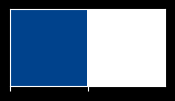

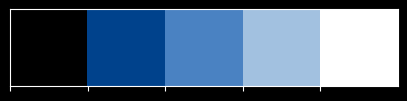

In [124]:
fcp_v1 = ["#00428C", "#FFFFFF"]
sns.palplot(sns.color_palette(fcp_v1))
fcp_v2 = ["#000000", "#00428C", "#4a82c2", "#a2c1e0", "#FFFFFF"]
sns.palplot(sns.color_palette(fcp_v2))

## 5-match Rolling Average Plots

### xG

#### Variable Selection

In [268]:
variable_for = "xG for"
variable_ag = "xG ag"

#### Rolling metrics calculation

In [269]:
# xG conceded and xG created
Y_for = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_for
].reset_index(drop=True)
Y_ag = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_ag
].reset_index(drop=True)
X = pd.Series(range(len(Y_for)))

# compute the rolling average (min_periods is used for the partial average)
# here we're using a 10 game rolling average
Y_for["Value"] = Y_for["Value"].rolling(window=5, min_periods=0).mean()
Y_ag["Value"] = Y_ag["Value"].rolling(window=5, min_periods=0).mean()

Y_for = Y_for[["Value"]].reset_index(drop=True)
Y_ag = Y_ag[["Value"]].reset_index(drop=True)

display(Y_for.head())
display(Y_ag.head())

,Value
0,2.730000
1,2.530000
2,2.583333
3,2.380000
4,2.434000


,Value
0,0.590000
1,0.905000
2,1.003333
3,1.190000
4,1.116000


#### xG Data Viz

##### Plotting the visualization

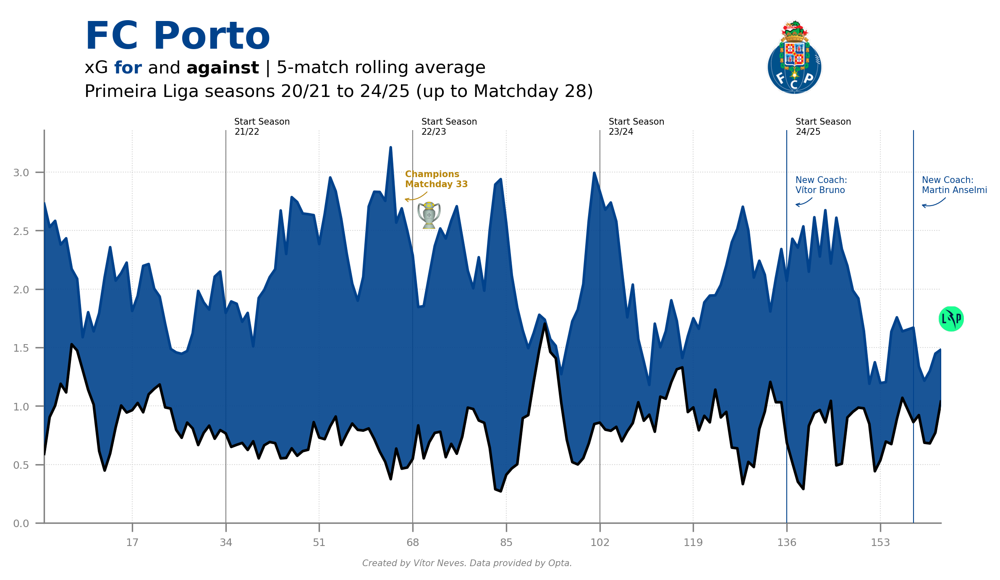

In [270]:
# ------------------------------
# IMPORTS
# ------------------------------
import matplotlib.pyplot as plt
import pandas as pd
from urllib.request import urlopen
from PIL import Image
import matplotlib.ticker as ticker
from highlight_text import fig_text

# ------------------------------
# FIGURE SETUP
# ------------------------------
fig = plt.figure(figsize=(8, 4), dpi=300, facecolor="white")
ax = plt.subplot(111, facecolor="white")

# Spine and grid styling
ax.spines[["top", "right"]].set_visible(False)
ax.spines[["left", "bottom"]].set_color("grey")
ax.grid(visible=True, lw=0.5, ls=":", color="lightgrey", zorder=1)

# ------------------------------
# DATA PLOTTING
# ------------------------------
matchdays = range(1, 165)
line_1 = ax.plot(matchdays, Y_for, color="#00428C", zorder=4)  # xG for
line_2 = ax.plot(matchdays, Y_ag, color="#000000", zorder=4)  # xG against

# Axis limits
ax.set_xlim(1, len(Y_for))
ax.set_ylim(0)

# ------------------------------
# SEASON MARKERS
# ------------------------------
SEASON_BREAKS = [34, 68, 102, 136, 170]
SEASON_ANNOTATIONS = [
    (34, 3.25, "Start Season\n21/22"),
    (68, 3.25, "Start Season\n22/23"),
    (102, 3.25, "Start Season\n23/24"),
    (136, 3.25, "Start Season\n24/25"),
]

COACH_ANNOTATIONS = [
    (136, 2.75, "New Coach:\nVítor Bruno", line_1[0].get_color()),
    (159, 2.75, "New Coach:\nMartin Anselmi", line_1[0].get_color()),
]

# Vertical season dividers
for x in SEASON_BREAKS:
    ax.plot(
        [x, x],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color="grey",
        zorder=3,
    )

# Vertical coach change dividers
for x_val, _, _, color in COACH_ANNOTATIONS:
    ax.plot(
        [x_val, x_val],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color=color,
        zorder=3,
    )

# ------------------------------
# ANNOTATIONS
# ------------------------------
ARROW_STYLE = dict(
    arrowstyle="->",
    shrinkA=0,
    shrinkB=5,
    linewidth=0.5,
    connectionstyle="angle3,angleA=60,angleB=-30",
)

# Season start labels
for x, y, text in SEASON_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color="black",
        # arrowprops=ARROW_STYLE,
        zorder=4,
    )

# Coach labels
for x, y, text, color in COACH_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color=color,
        arrowprops={**ARROW_STYLE, "color": color},
        zorder=4,
    )

# Championship annotation
ax.annotate(
    xy=(65, 2.8),
    xytext=(5, 5),
    textcoords="offset points",
    text="Champions\nMatchday 33",
    size=5,
    color="#B8860B",
    weight="bold",
    arrowprops=dict(
        arrowstyle="->",
        shrinkA=0,
        shrinkB=5,
        color="#B8860B",
        linewidth=0.5,
        connectionstyle="angle3,angleA=60,angleB=-30",
    ),
    zorder=4,
)

# ------------------------------
# FILL BETWEEN AREAS
# ------------------------------
ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_for["Value"] > Y_ag["Value"],
    interpolate=True,
    alpha=0.90,
    zorder=3,
    color=line_1[0].get_color(),
)

ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_ag["Value"] > Y_for["Value"],
    interpolate=True,
    alpha=0.90,
    color=line_2[0].get_color(),
    zorder=3,
)

# ------------------------------
# TICK FORMATTING
# ------------------------------
ax.tick_params(
    color="grey", length=5, which="major", labelsize=6, labelcolor="grey", zorder=3
)
ax.xaxis.set_major_locator(ticker.MultipleLocator(17))
ax.yaxis.set_major_locator(ticker.MultipleLocator(0.5))

# ------------------------------
# TITLES & TEXT
# ------------------------------
fig_text(
    x=0.12,
    y=1.1,
    s="FC Porto",
    color=line_1[0].get_color(),
    weight="bold",
    size=22,
    annotationbbox_kw={"xycoords": "figure fraction"},
)

fig_text(
    x=0.12,
    y=1.02,
    s="xG <for> and <against> | 5-match rolling average \nPrimeira Liga seasons 20/21 to 24/25 (up to Matchday 28)",
    highlight_textprops=[
        {"color": line_1[0].get_color(), "weight": "bold"},
        {"color": line_2[0].get_color(), "weight": "bold"},
    ],
    color="black",
    size=10,
    annotationbbox_kw={"xycoords": "figure fraction"},
)


# ------------------------------
# LOGO PLACEMENT
# ------------------------------
def data_to_fig_coords(ax, x_data, y_data, fig):
    """Convert data coordinates to figure coordinates [0-1 range]"""
    display_coords = ax.transData.transform((x_data, y_data))
    fig_width, fig_height = fig.get_size_inches() * fig.dpi
    return display_coords[0] / fig_width, display_coords[1] / fig_height


def add_logo(fig, image, x_pos, y_pos, width=0.05, height=0.05):
    """Helper to add logos at specified positions"""
    logo_ax = fig.add_axes([x_pos, y_pos, width, height], zorder=4)
    logo_ax.imshow(image, extent=[0.25, 0.75, 0.25, 0.75])
    logo_ax.axis("off")


# Load logos
team_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/teamlogo/9773.png")
)
competition_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/leaguelogo/61.png")
)
trophy_logo = Image.open(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\Primeira_Liga_Trophy.png"
)

# Calculate logo positions
fig_rel_x, fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[163]), float(Y_for["Value"].iloc[163]), fig
)
trophy_fig_rel_x, trophy_fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[66]), float(Y_for["Value"].iloc[66]), fig
)

# Add logos
add_logo(fig, team_logo, 0.75, 0.95, 0.15, 0.15)  # Top-right
add_logo(fig, competition_logo, fig_rel_x + 0.06, fig_rel_y + 0.03)  # Last data point
add_logo(
    fig, trophy_logo, trophy_fig_rel_x, trophy_fig_rel_y, 0.055, 0.055
)  # Championship point

# Add footer text
fig.text(
    0.5,
    0.015,
    "Created by Vítor Neves. Data provided by Opta.",
    fontstyle="italic",
    ha="center",
    fontsize=5,
    color="grey",
)

# ------------------------------
# SAFE LAYOUT ADJUSTMENT (Avoids warning)
# ------------------------------
def auto_adjust_layout(fig, top=0.88, bottom=0.10, left=0.08, right=0.97):
    """
    Ajusta margens de forma segura, evitando problemas com add_axes.
    """
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right)


auto_adjust_layout(fig)

# ------------------------------
# FINAL SAVE
# ------------------------------
fig.savefig(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\media\xG_Porto_5Rolling_Average_1920_2425.jpg",
    transparent=True,
    bbox_inches="tight",
    dpi=300,
)


### Accurate Passes

#### Variable Selection

In [271]:
variable_for = "Accurate Passes for"
variable_ag = "Accurate Passes ag"

#### Rolling metrics calculation

In [272]:
# xG conceded and xG created
Y_for = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_for
].reset_index(drop=True)
Y_ag = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_ag
].reset_index(drop=True)
X = pd.Series(range(len(Y_for)))

# compute the rolling average (min_periods is used for the partial average)
# here we're using a 10 game rolling average
Y_for["Value"] = Y_for["Value"].rolling(window=5, min_periods=0).mean()
Y_ag["Value"] = Y_ag["Value"].rolling(window=5, min_periods=0).mean()

Y_for = Y_for[["Value"]].reset_index(drop=True)
Y_ag = Y_ag[["Value"]].reset_index(drop=True)

display(Y_for.head())
display(Y_ag.head())

,Value
0,370.000000
1,380.500000
2,438.333333
3,390.250000
4,403.200000


,Value
0,321.000000
1,286.000000
2,224.666667
3,247.000000
4,255.200000


#### Accurate passes Data Viz

##### Plotting the visualization

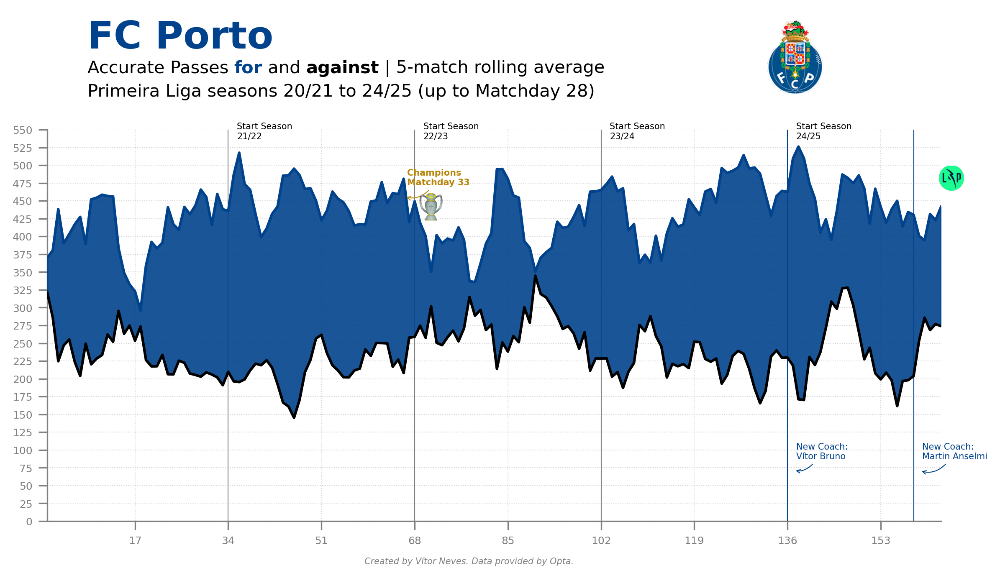

In [273]:
# ------------------------------
# IMPORTS
# ------------------------------
import matplotlib.pyplot as plt
import pandas as pd
from urllib.request import urlopen
from PIL import Image
import matplotlib.ticker as ticker
from highlight_text import fig_text

# ------------------------------
# FIGURE SETUP
# ------------------------------
fig = plt.figure(figsize=(8, 4), dpi=300, facecolor="white")
ax = plt.subplot(111, facecolor="white")

# Spine and grid styling
ax.spines[["top", "right"]].set_visible(False)
ax.spines[["left", "bottom"]].set_color("grey")
ax.grid(visible=True, lw=0.5, ls=":", color="lightgrey", zorder=1)

# ------------------------------
# DATA PLOTTING
# ------------------------------
matchdays = range(1, 165)
line_1 = ax.plot(matchdays, Y_for, color="#00428C", zorder=4)  # Accurate Passes for
line_2 = ax.plot(matchdays, Y_ag, color="#000000", zorder=4)  # Accurate Passes against

# Axis limits
ax.set_xlim(1, len(Y_for))
ax.set_ylim(0, 550)


# ------------------------------
# SEASON MARKERS
# ------------------------------
SEASON_BREAKS = [34, 68, 102, 136, 170]
SEASON_ANNOTATIONS = [
    (34, 525, "Start Season\n21/22"),
    (68, 525, "Start Season\n22/23"),
    (102, 525, "Start Season\n23/24"),
    (136, 525, "Start Season\n24/25"),
]

COACH_ANNOTATIONS = [
    (136, 75, "New Coach:\nVítor Bruno", line_1[0].get_color()),
    (159, 75, "New Coach:\nMartin Anselmi", line_1[0].get_color()),
]

# Vertical season dividers
for x in SEASON_BREAKS:
    ax.plot(
        [x, x],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color="grey",
        zorder=3,
    )

# Vertical coach change dividers
for x_val, _, _, color in COACH_ANNOTATIONS:
    ax.plot(
        [x_val, x_val],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color=color,
        zorder=3,
    )

# ------------------------------
# ANNOTATIONS
# ------------------------------
ARROW_STYLE = dict(
    arrowstyle="->",
    shrinkA=0,
    shrinkB=5,
    linewidth=0.5,
    connectionstyle="angle3,angleA=60,angleB=-30",
    zorder=4,
)

# Season start labels
for x, y, text in SEASON_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color="black",
        # arrowprops=ARROW_STYLE,
        zorder=4,
    )

# Coach labels
for x, y, text, color in COACH_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color=color,
        arrowprops={**ARROW_STYLE, "color": color},
        zorder=4,
    )

# Championship annotation
ax.annotate(
    xy=(65, 460),
    xytext=(5, 5),
    textcoords="offset points",
    text="Champions\nMatchday 33",
    size=5,
    color="#B8860B",
    weight="bold",
    arrowprops=dict(
        arrowstyle="->",
        shrinkA=0,
        shrinkB=5,
        color="#B8860B",
        linewidth=0.5,
        connectionstyle="angle3,angleA=60,angleB=-30",
    ),
    zorder=4,
)

# ------------------------------
# FILL BETWEEN AREAS
# ------------------------------
ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_for["Value"] > Y_ag["Value"],
    interpolate=True,
    alpha=0.90,
    zorder=3,
    color=line_1[0].get_color(),
)

ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_ag["Value"] > Y_for["Value"],
    interpolate=True,
    alpha=0.90,
    color=line_2[0].get_color(),
    zorder=3,
)

# ------------------------------
# TICK FORMATTING
# ------------------------------
ax.tick_params(
    color="grey", length=5, which="major", labelsize=6, labelcolor="grey", zorder=3
)
ax.xaxis.set_major_locator(ticker.MultipleLocator(17))
ax.yaxis.set_major_locator(ticker.MultipleLocator(25))

# ------------------------------
# TITLES & TEXT
# ------------------------------
fig_text(
    x=0.12,
    y=1.1,
    s="FC Porto",
    color=line_1[0].get_color(),
    weight="bold",
    size=22,
    annotationbbox_kw={"xycoords": "figure fraction"},
)

fig_text(
    x=0.12,
    y=1.02,
    s="Accurate Passes <for> and <against> | 5-match rolling average \nPrimeira Liga seasons 20/21 to 24/25 (up to Matchday 28)",
    highlight_textprops=[
        {"color": line_1[0].get_color(), "weight": "bold"},
        {"color": line_2[0].get_color(), "weight": "bold"},
    ],
    color="black",
    size=10,
    annotationbbox_kw={"xycoords": "figure fraction"},
)


# ------------------------------
# LOGO PLACEMENT
# ------------------------------
def data_to_fig_coords(ax, x_data, y_data, fig):
    """Convert data coordinates to figure coordinates [0-1 range]"""
    display_coords = ax.transData.transform((x_data, y_data))
    fig_width, fig_height = fig.get_size_inches() * fig.dpi
    return display_coords[0] / fig_width, display_coords[1] / fig_height


def add_logo(fig, image, x_pos, y_pos, width=0.05, height=0.05):
    """Helper to add logos at specified positions"""
    logo_ax = fig.add_axes([x_pos, y_pos, width, height], zorder=4)
    logo_ax.imshow(image, extent=[0.25, 0.75, 0.25, 0.75])
    logo_ax.axis("off")


# Load logos
team_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/teamlogo/9773.png")
)
competition_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/leaguelogo/61.png")
)
trophy_logo = Image.open(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\Primeira_Liga_Trophy.png"
)

# Calculate logo positions
fig_rel_x, fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[163]), float(Y_for["Value"].iloc[163]), fig
)
trophy_fig_rel_x, trophy_fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[66]), float(Y_for["Value"].iloc[66]), fig
)

# Add logos
add_logo(fig, team_logo, 0.75, 0.95, 0.15, 0.15)  # Top-right
add_logo(fig, competition_logo, fig_rel_x + 0.06, fig_rel_y + 0.03)  # Last data point
add_logo(
    fig, trophy_logo, trophy_fig_rel_x, trophy_fig_rel_y, 0.055, 0.055
)  # Championship point

# Add footer text
fig.text(
    0.5,
    0.015,
    "Created by Vítor Neves. Data provided by Opta.",
    fontstyle="italic",
    ha="center",
    fontsize=5,
    color="grey",
)

# ------------------------------
# SAFE LAYOUT ADJUSTMENT (Avoids warning)
# ------------------------------
def auto_adjust_layout(fig, top=0.88, bottom=0.10, left=0.08, right=0.97):
    """
    Ajusta margens de forma segura, evitando problemas com add_axes.
    """
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right)


auto_adjust_layout(fig)

# ------------------------------
# FINAL SAVE
# ------------------------------
fig.savefig(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\media\Accurate_Passes_Porto_5Rolling_Average_1920_2425.jpg",
    transparent=True,
    bbox_inches="tight",
    dpi=300,
)


### Ball Possession

#### Variable Selection

In [274]:
variable_for = "Ball Possession for"
variable_ag = "Ball Possession ag"

#### Rolling metrics calculation

In [275]:
# xG conceded and xG created
Y_for = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_for
].reset_index(drop=True)
Y_ag = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_ag
].reset_index(drop=True)
X = pd.Series(range(len(Y_for)))

# compute the rolling average (min_periods is used for the partial average)
# here we're using a 10 game rolling average
Y_for["Value"] = Y_for["Value"].rolling(window=5, min_periods=0).mean()
Y_ag["Value"] = Y_ag["Value"].rolling(window=5, min_periods=0).mean()

Y_for = Y_for[["Value"]].reset_index(drop=True)
Y_ag = Y_ag[["Value"]].reset_index(drop=True)

display(Y_for.head())
display(Y_ag.head())

,Value
0,53.000000
1,56.000000
2,63.333333
3,58.750000
4,58.800000


,Value
0,47.000000
1,44.000000
2,36.666667
3,41.250000
4,41.200000


#### Ball Possession Data Viz

##### Plotting the visualization

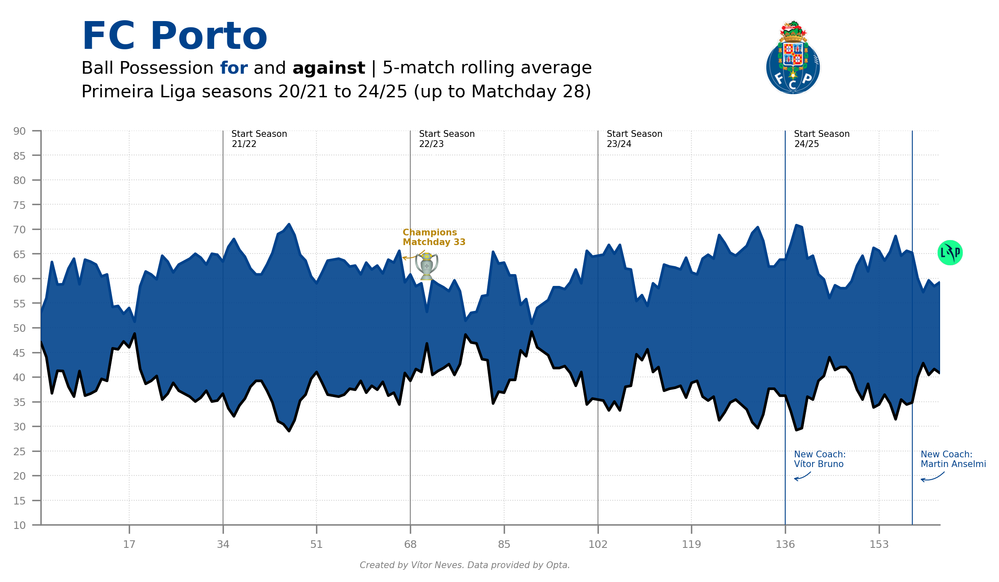

In [276]:
# ------------------------------
# IMPORTS
# ------------------------------
import matplotlib.pyplot as plt
import pandas as pd
from urllib.request import urlopen
from PIL import Image
import matplotlib.ticker as ticker
from highlight_text import fig_text

# ------------------------------
# FIGURE SETUP
# ------------------------------
fig = plt.figure(figsize=(8, 4), dpi=300, facecolor="white")
ax = plt.subplot(111, facecolor="white")

# Spine and grid styling
ax.spines[["top", "right"]].set_visible(False)
ax.spines[["left", "bottom"]].set_color("grey")
ax.grid(visible=True, lw=0.5, ls=":", color="lightgrey", zorder=1)

# ------------------------------
# DATA PLOTTING
# ------------------------------
matchdays = range(1, 165)
line_1 = ax.plot(matchdays, Y_for, color="#00428C", zorder=4)  # Accurate Passes for
line_2 = ax.plot(matchdays, Y_ag, color="#000000", zorder=4)  # Accurate Passes against

# Axis limits
ax.set_xlim(1, len(Y_for))
ax.set_ylim(10, 90)


# ------------------------------
# SEASON MARKERS
# ------------------------------
SEASON_BREAKS = [34, 68, 102, 136, 170]
SEASON_ANNOTATIONS = [
    (34, 85, "Start Season\n21/22"),
    (68, 85, "Start Season\n22/23"),
    (102, 85, "Start Season\n23/24"),
    (136, 85, "Start Season\n24/25"),
]

COACH_ANNOTATIONS = [
    (136, 20, "New Coach:\nVítor Bruno", line_1[0].get_color()),
    (159, 20, "New Coach:\nMartin Anselmi", line_1[0].get_color()),
]

# Vertical season dividers
for x in SEASON_BREAKS:
    ax.plot(
        [x, x],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color="grey",
        zorder=3,
    )

# Vertical coach change dividers
for x_val, _, _, color in COACH_ANNOTATIONS:
    ax.plot(
        [x_val, x_val],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color=color,
        zorder=3,
    )

# ------------------------------
# ANNOTATIONS
# ------------------------------
ARROW_STYLE = dict(
    arrowstyle="->",
    shrinkA=0,
    shrinkB=5,
    linewidth=0.5,
    connectionstyle="angle3,angleA=60,angleB=-30",
    zorder=4,
)

# Season start labels
for x, y, text in SEASON_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color="black",
        arrowprops=ARROW_STYLE,
        zorder=4,
    )

# Coach labels
for x, y, text, color in COACH_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color=color,
        arrowprops={**ARROW_STYLE, "color": color},
        zorder=4,
    )

# Championship annotation
ax.annotate(
    xy=(65, 65),
    xytext=(5, 5),
    textcoords="offset points",
    text="Champions\nMatchday 33",
    size=5,
    color="#B8860B",
    weight="bold",
    arrowprops=dict(
        arrowstyle="->",
        shrinkA=0,
        shrinkB=5,
        color="#B8860B",
        linewidth=0.5,
        connectionstyle="angle3,angleA=60,angleB=-30",
    ),
    zorder=4,
)

# ------------------------------
# FILL BETWEEN AREAS
# ------------------------------
ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_for["Value"] > Y_ag["Value"],
    interpolate=True,
    alpha=0.90,
    zorder=3,
    color=line_1[0].get_color(),
)

ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_ag["Value"] > Y_for["Value"],
    interpolate=True,
    alpha=0.90,
    color=line_2[0].get_color(),
    zorder=3,
)

# ------------------------------
# TICK FORMATTING
# ------------------------------
ax.tick_params(
    color="grey", length=5, which="major", labelsize=6, labelcolor="grey", zorder=3
)
ax.xaxis.set_major_locator(ticker.MultipleLocator(17))
ax.yaxis.set_major_locator(ticker.MultipleLocator(5))

# ------------------------------
# TITLES & TEXT
# ------------------------------
fig_text(
    x=0.12,
    y=1.1,
    s="FC Porto",
    color=line_1[0].get_color(),
    weight="bold",
    size=22,
    annotationbbox_kw={"xycoords": "figure fraction"},
)

fig_text(
    x=0.12,
    y=1.02,
    s="Ball Possession <for> and <against> | 5-match rolling average \nPrimeira Liga seasons 20/21 to 24/25 (up to Matchday 28)",
    highlight_textprops=[
        {"color": line_1[0].get_color(), "weight": "bold"},
        {"color": line_2[0].get_color(), "weight": "bold"},
    ],
    color="black",
    size=10,
    annotationbbox_kw={"xycoords": "figure fraction"},
)


# ------------------------------
# LOGO PLACEMENT
# ------------------------------
def data_to_fig_coords(ax, x_data, y_data, fig):
    """Convert data coordinates to figure coordinates [0-1 range]"""
    display_coords = ax.transData.transform((x_data, y_data))
    fig_width, fig_height = fig.get_size_inches() * fig.dpi
    return display_coords[0] / fig_width, display_coords[1] / fig_height


def add_logo(fig, image, x_pos, y_pos, width=0.05, height=0.05):
    """Helper to add logos at specified positions"""
    logo_ax = fig.add_axes([x_pos, y_pos, width, height], zorder=4)
    logo_ax.imshow(image, extent=[0.25, 0.75, 0.25, 0.75])
    logo_ax.axis("off")


# Load logos
team_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/teamlogo/9773.png")
)
competition_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/leaguelogo/61.png")
)
trophy_logo = Image.open(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\Primeira_Liga_Trophy.png"
)

# Calculate logo positions
fig_rel_x, fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[163]), float(Y_for["Value"].iloc[163]), fig
)
trophy_fig_rel_x, trophy_fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[66]), float(Y_for["Value"].iloc[66]), fig
)

# Add logos
add_logo(fig, team_logo, 0.75, 0.95, 0.15, 0.15)  # Top-right
add_logo(fig, competition_logo, fig_rel_x + 0.06, fig_rel_y + 0.03)  # Last data point
add_logo(
    fig, trophy_logo, trophy_fig_rel_x, trophy_fig_rel_y, 0.055, 0.055
)  # Championship point

# Add footer text
fig.text(
    0.5,
    0.015,
    "Created by Vítor Neves. Data provided by Opta.",
    fontstyle="italic",
    ha="center",
    fontsize=5,
    color="grey",
)

# ------------------------------
# SAFE LAYOUT ADJUSTMENT (Avoids warning)
# ------------------------------
def auto_adjust_layout(fig, top=0.88, bottom=0.10, left=0.08, right=0.97):
    """
    Ajusta margens de forma segura, evitando problemas com add_axes.
    """
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right)


auto_adjust_layout(fig)

# ------------------------------
# FINAL SAVE
# ------------------------------
fig.savefig(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\media\Ball_Possession_Porto_5Rolling_Average_1920_2425.jpg",
    transparent=True,
    bbox_inches="tight",
    dpi=300,
)


### Shot On Target

#### Variable Selection

In [277]:
variable_for = "Shots On Target for"
variable_ag = "Shots On Target ag"

#### Rolling metrics calculation

In [278]:
# xG conceded and xG created
Y_for = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_for
].reset_index(drop=True)
Y_ag = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_ag
].reset_index(drop=True)
X = pd.Series(range(len(Y_for)))

# compute the rolling average (min_periods is used for the partial average)
# here we're using a 10 game rolling average
Y_for["Value"] = Y_for["Value"].rolling(window=5, min_periods=0).mean()
Y_ag["Value"] = Y_ag["Value"].rolling(window=5, min_periods=0).mean()

Y_for = Y_for[["Value"]].reset_index(drop=True)
Y_ag = Y_ag[["Value"]].reset_index(drop=True)

display(Y_for.head())
display(Y_ag.head())

,Value
0,4.000000
1,5.000000
2,6.666667
3,6.250000
4,6.400000


,Value
0,1.0
1,2.5
2,3.0
3,3.5
4,3.2


#### Shots On Target Data Viz

##### Plotting the visualization

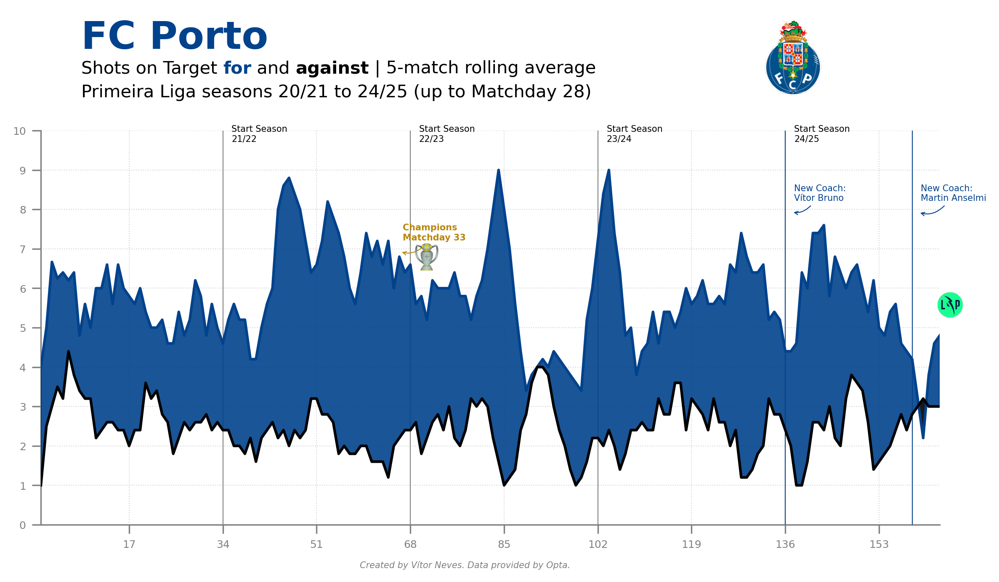

In [279]:
# ------------------------------
# IMPORTS
# ------------------------------
import matplotlib.pyplot as plt
import pandas as pd
from urllib.request import urlopen
from PIL import Image
import matplotlib.ticker as ticker
from highlight_text import fig_text

# ------------------------------
# FIGURE SETUP
# ------------------------------
fig = plt.figure(figsize=(8, 4), dpi=300, facecolor="white")
ax = plt.subplot(111, facecolor="white")

# Spine and grid styling
ax.spines[["top", "right"]].set_visible(False)
ax.spines[["left", "bottom"]].set_color("grey")
ax.grid(visible=True, lw=0.5, ls=":", color="lightgrey", zorder=1)

# ------------------------------
# DATA PLOTTING
# ------------------------------
matchdays = range(1, 165)
line_1 = ax.plot(matchdays, Y_for, color="#00428C", zorder=4)  # Accurate Passes for
line_2 = ax.plot(matchdays, Y_ag, color="#000000", zorder=4)  # Accurate Passes against

# Axis limits
ax.set_xlim(1, len(Y_for))
ax.set_ylim(0, 10)


# ------------------------------
# SEASON MARKERS
# ------------------------------
SEASON_BREAKS = [34, 68, 102, 136, 170]
SEASON_ANNOTATIONS = [
    (34, 9.5, "Start Season\n21/22"),
    (68, 9.5, "Start Season\n22/23"),
    (102, 9.5, "Start Season\n23/24"),
    (136, 9.5, "Start Season\n24/25"),
]

COACH_ANNOTATIONS = [
    (136, 8, "New Coach:\nVítor Bruno", line_1[0].get_color()),
    (159, 8, "New Coach:\nMartin Anselmi", line_1[0].get_color()),
]

# Vertical season dividers
for x in SEASON_BREAKS:
    ax.plot(
        [x, x],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color="grey",
        zorder=3,
    )

# Vertical coach change dividers
for x_val, _, _, color in COACH_ANNOTATIONS:
    ax.plot(
        [x_val, x_val],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color=color,
        zorder=3,
    )

# ------------------------------
# ANNOTATIONS
# ------------------------------
ARROW_STYLE = dict(
    arrowstyle="->",
    shrinkA=0,
    shrinkB=5,
    linewidth=0.5,
    connectionstyle="angle3,angleA=60,angleB=-30",
    zorder=4,
)

# Season start labels
for x, y, text in SEASON_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color="black",
        arrowprops=ARROW_STYLE,
        zorder=4,
    )

# Coach labels
for x, y, text, color in COACH_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color=color,
        arrowprops={**ARROW_STYLE, "color": color},
        zorder=4,
    )

# Championship annotation
ax.annotate(
    xy=(65, 7),
    xytext=(5, 5),
    textcoords="offset points",
    text="Champions\nMatchday 33",
    size=5,
    color="#B8860B",
    weight="bold",
    arrowprops=dict(
        arrowstyle="->",
        shrinkA=0,
        shrinkB=5,
        color="#B8860B",
        linewidth=0.5,
        connectionstyle="angle3,angleA=60,angleB=-30",
    ),
    zorder=4,
)

# ------------------------------
# FILL BETWEEN AREAS
# ------------------------------
ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_for["Value"] > Y_ag["Value"],
    interpolate=True,
    alpha=0.90,
    zorder=3,
    color=line_1[0].get_color(),
)

ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_ag["Value"] > Y_for["Value"],
    interpolate=True,
    alpha=0.90,
    color=line_2[0].get_color(),
    zorder=3,
)

# ------------------------------
# TICK FORMATTING
# ------------------------------
ax.tick_params(
    color="grey", length=5, which="major", labelsize=6, labelcolor="grey", zorder=3
)
ax.xaxis.set_major_locator(ticker.MultipleLocator(17))
ax.yaxis.set_major_locator(ticker.MultipleLocator(1))

# ------------------------------
# TITLES & TEXT
# ------------------------------
fig_text(
    x=0.12,
    y=1.1,
    s="FC Porto",
    color=line_1[0].get_color(),
    weight="bold",
    size=22,
    annotationbbox_kw={"xycoords": "figure fraction"},
)

fig_text(
    x=0.12,
    y=1.02,
    s="Shots on Target <for> and <against> | 5-match rolling average \nPrimeira Liga seasons 20/21 to 24/25 (up to Matchday 28)",
    highlight_textprops=[
        {"color": line_1[0].get_color(), "weight": "bold"},
        {"color": line_2[0].get_color(), "weight": "bold"},
    ],
    color="black",
    size=10,
    annotationbbox_kw={"xycoords": "figure fraction"},
)


# ------------------------------
# LOGO PLACEMENT
# ------------------------------
def data_to_fig_coords(ax, x_data, y_data, fig):
    """Convert data coordinates to figure coordinates [0-1 range]"""
    display_coords = ax.transData.transform((x_data, y_data))
    fig_width, fig_height = fig.get_size_inches() * fig.dpi
    return display_coords[0] / fig_width, display_coords[1] / fig_height


def add_logo(fig, image, x_pos, y_pos, width=0.05, height=0.05):
    """Helper to add logos at specified positions"""
    logo_ax = fig.add_axes([x_pos, y_pos, width, height], zorder=4)
    logo_ax.imshow(image, extent=[0.25, 0.75, 0.25, 0.75])
    logo_ax.axis("off")


# Load logos
team_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/teamlogo/9773.png")
)
competition_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/leaguelogo/61.png")
)
trophy_logo = Image.open(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\Primeira_Liga_Trophy.png"
)

# Calculate logo positions
fig_rel_x, fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[163]), float(Y_for["Value"].iloc[163]), fig
)
trophy_fig_rel_x, trophy_fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[66]), float(Y_for["Value"].iloc[66]), fig
)

# Add logos
add_logo(fig, team_logo, 0.75, 0.95, 0.15, 0.15)  # Top-right
add_logo(fig, competition_logo, fig_rel_x + 0.06, fig_rel_y + 0.03)  # Last data point
add_logo(
    fig, trophy_logo, trophy_fig_rel_x, trophy_fig_rel_y, 0.055, 0.055
)  # Championship point

# Add footer text
fig.text(
    0.5,
    0.015,
    "Created by Vítor Neves. Data provided by Opta.",
    fontstyle="italic",
    ha="center",
    fontsize=5,
    color="grey",
)

# ------------------------------
# SAFE LAYOUT ADJUSTMENT (Avoids warning)
# ------------------------------
def auto_adjust_layout(fig, top=0.88, bottom=0.10, left=0.08, right=0.97):
    """
    Ajusta margens de forma segura, evitando problemas com add_axes.
    """
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right)


auto_adjust_layout(fig)

# ------------------------------
# FINAL SAVE
# ------------------------------
fig.savefig(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\media\Shots_on_Target_Porto_5Rolling_Average_1920_2425.jpg",
    transparent=True,
    bbox_inches="tight",
    dpi=300,
)


### Fouls Committed

#### Variable Selection

In [280]:
variable_for = "Fouls Committed for"
variable_ag = "Fouls Committed ag"

#### Rolling metrics calculation

In [281]:
# xG conceded and xG created
Y_for = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_for
].reset_index(drop=True)
Y_ag = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_ag
].reset_index(drop=True)
X = pd.Series(range(len(Y_for)))

# compute the rolling average (min_periods is used for the partial average)
# here we're using a 10 game rolling average
Y_for["Value"] = Y_for["Value"].rolling(window=5, min_periods=0).mean()
Y_ag["Value"] = Y_ag["Value"].rolling(window=5, min_periods=0).mean()

Y_for = Y_for[["Value"]].reset_index(drop=True)
Y_ag = Y_ag[["Value"]].reset_index(drop=True)

display(Y_for.head())
display(Y_ag.head())

,Value
0,18.000000
1,18.500000
2,18.666667
3,19.000000
4,18.400000


,Value
0,18.000000
1,18.500000
2,17.666667
3,17.500000
4,16.800000


#### Fouls Comitted Data Viz

##### Plotting the visualization

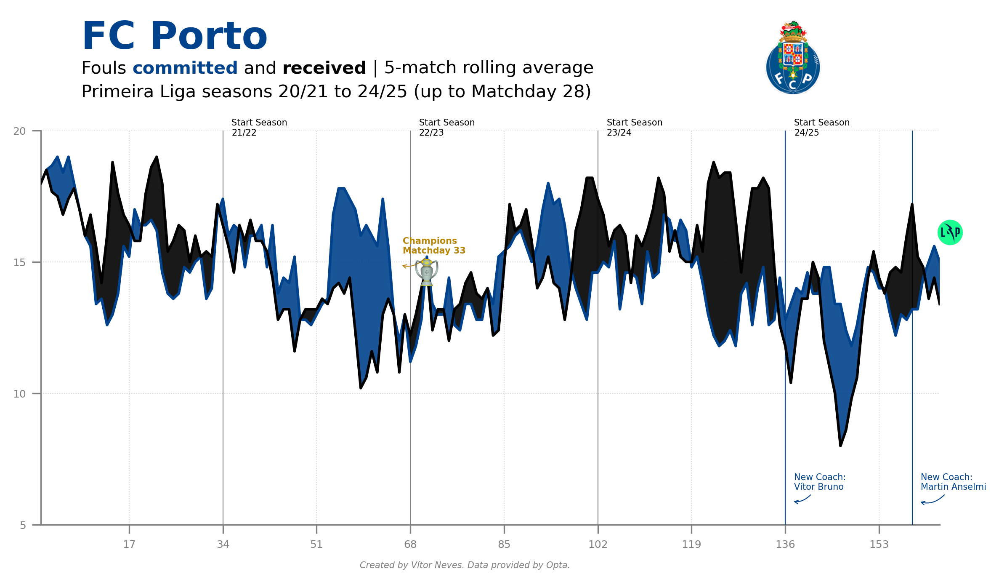

In [282]:
# ------------------------------
# IMPORTS
# ------------------------------
import matplotlib.pyplot as plt
import pandas as pd
from urllib.request import urlopen
from PIL import Image
import matplotlib.ticker as ticker
from highlight_text import fig_text

# ------------------------------
# FIGURE SETUP
# ------------------------------
fig = plt.figure(figsize=(8, 4), dpi=300, facecolor="white")
ax = plt.subplot(111, facecolor="white")

# Spine and grid styling
ax.spines[["top", "right"]].set_visible(False)
ax.spines[["left", "bottom"]].set_color("grey")
ax.grid(visible=True, lw=0.5, ls=":", color="lightgrey", zorder=1)

# ------------------------------
# DATA PLOTTING
# ------------------------------
matchdays = range(1, 165)
line_1 = ax.plot(matchdays, Y_for, color="#00428C", zorder=4)  # Accurate Passes for
line_2 = ax.plot(matchdays, Y_ag, color="#000000", zorder=4)  # Accurate Passes against

# Axis limits
ax.set_xlim(1, len(Y_for))
ax.set_ylim(5, 20)


# ------------------------------
# SEASON MARKERS
# ------------------------------
SEASON_BREAKS = [34, 68, 102, 136, 170]
SEASON_ANNOTATIONS = [
    (34, 19.5, "Start Season\n21/22"),
    (68, 19.5, "Start Season\n22/23"),
    (102, 19.5, "Start Season\n23/24"),
    (136, 19.5, "Start Season\n24/25"),
]

COACH_ANNOTATIONS = [
    (136, 6, "New Coach:\nVítor Bruno", line_1[0].get_color()),
    (159, 6, "New Coach:\nMartin Anselmi", line_1[0].get_color()),
]

# Vertical season dividers
for x in SEASON_BREAKS:
    ax.plot(
        [x, x],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color="grey",
        zorder=3,
    )

# Vertical coach change dividers
for x_val, _, _, color in COACH_ANNOTATIONS:
    ax.plot(
        [x_val, x_val],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color=color,
        zorder=3,
    )

# ------------------------------
# ANNOTATIONS
# ------------------------------
ARROW_STYLE = dict(
    arrowstyle="->",
    shrinkA=0,
    shrinkB=5,
    linewidth=0.5,
    connectionstyle="angle3,angleA=60,angleB=-30",
    zorder=4,
)

# Season start labels
for x, y, text in SEASON_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color="black",
        arrowprops=ARROW_STYLE,
        zorder=4,
    )

# Coach labels
for x, y, text, color in COACH_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color=color,
        arrowprops={**ARROW_STYLE, "color": color},
        zorder=4,
    )

# Championship annotation
ax.annotate(
    xy=(65, 15),
    xytext=(5, 5),
    textcoords="offset points",
    text="Champions\nMatchday 33",
    size=5,
    color="#B8860B",
    weight="bold",
    arrowprops=dict(
        arrowstyle="->",
        shrinkA=0,
        shrinkB=5,
        color="#B8860B",
        linewidth=0.5,
        connectionstyle="angle3,angleA=60,angleB=-30",
    ),
    zorder=4,
)

# ------------------------------
# FILL BETWEEN AREAS
# ------------------------------
ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_for["Value"] > Y_ag["Value"],
    interpolate=True,
    alpha=0.90,
    zorder=3,
    color=line_1[0].get_color(),
)

ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_ag["Value"] > Y_for["Value"],
    interpolate=True,
    alpha=0.90,
    color=line_2[0].get_color(),
    zorder=3,
)

# ------------------------------
# TICK FORMATTING
# ------------------------------
ax.tick_params(
    color="grey", length=5, which="major", labelsize=6, labelcolor="grey", zorder=3
)
ax.xaxis.set_major_locator(ticker.MultipleLocator(17))
ax.yaxis.set_major_locator(ticker.MultipleLocator(5))

# ------------------------------
# TITLES & TEXT
# ------------------------------
fig_text(
    x=0.12,
    y=1.1,
    s="FC Porto",
    color=line_1[0].get_color(),
    weight="bold",
    size=22,
    annotationbbox_kw={"xycoords": "figure fraction"},
)

fig_text(
    x=0.12,
    y=1.02,
    s="Fouls <committed> and <received> | 5-match rolling average \nPrimeira Liga seasons 20/21 to 24/25 (up to Matchday 28)",
    highlight_textprops=[
        {"color": line_1[0].get_color(), "weight": "bold"},
        {"color": line_2[0].get_color(), "weight": "bold"},
    ],
    color="black",
    size=10,
    annotationbbox_kw={"xycoords": "figure fraction"},
)


# ------------------------------
# LOGO PLACEMENT
# ------------------------------
def data_to_fig_coords(ax, x_data, y_data, fig):
    """Convert data coordinates to figure coordinates [0-1 range]"""
    display_coords = ax.transData.transform((x_data, y_data))
    fig_width, fig_height = fig.get_size_inches() * fig.dpi
    return display_coords[0] / fig_width, display_coords[1] / fig_height


def add_logo(fig, image, x_pos, y_pos, width=0.05, height=0.05):
    """Helper to add logos at specified positions"""
    logo_ax = fig.add_axes([x_pos, y_pos, width, height], zorder=4)
    logo_ax.imshow(image, extent=[0.25, 0.75, 0.25, 0.75])
    logo_ax.axis("off")


# Load logos
team_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/teamlogo/9773.png")
)
competition_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/leaguelogo/61.png")
)
trophy_logo = Image.open(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\Primeira_Liga_Trophy.png"
)

# Calculate logo positions
fig_rel_x, fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[163]), float(Y_for["Value"].iloc[163]), fig
)
trophy_fig_rel_x, trophy_fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[66]), float(Y_for["Value"].iloc[66] + 1), fig
)

# Add logos
add_logo(fig, team_logo, 0.75, 0.95, 0.15, 0.15)  # Top-right
add_logo(fig, competition_logo, fig_rel_x + 0.06, fig_rel_y + 0.03)  # Last data point
add_logo(
    fig, trophy_logo, trophy_fig_rel_x, trophy_fig_rel_y, 0.055, 0.055
)  # Championship point

# Add footer text
fig.text(
    0.5,
    0.015,
    "Created by Vítor Neves. Data provided by Opta.",
    fontstyle="italic",
    ha="center",
    fontsize=5,
    color="grey",
)

# ------------------------------
# SAFE LAYOUT ADJUSTMENT (Avoids warning)
# ------------------------------
def auto_adjust_layout(fig, top=0.88, bottom=0.10, left=0.08, right=0.97):
    """
    Ajusta margens de forma segura, evitando problemas com add_axes.
    """
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right)


auto_adjust_layout(fig)

# ------------------------------
# FINAL SAVE
# ------------------------------
fig.savefig(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\media\Fouls_Comitted_Porto_5Rolling_Average_1920_2425.jpg",
    transparent=True,
    bbox_inches="tight",
    dpi=300,
)


### Corners

#### Variable Selection

In [283]:
variable_for = "Corners for"
variable_ag = "Corners ag"

#### Rolling metrics calculation

In [284]:
# xG conceded and xG created
Y_for = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_for
].reset_index(drop=True)
Y_ag = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_ag
].reset_index(drop=True)
X = pd.Series(range(len(Y_for)))

# compute the rolling average (min_periods is used for the partial average)
# here we're using a 10 game rolling average
Y_for["Value"] = Y_for["Value"].rolling(window=5, min_periods=0).mean()
Y_ag["Value"] = Y_ag["Value"].rolling(window=5, min_periods=0).mean()

Y_for = Y_for[["Value"]].reset_index(drop=True)
Y_ag = Y_ag[["Value"]].reset_index(drop=True)

display(Y_for.head())
display(Y_ag.head())

,Value
0,5.000000
1,3.500000
2,5.333333
3,4.250000
4,5.000000


,Value
0,1.000000
1,2.000000
2,1.333333
3,2.000000
4,2.200000


#### Corners Data Viz

##### Plotting the visualization

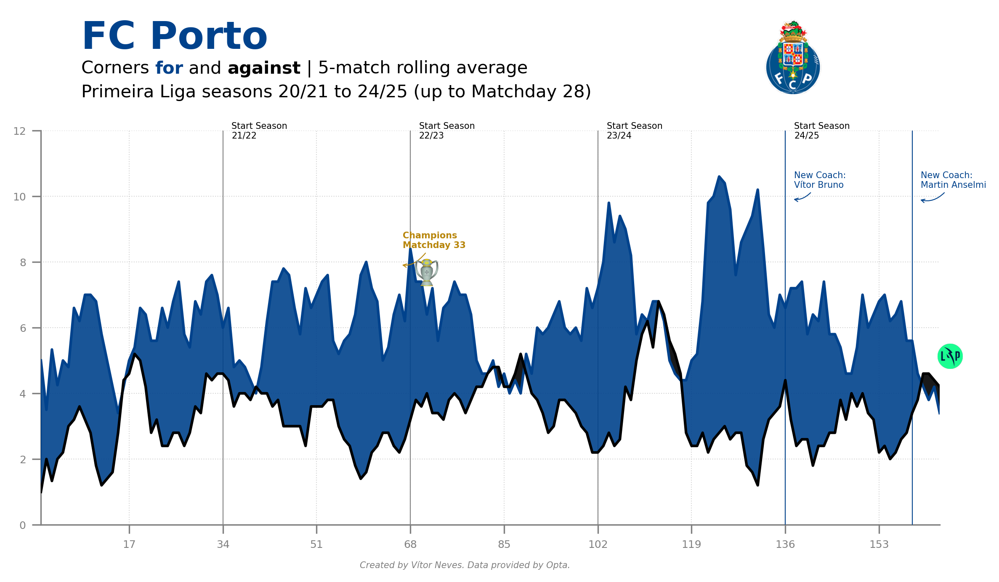

In [285]:
# ------------------------------
# IMPORTS
# ------------------------------
import matplotlib.pyplot as plt
import pandas as pd
from urllib.request import urlopen
from PIL import Image
import matplotlib.ticker as ticker
from highlight_text import fig_text

# ------------------------------
# FIGURE SETUP
# ------------------------------
fig = plt.figure(figsize=(8, 4), dpi=300, facecolor="white")
ax = plt.subplot(111, facecolor="white")

# Spine and grid styling
ax.spines[["top", "right"]].set_visible(False)
ax.spines[["left", "bottom"]].set_color("grey")
ax.grid(visible=True, lw=0.5, ls=":", color="lightgrey", zorder=1)

# ------------------------------
# DATA PLOTTING
# ------------------------------
matchdays = range(1, 165)
line_1 = ax.plot(matchdays, Y_for, color="#00428C", zorder=4)  # Accurate Passes for
line_2 = ax.plot(matchdays, Y_ag, color="#000000", zorder=4)  # Accurate Passes against

# Axis limits
ax.set_xlim(1, len(Y_for))
ax.set_ylim(0, 12)


# ------------------------------
# SEASON MARKERS
# ------------------------------
SEASON_BREAKS = [34, 68, 102, 136, 170]
SEASON_ANNOTATIONS = [
    (34, 11.5, "Start Season\n21/22"),
    (68, 11.5, "Start Season\n22/23"),
    (102, 11.5, "Start Season\n23/24"),
    (136, 11.5, "Start Season\n24/25"),
]

COACH_ANNOTATIONS = [
    (136, 10, "New Coach:\nVítor Bruno", line_1[0].get_color()),
    (159, 10, "New Coach:\nMartin Anselmi", line_1[0].get_color()),
]

# Vertical season dividers
for x in SEASON_BREAKS:
    ax.plot(
        [x, x],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color="grey",
        zorder=3,
    )

# Vertical coach change dividers
for x_val, _, _, color in COACH_ANNOTATIONS:
    ax.plot(
        [x_val, x_val],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color=color,
        zorder=3,
    )

# ------------------------------
# ANNOTATIONS
# ------------------------------
ARROW_STYLE = dict(
    arrowstyle="->",
    shrinkA=0,
    shrinkB=5,
    linewidth=0.5,
    connectionstyle="angle3,angleA=60,angleB=-30",
    zorder=4,
)

# Season start labels
for x, y, text in SEASON_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color="black",
        # arrowprops=ARROW_STYLE,
        zorder=4,
    )

# Coach labels
for x, y, text, color in COACH_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color=color,
        arrowprops={**ARROW_STYLE, "color": color},
        zorder=4,
    )

# Championship annotation
ax.annotate(
    xy=(65, 8),
    xytext=(5, 8),
    textcoords="offset points",
    text="Champions\nMatchday 33",
    size=5,
    color="#B8860B",
    weight="bold",
    arrowprops=dict(
        arrowstyle="->",
        shrinkA=0,
        shrinkB=5,
        color="#B8860B",
        linewidth=0.5,
        connectionstyle="angle3,angleA=60,angleB=-30",
    ),
    zorder=4,
)

# ------------------------------
# FILL BETWEEN AREAS
# ------------------------------
ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_for["Value"] > Y_ag["Value"],
    interpolate=True,
    alpha=0.90,
    zorder=3,
    color=line_1[0].get_color(),
)

ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_ag["Value"] > Y_for["Value"],
    interpolate=True,
    alpha=0.90,
    color=line_2[0].get_color(),
    zorder=3,
)

# ------------------------------
# TICK FORMATTING
# ------------------------------
ax.tick_params(
    color="grey", length=5, which="major", labelsize=6, labelcolor="grey", zorder=3
)
ax.xaxis.set_major_locator(ticker.MultipleLocator(17))
ax.yaxis.set_major_locator(ticker.MultipleLocator(2))

# ------------------------------
# TITLES & TEXT
# ------------------------------
fig_text(
    x=0.12,
    y=1.1,
    s="FC Porto",
    color=line_1[0].get_color(),
    weight="bold",
    size=22,
    annotationbbox_kw={"xycoords": "figure fraction"},
)

fig_text(
    x=0.12,
    y=1.02,
    s="Corners <for> and <against> | 5-match rolling average \nPrimeira Liga seasons 20/21 to 24/25 (up to Matchday 28)",
    highlight_textprops=[
        {"color": line_1[0].get_color(), "weight": "bold"},
        {"color": line_2[0].get_color(), "weight": "bold"},
    ],
    color="black",
    size=10,
    annotationbbox_kw={"xycoords": "figure fraction"},
)


# ------------------------------
# LOGO PLACEMENT
# ------------------------------
def data_to_fig_coords(ax, x_data, y_data, fig):
    """Convert data coordinates to figure coordinates [0-1 range]"""
    display_coords = ax.transData.transform((x_data, y_data))
    fig_width, fig_height = fig.get_size_inches() * fig.dpi
    return display_coords[0] / fig_width, display_coords[1] / fig_height


def add_logo(fig, image, x_pos, y_pos, width=0.05, height=0.05):
    """Helper to add logos at specified positions"""
    logo_ax = fig.add_axes([x_pos, y_pos, width, height], zorder=4)
    logo_ax.imshow(image, extent=[0.25, 0.75, 0.25, 0.75])
    logo_ax.axis("off")


# Load logos
team_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/teamlogo/9773.png")
)
competition_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/leaguelogo/61.png")
)
trophy_logo = Image.open(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\Primeira_Liga_Trophy.png"
)

# Calculate logo positions
fig_rel_x, fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[163]), float(Y_for["Value"].iloc[163]), fig
)
trophy_fig_rel_x, trophy_fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[66]), float(Y_for["Value"].iloc[66] + 1), fig
)

# Add logos
add_logo(fig, team_logo, 0.75, 0.95, 0.15, 0.15)  # Top-right
add_logo(fig, competition_logo, fig_rel_x + 0.06, fig_rel_y + 0.08)  # Last data point
add_logo(
    fig, trophy_logo, trophy_fig_rel_x, trophy_fig_rel_y, 0.055, 0.055
)  # Championship point

# Add footer text
fig.text(
    0.5,
    0.015,
    "Created by Vítor Neves. Data provided by Opta.",
    fontstyle="italic",
    ha="center",
    fontsize=5,
    color="grey",
)

# ------------------------------
# SAFE LAYOUT ADJUSTMENT (Avoids warning)
# ------------------------------
def auto_adjust_layout(fig, top=0.88, bottom=0.10, left=0.08, right=0.97):
    """
    Ajusta margens de forma segura, evitando problemas com add_axes.
    """
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right)


auto_adjust_layout(fig)

# ------------------------------
# FINAL SAVE
# ------------------------------
fig.savefig(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\media\Corners_Porto_5Rolling_Average_1920_2425.jpg",
    transparent=True,
    bbox_inches="tight",
    dpi=300,
)


### Big Chances

#### Variable Selection

In [286]:
variable_for = "Big Chances for"
variable_ag = "Big Chances ag"

#### Rolling metrics calculation

In [287]:
# xG conceded and xG created
Y_for = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_for
].reset_index(drop=True)
Y_ag = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_ag
].reset_index(drop=True)
X = pd.Series(range(len(Y_for)))

# compute the rolling average (min_periods is used for the partial average)
# here we're using a 10 game rolling average
Y_for["Value"] = Y_for["Value"].rolling(window=5, min_periods=0).mean()
Y_ag["Value"] = Y_ag["Value"].rolling(window=5, min_periods=0).mean()

Y_for = Y_for[["Value"]].reset_index(drop=True)
Y_ag = Y_ag[["Value"]].reset_index(drop=True)

display(Y_for.head())
display(Y_ag.head())

,Value
0,4.000000
1,4.500000
2,3.666667
3,3.500000
4,3.400000


,Value
0,1.000000
1,1.000000
2,1.333333
3,1.750000
4,1.400000


#### Big Chances Data Viz

##### Plotting the visualization

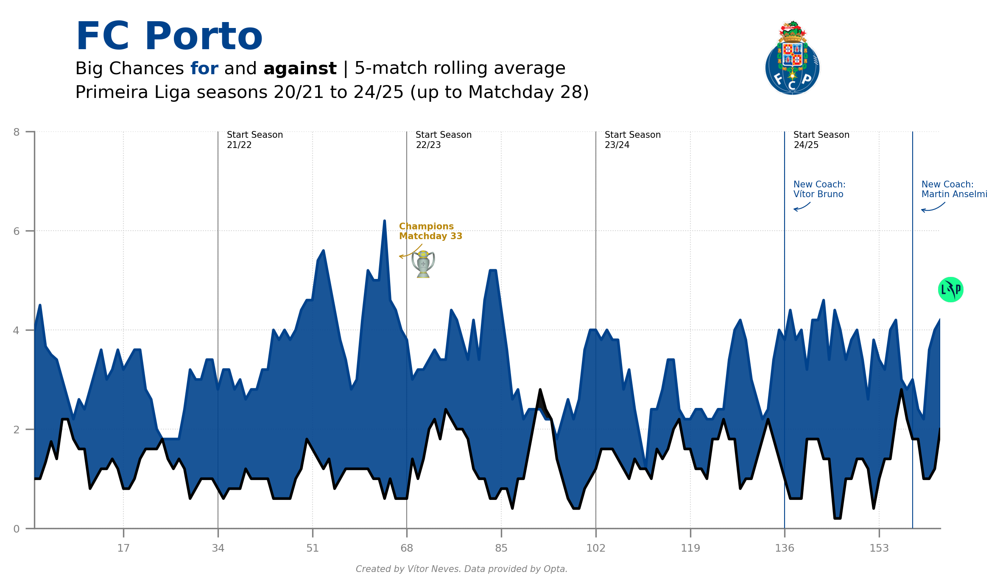

In [288]:
# ------------------------------
# IMPORTS
# ------------------------------
import matplotlib.pyplot as plt
import pandas as pd
from urllib.request import urlopen
from PIL import Image
import matplotlib.ticker as ticker
from highlight_text import fig_text

# ------------------------------
# FIGURE SETUP
# ------------------------------
fig = plt.figure(figsize=(8, 4), dpi=300, facecolor="white")
ax = plt.subplot(111, facecolor="white")

# Spine and grid styling
ax.spines[["top", "right"]].set_visible(False)
ax.spines[["left", "bottom"]].set_color("grey")
ax.grid(visible=True, lw=0.5, ls=":", color="lightgrey", zorder=1)

# ------------------------------
# DATA PLOTTING
# ------------------------------
matchdays = range(1, 165)
line_1 = ax.plot(matchdays, Y_for, color="#00428C", zorder=4)  # Accurate Passes for
line_2 = ax.plot(matchdays, Y_ag, color="#000000", zorder=4)  # Accurate Passes against

# Axis limits
ax.set_xlim(1, len(Y_for))
ax.set_ylim(0, 8)


# ------------------------------
# SEASON MARKERS
# ------------------------------
SEASON_BREAKS = [34, 68, 102, 136, 170]
SEASON_ANNOTATIONS = [
    (34, 7.5, "Start Season\n21/22"),
    (68, 7.5, "Start Season\n22/23"),
    (102, 7.5, "Start Season\n23/24"),
    (136, 7.5, "Start Season\n24/25"),
]

COACH_ANNOTATIONS = [
    (136, 6.5, "New Coach:\nVítor Bruno", line_1[0].get_color()),
    (159, 6.5, "New Coach:\nMartin Anselmi", line_1[0].get_color()),
]

# Vertical season dividers
for x in SEASON_BREAKS:
    ax.plot(
        [x, x],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color="grey",
        zorder=3,
    )

# Vertical coach change dividers
for x_val, _, _, color in COACH_ANNOTATIONS:
    ax.plot(
        [x_val, x_val],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color=color,
        zorder=3,
    )

# ------------------------------
# ANNOTATIONS
# ------------------------------
ARROW_STYLE = dict(
    arrowstyle="->",
    shrinkA=0,
    shrinkB=5,
    linewidth=0.5,
    connectionstyle="angle3,angleA=60,angleB=-30",
    zorder=4,
)

# Season start labels
for x, y, text in SEASON_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color="black",
        # arrowprops=ARROW_STYLE,
        zorder=4,
    )

# Coach labels
for x, y, text, color in COACH_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color=color,
        arrowprops={**ARROW_STYLE, "color": color},
        zorder=4,
    )

# Championship annotation
ax.annotate(
    xy=(65, 5.55),
    xytext=(5, 8),
    textcoords="offset points",
    text="Champions\nMatchday 33",
    size=5,
    color="#B8860B",
    weight="bold",
    arrowprops=dict(
        arrowstyle="->",
        shrinkA=0,
        shrinkB=5,
        color="#B8860B",
        linewidth=0.5,
        connectionstyle="angle3,angleA=60,angleB=-30",
    ),
    zorder=4,
)

# ------------------------------
# FILL BETWEEN AREAS
# ------------------------------
ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_for["Value"] > Y_ag["Value"],
    interpolate=True,
    alpha=0.90,
    zorder=3,
    color=line_1[0].get_color(),
)

ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_ag["Value"] > Y_for["Value"],
    interpolate=True,
    alpha=0.90,
    color=line_2[0].get_color(),
    zorder=3,
)

# ------------------------------
# TICK FORMATTING
# ------------------------------
ax.tick_params(
    color="grey", length=5, which="major", labelsize=6, labelcolor="grey", zorder=3
)
ax.xaxis.set_major_locator(ticker.MultipleLocator(17))
ax.yaxis.set_major_locator(ticker.MultipleLocator(2))

# ------------------------------
# TITLES & TEXT
# ------------------------------
fig_text(
    x=0.12,
    y=1.1,
    s="FC Porto",
    color=line_1[0].get_color(),
    weight="bold",
    size=22,
    annotationbbox_kw={"xycoords": "figure fraction"},
)

fig_text(
    x=0.12,
    y=1.02,
    s="Big Chances <for> and <against> | 5-match rolling average \nPrimeira Liga seasons 20/21 to 24/25 (up to Matchday 28)",
    highlight_textprops=[
        {"color": line_1[0].get_color(), "weight": "bold"},
        {"color": line_2[0].get_color(), "weight": "bold"},
    ],
    color="black",
    size=10,
    annotationbbox_kw={"xycoords": "figure fraction"},
)


# ------------------------------
# LOGO PLACEMENT
# ------------------------------
def data_to_fig_coords(ax, x_data, y_data, fig):
    """Convert data coordinates to figure coordinates [0-1 range]"""
    display_coords = ax.transData.transform((x_data, y_data))
    fig_width, fig_height = fig.get_size_inches() * fig.dpi
    return display_coords[0] / fig_width, display_coords[1] / fig_height


def add_logo(fig, image, x_pos, y_pos, width=0.05, height=0.05):
    """Helper to add logos at specified positions"""
    logo_ax = fig.add_axes([x_pos, y_pos, width, height], zorder=4)
    logo_ax.imshow(image, extent=[0.25, 0.75, 0.25, 0.75])
    logo_ax.axis("off")


# Load logos
team_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/teamlogo/9773.png")
)
competition_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/leaguelogo/61.png")
)
trophy_logo = Image.open(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\Primeira_Liga_Trophy.png"
)

# Calculate logo positions
fig_rel_x, fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[163]), float(Y_for["Value"].iloc[163]), fig
)
trophy_fig_rel_x, trophy_fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[66]), float(Y_for["Value"].iloc[66] + 1), fig
)

# Add logos
add_logo(fig, team_logo, 0.75, 0.95, 0.15, 0.15)  # Top-right
add_logo(fig, competition_logo, fig_rel_x + 0.06, fig_rel_y + 0.03)  # Last data point
add_logo(
    fig, trophy_logo, trophy_fig_rel_x, trophy_fig_rel_y, 0.055, 0.055
)  # Championship point

# Add footer text
fig.text(
    0.5,
    0.015,
    "Created by Vítor Neves. Data provided by Opta.",
    fontstyle="italic",
    ha="center",
    fontsize=5,
    color="grey",
)

# ------------------------------
# SAFE LAYOUT ADJUSTMENT (Avoids warning)
# ------------------------------
def auto_adjust_layout(fig, top=0.88, bottom=0.10, left=0.08, right=0.97):
    """
    Ajusta margens de forma segura, evitando problemas com add_axes.
    """
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right)


auto_adjust_layout(fig)

# ------------------------------
# FINAL SAVE
# ------------------------------
fig.savefig(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\media\Big_Chances_Porto_5Rolling_Average_1920_2425.jpg",
    transparent=True,
    bbox_inches="tight",
    dpi=300,
)


### Total Shots

#### Variable Selection

In [289]:
variable_for = "Total Shots for"
variable_ag = "Total Shots ag"

#### Rolling metrics calculation

In [290]:
# xG conceded and xG created
Y_for = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_for
].reset_index(drop=True)
Y_ag = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_ag
].reset_index(drop=True)
X = pd.Series(range(len(Y_for)))

# compute the rolling average (min_periods is used for the partial average)
# here we're using a 10 game rolling average
Y_for["Value"] = Y_for["Value"].rolling(window=5, min_periods=0).mean()
Y_ag["Value"] = Y_ag["Value"].rolling(window=5, min_periods=0).mean()

Y_for = Y_for[["Value"]].reset_index(drop=True)
Y_ag = Y_ag[["Value"]].reset_index(drop=True)

display(Y_for.head())
display(Y_ag.head())

,Value
0,11.000000
1,13.000000
2,19.333333
3,17.000000
4,17.200000


,Value
0,7.000000
1,9.000000
2,9.666667
3,10.500000
4,11.000000


#### Big Chances Data Viz

##### Plotting the visualization

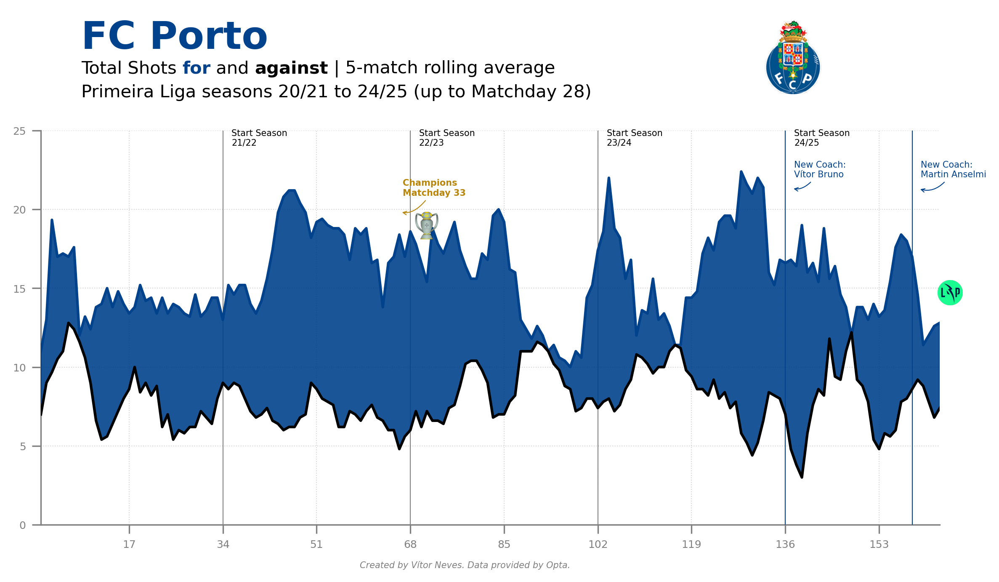

In [291]:
# ------------------------------
# IMPORTS
# ------------------------------
import matplotlib.pyplot as plt
import pandas as pd
from urllib.request import urlopen
from PIL import Image
import matplotlib.ticker as ticker
from highlight_text import fig_text

# ------------------------------
# FIGURE SETUP
# ------------------------------
fig = plt.figure(figsize=(8, 4), dpi=300, facecolor="white")
ax = plt.subplot(111, facecolor="white")

# Spine and grid styling
ax.spines[["top", "right"]].set_visible(False)
ax.spines[["left", "bottom"]].set_color("grey")
ax.grid(visible=True, lw=0.5, ls=":", color="lightgrey", zorder=1)

# ------------------------------
# DATA PLOTTING
# ------------------------------
matchdays = range(1, 165)
line_1 = ax.plot(matchdays, Y_for, color="#00428C", zorder=4)  # Accurate Passes for
line_2 = ax.plot(matchdays, Y_ag, color="#000000", zorder=4)  # Accurate Passes against

# Axis limits
ax.set_xlim(1, len(Y_for))
ax.set_ylim(0, 25)


# ------------------------------
# SEASON MARKERS
# ------------------------------
SEASON_BREAKS = [34, 68, 102, 136, 170]
SEASON_ANNOTATIONS = [
    (34, 23.5, "Start Season\n21/22"),
    (68, 23.5, "Start Season\n22/23"),
    (102, 23.5, "Start Season\n23/24"),
    (136, 23.5, "Start Season\n24/25"),
]

COACH_ANNOTATIONS = [
    (136, 21.5, "New Coach:\nVítor Bruno", line_1[0].get_color()),
    (159, 21.5, "New Coach:\nMartin Anselmi", line_1[0].get_color()),
]

# Vertical season dividers
for x in SEASON_BREAKS:
    ax.plot(
        [x, x],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color="grey",
        zorder=3,
    )

# Vertical coach change dividers
for x_val, _, _, color in COACH_ANNOTATIONS:
    ax.plot(
        [x_val, x_val],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color=color,
        zorder=3,
    )

# ------------------------------
# ANNOTATIONS
# ------------------------------
ARROW_STYLE = dict(
    arrowstyle="->",
    shrinkA=0,
    shrinkB=5,
    linewidth=0.5,
    connectionstyle="angle3,angleA=60,angleB=-30",
    zorder=4,
)

# Season start labels
for x, y, text in SEASON_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color="black",
        # arrowprops=ARROW_STYLE,
        zorder=4,
    )

# Coach labels
for x, y, text, color in COACH_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color=color,
        arrowprops={**ARROW_STYLE, "color": color},
        zorder=4,
    )

# Championship annotation
ax.annotate(
    xy=(65, 20),
    xytext=(5, 8),
    textcoords="offset points",
    text="Champions\nMatchday 33",
    size=5,
    color="#B8860B",
    weight="bold",
    arrowprops=dict(
        arrowstyle="->",
        shrinkA=0,
        shrinkB=5,
        color="#B8860B",
        linewidth=0.5,
        connectionstyle="angle3,angleA=60,angleB=-30",
    ),
    zorder=4,
)

# ------------------------------
# FILL BETWEEN AREAS
# ------------------------------
ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_for["Value"] > Y_ag["Value"],
    interpolate=True,
    alpha=0.90,
    zorder=3,
    color=line_1[0].get_color(),
)

ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_ag["Value"] > Y_for["Value"],
    interpolate=True,
    alpha=0.90,
    color=line_2[0].get_color(),
    zorder=3,
)

# ------------------------------
# TICK FORMATTING
# ------------------------------
ax.tick_params(
    color="grey", length=5, which="major", labelsize=6, labelcolor="grey", zorder=3
)
ax.xaxis.set_major_locator(ticker.MultipleLocator(17))
ax.yaxis.set_major_locator(ticker.MultipleLocator(5))

# ------------------------------
# TITLES & TEXT
# ------------------------------
fig_text(
    x=0.12,
    y=1.1,
    s="FC Porto",
    color=line_1[0].get_color(),
    weight="bold",
    size=22,
    annotationbbox_kw={"xycoords": "figure fraction"},
)

fig_text(
    x=0.12,
    y=1.02,
    s="Total Shots <for> and <against> | 5-match rolling average \nPrimeira Liga seasons 20/21 to 24/25 (up to Matchday 28)",
    highlight_textprops=[
        {"color": line_1[0].get_color(), "weight": "bold"},
        {"color": line_2[0].get_color(), "weight": "bold"},
    ],
    color="black",
    size=10,
    annotationbbox_kw={"xycoords": "figure fraction"},
)


# ------------------------------
# LOGO PLACEMENT
# ------------------------------
def data_to_fig_coords(ax, x_data, y_data, fig):
    """Convert data coordinates to figure coordinates [0-1 range]"""
    display_coords = ax.transData.transform((x_data, y_data))
    fig_width, fig_height = fig.get_size_inches() * fig.dpi
    return display_coords[0] / fig_width, display_coords[1] / fig_height


def add_logo(fig, image, x_pos, y_pos, width=0.05, height=0.05):
    """Helper to add logos at specified positions"""
    logo_ax = fig.add_axes([x_pos, y_pos, width, height], zorder=4)
    logo_ax.imshow(image, extent=[0.25, 0.75, 0.25, 0.75])
    logo_ax.axis("off")


# Load logos
team_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/teamlogo/9773.png")
)
competition_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/leaguelogo/61.png")
)
trophy_logo = Image.open(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\Primeira_Liga_Trophy.png"
)

# Calculate logo positions
fig_rel_x, fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[163]), float(Y_for["Value"].iloc[163]), fig
)
trophy_fig_rel_x, trophy_fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[66]), float(Y_for["Value"].iloc[66] + 1), fig
)

# Add logos
add_logo(fig, team_logo, 0.75, 0.95, 0.15, 0.15)  # Top-right
add_logo(fig, competition_logo, fig_rel_x + 0.06, fig_rel_y + 0.03)  # Last data point
add_logo(
    fig, trophy_logo, trophy_fig_rel_x, trophy_fig_rel_y, 0.055, 0.055
)  # Championship point

# Add footer text
fig.text(
    0.5,
    0.015,
    "Created by Vítor Neves. Data provided by Opta.",
    fontstyle="italic",
    ha="center",
    fontsize=5,
    color="grey",
)

# ------------------------------
# SAFE LAYOUT ADJUSTMENT (Avoids warning)
# ------------------------------
def auto_adjust_layout(fig, top=0.88, bottom=0.10, left=0.08, right=0.97):
    """
    Ajusta margens de forma segura, evitando problemas com add_axes.
    """
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right)


auto_adjust_layout(fig)

# ------------------------------
# FINAL SAVE
# ------------------------------
fig.savefig(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\media\Total_Shots_Porto_5Rolling_Average_1920_2425.jpg",
    transparent=True,
    bbox_inches="tight",
    dpi=300,
)


### Big Chances Missed Shots

#### Variable Selection

In [292]:
variable_for = "Big Chances Missed for"
variable_ag = "Big Chances Missed ag"

#### Rolling metrics calculation

In [293]:
# xG conceded and xG created
Y_for = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_for
].reset_index(drop=True)
Y_ag = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_ag
].reset_index(drop=True)
X = pd.Series(range(len(Y_for)))

# compute the rolling average (min_periods is used for the partial average)
# here we're using a 10 game rolling average
Y_for["Value"] = Y_for["Value"].rolling(window=5, min_periods=0).mean()
Y_ag["Value"] = Y_ag["Value"].rolling(window=5, min_periods=0).mean()

Y_for = Y_for[["Value"]].reset_index(drop=True)
Y_ag = Y_ag[["Value"]].reset_index(drop=True)

display(Y_for.head())
display(Y_ag.head())

,Value
0,2.00
1,2.00
2,2.00
3,1.75
4,1.80


,Value
0,1.000000
1,1.000000
2,0.666667
3,1.000000
4,0.800000


#### Big Chances Data Viz

##### Plotting the visualization

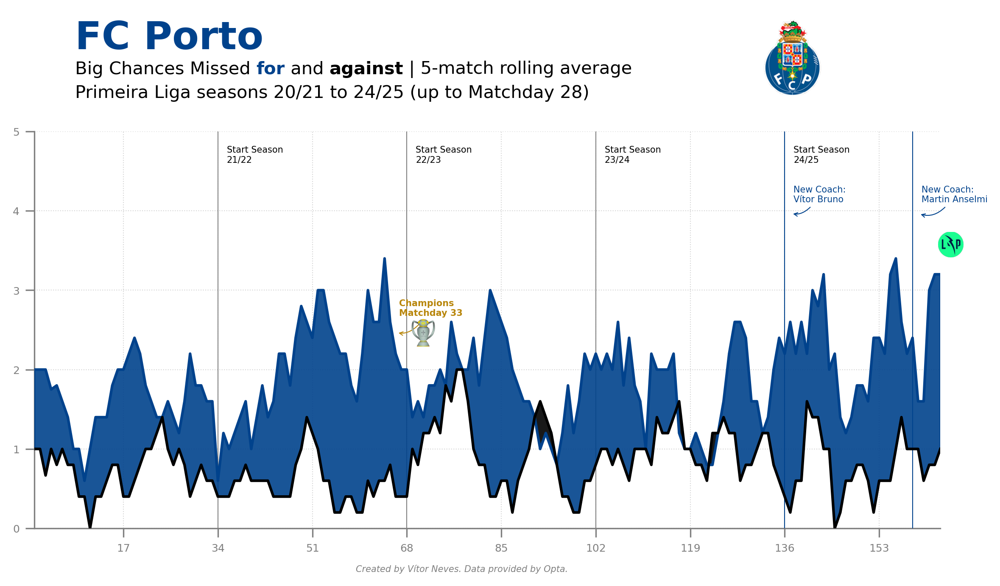

In [294]:
# ------------------------------
# IMPORTS
# ------------------------------
import matplotlib.pyplot as plt
import pandas as pd
from urllib.request import urlopen
from PIL import Image
import matplotlib.ticker as ticker
from highlight_text import fig_text

# ------------------------------
# FIGURE SETUP
# ------------------------------
fig = plt.figure(figsize=(8, 4), dpi=300, facecolor="white")
ax = plt.subplot(111, facecolor="white")

# Spine and grid styling
ax.spines[["top", "right"]].set_visible(False)
ax.spines[["left", "bottom"]].set_color("grey")
ax.grid(visible=True, lw=0.5, ls=":", color="lightgrey", zorder=1)

# ------------------------------
# DATA PLOTTING
# ------------------------------
matchdays = range(1, 165)
line_1 = ax.plot(matchdays, Y_for, color="#00428C", zorder=4)  # Accurate Passes for
line_2 = ax.plot(matchdays, Y_ag, color="#000000", zorder=4)  # Accurate Passes against

# Axis limits
ax.set_xlim(1, len(Y_for))
ax.set_ylim(0, 5)


# ------------------------------
# SEASON MARKERS
# ------------------------------
SEASON_BREAKS = [34, 68, 102, 136, 170]
SEASON_ANNOTATIONS = [
    (34, 4.5, "Start Season\n21/22"),
    (68, 4.5, "Start Season\n22/23"),
    (102, 4.5, "Start Season\n23/24"),
    (136, 4.5, "Start Season\n24/25"),
]

COACH_ANNOTATIONS = [
    (136, 4, "New Coach:\nVítor Bruno", line_1[0].get_color()),
    (159, 4, "New Coach:\nMartin Anselmi", line_1[0].get_color()),
]

# Vertical season dividers
for x in SEASON_BREAKS:
    ax.plot(
        [x, x],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color="grey",
        zorder=3,
    )

# Vertical coach change dividers
for x_val, _, _, color in COACH_ANNOTATIONS:
    ax.plot(
        [x_val, x_val],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color=color,
        zorder=3,
    )

# ------------------------------
# ANNOTATIONS
# ------------------------------
ARROW_STYLE = dict(
    arrowstyle="->",
    shrinkA=0,
    shrinkB=5,
    linewidth=0.5,
    connectionstyle="angle3,angleA=60,angleB=-30",
    zorder=4,
)

# Season start labels
for x, y, text in SEASON_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color="black",
        # arrowprops=ARROW_STYLE,
        zorder=4,
    )

# Coach labels
for x, y, text, color in COACH_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color=color,
        arrowprops={**ARROW_STYLE, "color": color},
        zorder=4,
    )

# Championship annotation
ax.annotate(
    xy=(65, 2.5),
    xytext=(5, 8),
    textcoords="offset points",
    text="Champions\nMatchday 33",
    size=5,
    color="#B8860B",
    weight="bold",
    arrowprops=dict(
        arrowstyle="->",
        shrinkA=0,
        shrinkB=5,
        color="#B8860B",
        linewidth=0.5,
        connectionstyle="angle3,angleA=60,angleB=-30",
    ),
    zorder=4,
)

# ------------------------------
# FILL BETWEEN AREAS
# ------------------------------
ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_for["Value"] > Y_ag["Value"],
    interpolate=True,
    alpha=0.90,
    zorder=3,
    color=line_1[0].get_color(),
)

ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_ag["Value"] > Y_for["Value"],
    interpolate=True,
    alpha=0.90,
    color=line_2[0].get_color(),
    zorder=3,
)

# ------------------------------
# TICK FORMATTING
# ------------------------------
ax.tick_params(
    color="grey", length=5, which="major", labelsize=6, labelcolor="grey", zorder=3
)
ax.xaxis.set_major_locator(ticker.MultipleLocator(17))
ax.yaxis.set_major_locator(ticker.MultipleLocator(1))

# ------------------------------
# TITLES & TEXT
# ------------------------------
fig_text(
    x=0.12,
    y=1.1,
    s="FC Porto",
    color=line_1[0].get_color(),
    weight="bold",
    size=22,
    annotationbbox_kw={"xycoords": "figure fraction"},
)

fig_text(
    x=0.12,
    y=1.02,
    s="Big Chances Missed <for> and <against> | 5-match rolling average \nPrimeira Liga seasons 20/21 to 24/25 (up to Matchday 28)",
    highlight_textprops=[
        {"color": line_1[0].get_color(), "weight": "bold"},
        {"color": line_2[0].get_color(), "weight": "bold"},
    ],
    color="black",
    size=10,
    annotationbbox_kw={"xycoords": "figure fraction"},
)


# ------------------------------
# LOGO PLACEMENT
# ------------------------------
def data_to_fig_coords(ax, x_data, y_data, fig):
    """Convert data coordinates to figure coordinates [0-1 range]"""
    display_coords = ax.transData.transform((x_data, y_data))
    fig_width, fig_height = fig.get_size_inches() * fig.dpi
    return display_coords[0] / fig_width, display_coords[1] / fig_height


def add_logo(fig, image, x_pos, y_pos, width=0.05, height=0.05):
    """Helper to add logos at specified positions"""
    logo_ax = fig.add_axes([x_pos, y_pos, width, height], zorder=4)
    logo_ax.imshow(image, extent=[0.25, 0.75, 0.25, 0.75])
    logo_ax.axis("off")


# Load logos
team_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/teamlogo/9773.png")
)
competition_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/leaguelogo/61.png")
)
trophy_logo = Image.open(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\Primeira_Liga_Trophy.png"
)

# Calculate logo positions
fig_rel_x, fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[163]), float(Y_for["Value"].iloc[163]), fig
)
trophy_fig_rel_x, trophy_fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[66]), float(Y_for["Value"].iloc[66] + 0.25), fig
)

# Add logos
add_logo(fig, team_logo, 0.75, 0.95, 0.15, 0.15)  # Top-right
add_logo(fig, competition_logo, fig_rel_x + 0.06, fig_rel_y + 0.03)  # Last data point
add_logo(
    fig, trophy_logo, trophy_fig_rel_x, trophy_fig_rel_y, 0.055, 0.055
)  # Championship point

# Add footer text
fig.text(
    0.5,
    0.015,
    "Created by Vítor Neves. Data provided by Opta.",
    fontstyle="italic",
    ha="center",
    fontsize=5,
    color="grey",
)

# ------------------------------
# SAFE LAYOUT ADJUSTMENT (Avoids warning)
# ------------------------------
def auto_adjust_layout(fig, top=0.88, bottom=0.10, left=0.08, right=0.97):
    """
    Ajusta margens de forma segura, evitando problemas com add_axes.
    """
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right)


auto_adjust_layout(fig)

# ------------------------------
# FINAL SAVE
# ------------------------------
fig.savefig(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\media\Big_Chances_Missed_Porto_5Rolling_Average_1920_2425.jpg",
    transparent=True,
    bbox_inches="tight",
    dpi=300,
)


## 10-match Rolling Average Plots

### xG

#### Variable Selection

In [295]:
variable_for = "xG for"
variable_ag = "xG ag"

#### Rolling metrics calculation

In [296]:
# xG conceded and xG created
Y_for = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_for
].reset_index(drop=True)
Y_ag = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_ag
].reset_index(drop=True)
X = pd.Series(range(len(Y_for)))

# compute the rolling average (min_periods is used for the partial average)
# here we're using a 10 game rolling average
Y_for["Value"] = Y_for["Value"].rolling(window=10, min_periods=0).mean()
Y_ag["Value"] = Y_ag["Value"].rolling(window=10, min_periods=0).mean()

Y_for = Y_for[["Value"]].reset_index(drop=True)
Y_ag = Y_ag[["Value"]].reset_index(drop=True)

display(Y_for.head())
display(Y_ag.head())

,Value
0,2.730000
1,2.530000
2,2.583333
3,2.380000
4,2.434000


,Value
0,0.590000
1,0.905000
2,1.003333
3,1.190000
4,1.116000


#### xG Data Viz

##### Plotting the visualization

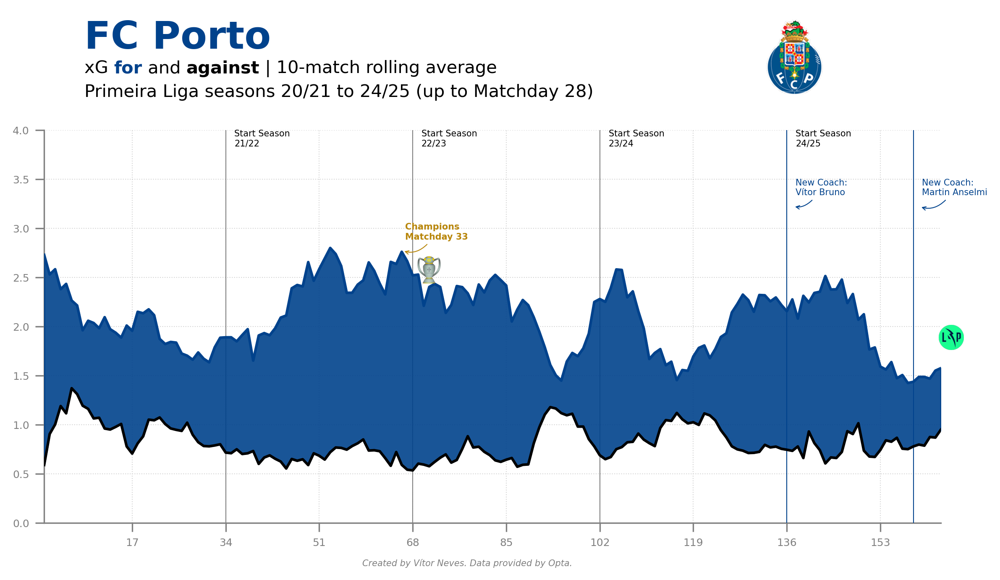

In [297]:
# ------------------------------
# IMPORTS
# ------------------------------
import matplotlib.pyplot as plt
import pandas as pd
from urllib.request import urlopen
from PIL import Image
import matplotlib.ticker as ticker
from highlight_text import fig_text

# ------------------------------
# FIGURE SETUP
# ------------------------------
fig = plt.figure(figsize=(8, 4), dpi=300, facecolor="white")
ax = plt.subplot(111, facecolor="white")

# Spine and grid styling
ax.spines[["top", "right"]].set_visible(False)
ax.spines[["left", "bottom"]].set_color("grey")
ax.grid(visible=True, lw=0.5, ls=":", color="lightgrey", zorder=1)

# ------------------------------
# DATA PLOTTING
# ------------------------------
matchdays = range(1, 165)
line_1 = ax.plot(matchdays, Y_for, color="#00428C", zorder=4)  # xG for
line_2 = ax.plot(matchdays, Y_ag, color="#000000", zorder=4)  # xG against

# Axis limits
ax.set_xlim(1, len(Y_for))
ax.set_ylim(0, 4)

# ------------------------------
# SEASON MARKERS
# ------------------------------
SEASON_BREAKS = [34, 68, 102, 136, 170]
SEASON_ANNOTATIONS = [
    (34, 3.75, "Start Season\n21/22"),
    (68, 3.75, "Start Season\n22/23"),
    (102, 3.75, "Start Season\n23/24"),
    (136, 3.75, "Start Season\n24/25"),
]

COACH_ANNOTATIONS = [
    (136, 3.25, "New Coach:\nVítor Bruno", line_1[0].get_color()),
    (159, 3.25, "New Coach:\nMartin Anselmi", line_1[0].get_color()),
]

# Vertical season dividers
for x in SEASON_BREAKS:
    ax.plot(
        [x, x],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color="grey",
        zorder=3,
    )

# Vertical coach change dividers
for x_val, _, _, color in COACH_ANNOTATIONS:
    ax.plot(
        [x_val, x_val],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color=color,
        zorder=3,
    )

# ------------------------------
# ANNOTATIONS
# ------------------------------
ARROW_STYLE = dict(
    arrowstyle="->",
    shrinkA=0,
    shrinkB=5,
    linewidth=0.5,
    connectionstyle="angle3,angleA=60,angleB=-30",
)

# Season start labels
for x, y, text in SEASON_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color="black",
        # arrowprops=ARROW_STYLE,
        zorder=4,
    )

# Coach labels
for x, y, text, color in COACH_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color=color,
        arrowprops={**ARROW_STYLE, "color": color},
        zorder=4,
    )

# Championship annotation
ax.annotate(
    xy=(65, 2.8),
    xytext=(5, 5),
    textcoords="offset points",
    text="Champions\nMatchday 33",
    size=5,
    color="#B8860B",
    weight="bold",
    arrowprops=dict(
        arrowstyle="->",
        shrinkA=0,
        shrinkB=5,
        color="#B8860B",
        linewidth=0.5,
        connectionstyle="angle3,angleA=60,angleB=-30",
    ),
    zorder=4,
)

# ------------------------------
# FILL BETWEEN AREAS
# ------------------------------
ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_for["Value"] > Y_ag["Value"],
    interpolate=True,
    alpha=0.90,
    zorder=3,
    color=line_1[0].get_color(),
)

ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_ag["Value"] > Y_for["Value"],
    interpolate=True,
    alpha=0.90,
    color=line_2[0].get_color(),
    zorder=3,
)

# ------------------------------
# TICK FORMATTING
# ------------------------------
ax.tick_params(
    color="grey", length=5, which="major", labelsize=6, labelcolor="grey", zorder=3
)
ax.xaxis.set_major_locator(ticker.MultipleLocator(17))
ax.yaxis.set_major_locator(ticker.MultipleLocator(0.5))

# ------------------------------
# TITLES & TEXT
# ------------------------------
fig_text(
    x=0.12,
    y=1.1,
    s="FC Porto",
    color=line_1[0].get_color(),
    weight="bold",
    size=22,
    annotationbbox_kw={"xycoords": "figure fraction"},
)

fig_text(
    x=0.12,
    y=1.02,
    s="xG <for> and <against> | 10-match rolling average \nPrimeira Liga seasons 20/21 to 24/25 (up to Matchday 28)",
    highlight_textprops=[
        {"color": line_1[0].get_color(), "weight": "bold"},
        {"color": line_2[0].get_color(), "weight": "bold"},
    ],
    color="black",
    size=10,
    annotationbbox_kw={"xycoords": "figure fraction"},
)


# ------------------------------
# LOGO PLACEMENT
# ------------------------------
def data_to_fig_coords(ax, x_data, y_data, fig):
    """Convert data coordinates to figure coordinates [0-1 range]"""
    display_coords = ax.transData.transform((x_data, y_data))
    fig_width, fig_height = fig.get_size_inches() * fig.dpi
    return display_coords[0] / fig_width, display_coords[1] / fig_height


def add_logo(fig, image, x_pos, y_pos, width=0.05, height=0.05):
    """Helper to add logos at specified positions"""
    logo_ax = fig.add_axes([x_pos, y_pos, width, height], zorder=4)
    logo_ax.imshow(image, extent=[0.25, 0.75, 0.25, 0.75])
    logo_ax.axis("off")


# Load logos
team_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/teamlogo/9773.png")
)
competition_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/leaguelogo/61.png")
)
trophy_logo = Image.open(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\Primeira_Liga_Trophy.png"
)

# Calculate logo positions
fig_rel_x, fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[163]), float(Y_for["Value"].iloc[163]), fig
)
trophy_fig_rel_x, trophy_fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[66]), float(Y_for["Value"].iloc[66]-0.25), fig
)

# Add logos
add_logo(fig, team_logo, 0.75, 0.95, 0.15, 0.15)  # Top-right
add_logo(fig, competition_logo, fig_rel_x + 0.06, fig_rel_y + 0.03)  # Last data point
add_logo(
    fig, trophy_logo, trophy_fig_rel_x, trophy_fig_rel_y, 0.055, 0.055
)  # Championship point

# Add footer text
fig.text(
    0.5,
    0.015,
    "Created by Vítor Neves. Data provided by Opta.",
    fontstyle="italic",
    ha="center",
    fontsize=5,
    color="grey",
)

# ------------------------------
# SAFE LAYOUT ADJUSTMENT (Avoids warning)
# ------------------------------
def auto_adjust_layout(fig, top=0.88, bottom=0.10, left=0.08, right=0.97):
    """
    Ajusta margens de forma segura, evitando problemas com add_axes.
    """
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right)


auto_adjust_layout(fig)

# ------------------------------
# FINAL SAVE
# ------------------------------
fig.savefig(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\media\xG_Porto_10Rolling_Average_1920_2425.jpg",
    transparent=True,
    bbox_inches="tight",
    dpi=300,
)


### Accurate Passes

#### Variable Selection

In [298]:
variable_for = "Accurate Passes for"
variable_ag = "Accurate Passes ag"

#### Rolling metrics calculation

In [299]:
# xG conceded and xG created
Y_for = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_for
].reset_index(drop=True)
Y_ag = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_ag
].reset_index(drop=True)
X = pd.Series(range(len(Y_for)))

# compute the rolling average (min_periods is used for the partial average)
# here we're using a 10 game rolling average
Y_for["Value"] = Y_for["Value"].rolling(window=10, min_periods=0).mean()
Y_ag["Value"] = Y_ag["Value"].rolling(window=10, min_periods=0).mean()

Y_for = Y_for[["Value"]].reset_index(drop=True)
Y_ag = Y_ag[["Value"]].reset_index(drop=True)

display(Y_for.head())
display(Y_ag.head())

,Value
0,370.000000
1,380.500000
2,438.333333
3,390.250000
4,403.200000


,Value
0,321.000000
1,286.000000
2,224.666667
3,247.000000
4,255.200000


#### Accurate passes Data Viz

##### Plotting the visualization

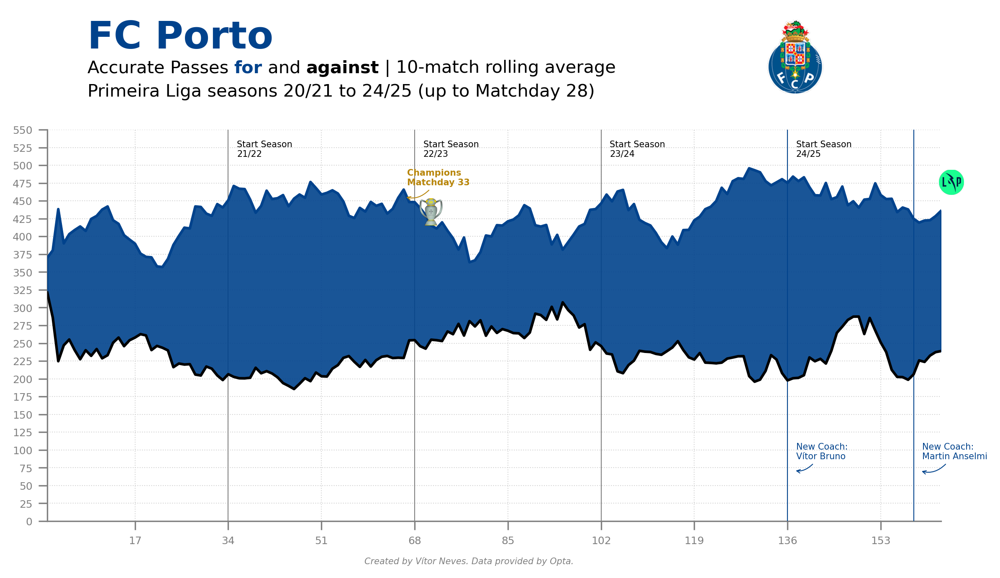

In [300]:
# ------------------------------
# IMPORTS
# ------------------------------
import matplotlib.pyplot as plt
import pandas as pd
from urllib.request import urlopen
from PIL import Image
import matplotlib.ticker as ticker
from highlight_text import fig_text

# ------------------------------
# FIGURE SETUP
# ------------------------------
fig = plt.figure(figsize=(8, 4), dpi=300, facecolor="white")
ax = plt.subplot(111, facecolor="white")

# Spine and grid styling
ax.spines[["top", "right"]].set_visible(False)
ax.spines[["left", "bottom"]].set_color("grey")
ax.grid(visible=True, lw=0.5, ls=":", color="lightgrey", zorder=1)

# ------------------------------
# DATA PLOTTING
# ------------------------------
matchdays = range(1, 165)
line_1 = ax.plot(matchdays, Y_for, color="#00428C", zorder=4)  # Accurate Passes for
line_2 = ax.plot(matchdays, Y_ag, color="#000000", zorder=4)  # Accurate Passes against

# Axis limits
ax.set_xlim(1, len(Y_for))
ax.set_ylim(0, 550)


# ------------------------------
# SEASON MARKERS
# ------------------------------
SEASON_BREAKS = [34, 68, 102, 136, 170]
SEASON_ANNOTATIONS = [
    (34, 500, "Start Season\n21/22"),
    (68, 500, "Start Season\n22/23"),
    (102, 500, "Start Season\n23/24"),
    (136, 500, "Start Season\n24/25"),
]

COACH_ANNOTATIONS = [
    (136, 75, "New Coach:\nVítor Bruno", line_1[0].get_color()),
    (159, 75, "New Coach:\nMartin Anselmi", line_1[0].get_color()),
]

# Vertical season dividers
for x in SEASON_BREAKS:
    ax.plot(
        [x, x],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color="grey",
        zorder=3,
    )

# Vertical coach change dividers
for x_val, _, _, color in COACH_ANNOTATIONS:
    ax.plot(
        [x_val, x_val],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color=color,
        zorder=3,
    )

# ------------------------------
# ANNOTATIONS
# ------------------------------
ARROW_STYLE = dict(
    arrowstyle="->",
    shrinkA=0,
    shrinkB=5,
    linewidth=0.5,
    connectionstyle="angle3,angleA=60,angleB=-30",
    zorder=4,
)

# Season start labels
for x, y, text in SEASON_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color="black",
        # arrowprops=ARROW_STYLE,
        zorder=4,
    )

# Coach labels
for x, y, text, color in COACH_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color=color,
        arrowprops={**ARROW_STYLE, "color": color},
        zorder=4,
    )

# Championship annotation
ax.annotate(
    xy=(65, 460),
    xytext=(5, 5),
    textcoords="offset points",
    text="Champions\nMatchday 33",
    size=5,
    color="#B8860B",
    weight="bold",
    arrowprops=dict(
        arrowstyle="->",
        shrinkA=0,
        shrinkB=5,
        color="#B8860B",
        linewidth=0.5,
        connectionstyle="angle3,angleA=60,angleB=-30",
    ),
    zorder=4,
)

# ------------------------------
# FILL BETWEEN AREAS
# ------------------------------
ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_for["Value"] > Y_ag["Value"],
    interpolate=True,
    alpha=0.90,
    zorder=3,
    color=line_1[0].get_color(),
)

ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_ag["Value"] > Y_for["Value"],
    interpolate=True,
    alpha=0.90,
    color=line_2[0].get_color(),
    zorder=3,
)

# ------------------------------
# TICK FORMATTING
# ------------------------------
ax.tick_params(
    color="grey", length=5, which="major", labelsize=6, labelcolor="grey", zorder=3
)
ax.xaxis.set_major_locator(ticker.MultipleLocator(17))
ax.yaxis.set_major_locator(ticker.MultipleLocator(25))

# ------------------------------
# TITLES & TEXT
# ------------------------------
fig_text(
    x=0.12,
    y=1.1,
    s="FC Porto",
    color=line_1[0].get_color(),
    weight="bold",
    size=22,
    annotationbbox_kw={"xycoords": "figure fraction"},
)

fig_text(
    x=0.12,
    y=1.02,
    s="Accurate Passes <for> and <against> | 10-match rolling average \nPrimeira Liga seasons 20/21 to 24/25 (up to Matchday 28)",
    highlight_textprops=[
        {"color": line_1[0].get_color(), "weight": "bold"},
        {"color": line_2[0].get_color(), "weight": "bold"},
    ],
    color="black",
    size=10,
    annotationbbox_kw={"xycoords": "figure fraction"},
)


# ------------------------------
# LOGO PLACEMENT
# ------------------------------
def data_to_fig_coords(ax, x_data, y_data, fig):
    """Convert data coordinates to figure coordinates [0-1 range]"""
    display_coords = ax.transData.transform((x_data, y_data))
    fig_width, fig_height = fig.get_size_inches() * fig.dpi
    return display_coords[0] / fig_width, display_coords[1] / fig_height


def add_logo(fig, image, x_pos, y_pos, width=0.05, height=0.05):
    """Helper to add logos at specified positions"""
    logo_ax = fig.add_axes([x_pos, y_pos, width, height], zorder=4)
    logo_ax.imshow(image, extent=[0.25, 0.75, 0.25, 0.75])
    logo_ax.axis("off")


# Load logos
team_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/teamlogo/9773.png")
)
competition_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/leaguelogo/61.png")
)
trophy_logo = Image.open(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\Primeira_Liga_Trophy.png"
)

# Calculate logo positions
fig_rel_x, fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[163]), float(Y_for["Value"].iloc[163]), fig
)
trophy_fig_rel_x, trophy_fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[66]), float(Y_for["Value"].iloc[66] - 35), fig
)

# Add logos
add_logo(fig, team_logo, 0.75, 0.95, 0.15, 0.15)  # Top-right
add_logo(fig, competition_logo, fig_rel_x + 0.06, fig_rel_y + 0.03)  # Last data point
add_logo(
    fig, trophy_logo, trophy_fig_rel_x, trophy_fig_rel_y, 0.055, 0.055
)  # Championship point

# Add footer text
fig.text(
    0.5,
    0.015,
    "Created by Vítor Neves. Data provided by Opta.",
    fontstyle="italic",
    ha="center",
    fontsize=5,
    color="grey",
)

# ------------------------------
# SAFE LAYOUT ADJUSTMENT (Avoids warning)
# ------------------------------
def auto_adjust_layout(fig, top=0.88, bottom=0.10, left=0.08, right=0.97):
    """
    Ajusta margens de forma segura, evitando problemas com add_axes.
    """
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right)


auto_adjust_layout(fig)

# ------------------------------
# FINAL SAVE
# ------------------------------
fig.savefig(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\media\Accurate_Passes_Porto_10Rolling_Average_1920_2425.jpg",
    transparent=True,
    bbox_inches="tight",
    dpi=300,
)


### Ball Possession

#### Variable Selection

In [301]:
variable_for = "Ball Possession for"
variable_ag = "Ball Possession ag"

#### Rolling metrics calculation

In [302]:
# xG conceded and xG created
Y_for = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_for
].reset_index(drop=True)
Y_ag = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_ag
].reset_index(drop=True)
X = pd.Series(range(len(Y_for)))

# compute the rolling average (min_periods is used for the partial average)
# here we're using a 10 game rolling average
Y_for["Value"] = Y_for["Value"].rolling(window=10, min_periods=0).mean()
Y_ag["Value"] = Y_ag["Value"].rolling(window=10, min_periods=0).mean()

Y_for = Y_for[["Value"]].reset_index(drop=True)
Y_ag = Y_ag[["Value"]].reset_index(drop=True)

display(Y_for.head())
display(Y_ag.head())

,Value
0,53.000000
1,56.000000
2,63.333333
3,58.750000
4,58.800000


,Value
0,47.000000
1,44.000000
2,36.666667
3,41.250000
4,41.200000


#### Ball Possession Data Viz

##### Plotting the visualization

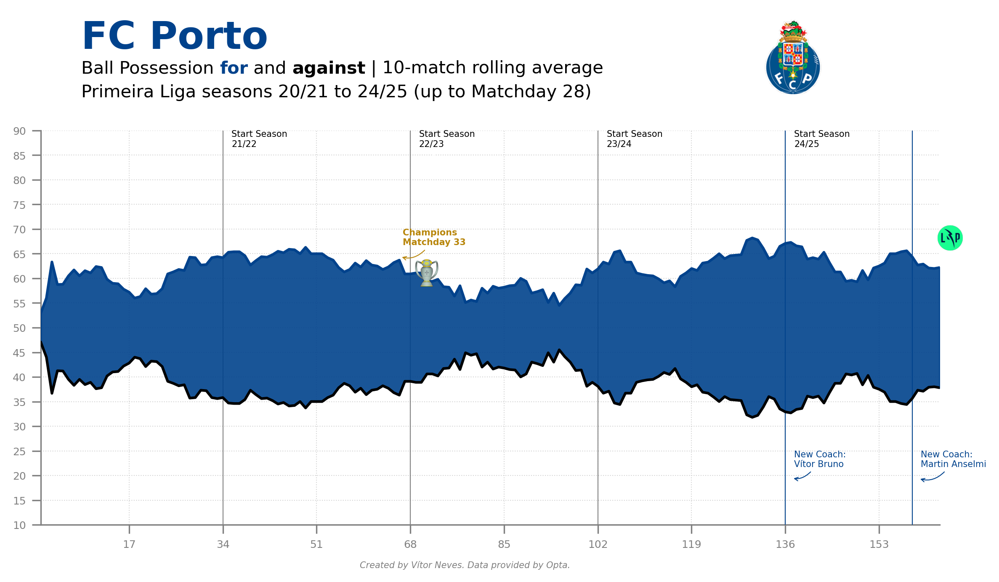

In [303]:
# ------------------------------
# IMPORTS
# ------------------------------
import matplotlib.pyplot as plt
import pandas as pd
from urllib.request import urlopen
from PIL import Image
import matplotlib.ticker as ticker
from highlight_text import fig_text

# ------------------------------
# FIGURE SETUP
# ------------------------------
fig = plt.figure(figsize=(8, 4), dpi=300, facecolor="white")
ax = plt.subplot(111, facecolor="white")

# Spine and grid styling
ax.spines[["top", "right"]].set_visible(False)
ax.spines[["left", "bottom"]].set_color("grey")
ax.grid(visible=True, lw=0.5, ls=":", color="lightgrey", zorder=1)

# ------------------------------
# DATA PLOTTING
# ------------------------------
matchdays = range(1, 165)
line_1 = ax.plot(matchdays, Y_for, color="#00428C", zorder=4)  # Accurate Passes for
line_2 = ax.plot(matchdays, Y_ag, color="#000000", zorder=4)  # Accurate Passes against

# Axis limits
ax.set_xlim(1, len(Y_for))
ax.set_ylim(10, 90)


# ------------------------------
# SEASON MARKERS
# ------------------------------
SEASON_BREAKS = [34, 68, 102, 136, 170]
SEASON_ANNOTATIONS = [
    (34, 85, "Start Season\n21/22"),
    (68, 85, "Start Season\n22/23"),
    (102, 85, "Start Season\n23/24"),
    (136, 85, "Start Season\n24/25"),
]

COACH_ANNOTATIONS = [
    (136, 20, "New Coach:\nVítor Bruno", line_1[0].get_color()),
    (159, 20, "New Coach:\nMartin Anselmi", line_1[0].get_color()),
]

# Vertical season dividers
for x in SEASON_BREAKS:
    ax.plot(
        [x, x],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color="grey",
        zorder=3,
    )

# Vertical coach change dividers
for x_val, _, _, color in COACH_ANNOTATIONS:
    ax.plot(
        [x_val, x_val],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color=color,
        zorder=3,
    )

# ------------------------------
# ANNOTATIONS
# ------------------------------
ARROW_STYLE = dict(
    arrowstyle="->",
    shrinkA=0,
    shrinkB=5,
    linewidth=0.5,
    connectionstyle="angle3,angleA=60,angleB=-30",
    zorder=4,
)

# Season start labels
for x, y, text in SEASON_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color="black",
        arrowprops=ARROW_STYLE,
        zorder=4,
    )

# Coach labels
for x, y, text, color in COACH_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color=color,
        arrowprops={**ARROW_STYLE, "color": color},
        zorder=4,
    )

# Championship annotation
ax.annotate(
    xy=(65, 65),
    xytext=(5, 5),
    textcoords="offset points",
    text="Champions\nMatchday 33",
    size=5,
    color="#B8860B",
    weight="bold",
    arrowprops=dict(
        arrowstyle="->",
        shrinkA=0,
        shrinkB=5,
        color="#B8860B",
        linewidth=0.5,
        connectionstyle="angle3,angleA=60,angleB=-30",
    ),
    zorder=4,
)

# ------------------------------
# FILL BETWEEN AREAS
# ------------------------------
ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_for["Value"] > Y_ag["Value"],
    interpolate=True,
    alpha=0.90,
    zorder=3,
    color=line_1[0].get_color(),
)

ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_ag["Value"] > Y_for["Value"],
    interpolate=True,
    alpha=0.90,
    color=line_2[0].get_color(),
    zorder=3,
)

# ------------------------------
# TICK FORMATTING
# ------------------------------
ax.tick_params(
    color="grey", length=5, which="major", labelsize=6, labelcolor="grey", zorder=3
)
ax.xaxis.set_major_locator(ticker.MultipleLocator(17))
ax.yaxis.set_major_locator(ticker.MultipleLocator(5))

# ------------------------------
# TITLES & TEXT
# ------------------------------
fig_text(
    x=0.12,
    y=1.1,
    s="FC Porto",
    color=line_1[0].get_color(),
    weight="bold",
    size=22,
    annotationbbox_kw={"xycoords": "figure fraction"},
)

fig_text(
    x=0.12,
    y=1.02,
    s="Ball Possession <for> and <against> | 10-match rolling average \nPrimeira Liga seasons 20/21 to 24/25 (up to Matchday 28)",
    highlight_textprops=[
        {"color": line_1[0].get_color(), "weight": "bold"},
        {"color": line_2[0].get_color(), "weight": "bold"},
    ],
    color="black",
    size=10,
    annotationbbox_kw={"xycoords": "figure fraction"},
)


# ------------------------------
# LOGO PLACEMENT
# ------------------------------
def data_to_fig_coords(ax, x_data, y_data, fig):
    """Convert data coordinates to figure coordinates [0-1 range]"""
    display_coords = ax.transData.transform((x_data, y_data))
    fig_width, fig_height = fig.get_size_inches() * fig.dpi
    return display_coords[0] / fig_width, display_coords[1] / fig_height


def add_logo(fig, image, x_pos, y_pos, width=0.05, height=0.05):
    """Helper to add logos at specified positions"""
    logo_ax = fig.add_axes([x_pos, y_pos, width, height], zorder=4)
    logo_ax.imshow(image, extent=[0.25, 0.75, 0.25, 0.75])
    logo_ax.axis("off")


# Load logos
team_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/teamlogo/9773.png")
)
competition_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/leaguelogo/61.png")
)
trophy_logo = Image.open(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\Primeira_Liga_Trophy.png"
)

# Calculate logo positions
fig_rel_x, fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[163]), float(Y_for["Value"].iloc[163]), fig
)
trophy_fig_rel_x, trophy_fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[66]), float(Y_for["Value"].iloc[66]-3), fig
)

# Add logos
add_logo(fig, team_logo, 0.75, 0.95, 0.15, 0.15)  # Top-right
add_logo(fig, competition_logo, fig_rel_x + 0.06, fig_rel_y + 0.03)  # Last data point
add_logo(
    fig, trophy_logo, trophy_fig_rel_x, trophy_fig_rel_y, 0.055, 0.055
)  # Championship point

# Add footer text
fig.text(
    0.5,
    0.015,
    "Created by Vítor Neves. Data provided by Opta.",
    fontstyle="italic",
    ha="center",
    fontsize=5,
    color="grey",
)

# ------------------------------
# SAFE LAYOUT ADJUSTMENT (Avoids warning)
# ------------------------------
def auto_adjust_layout(fig, top=0.88, bottom=0.10, left=0.08, right=0.97):
    """
    Ajusta margens de forma segura, evitando problemas com add_axes.
    """
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right)


auto_adjust_layout(fig)

# ------------------------------
# FINAL SAVE
# ------------------------------
fig.savefig(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\media\Ball_Possession_Porto_10Rolling_Average_1920_2425.jpg",
    transparent=True,
    bbox_inches="tight",
    dpi=300,
)


### Shot On Target

#### Variable Selection

In [304]:
variable_for = "Shots On Target for"
variable_ag = "Shots On Target ag"

#### Rolling metrics calculation

In [305]:
# xG conceded and xG created
Y_for = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_for
].reset_index(drop=True)
Y_ag = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_ag
].reset_index(drop=True)
X = pd.Series(range(len(Y_for)))

# compute the rolling average (min_periods is used for the partial average)
# here we're using a 10 game rolling average
Y_for["Value"] = Y_for["Value"].rolling(window=10, min_periods=0).mean()
Y_ag["Value"] = Y_ag["Value"].rolling(window=10, min_periods=0).mean()

Y_for = Y_for[["Value"]].reset_index(drop=True)
Y_ag = Y_ag[["Value"]].reset_index(drop=True)

display(Y_for.head())
display(Y_ag.head())

,Value
0,4.000000
1,5.000000
2,6.666667
3,6.250000
4,6.400000


,Value
0,1.0
1,2.5
2,3.0
3,3.5
4,3.2


#### Shots On Target Data Viz

##### Plotting the visualization

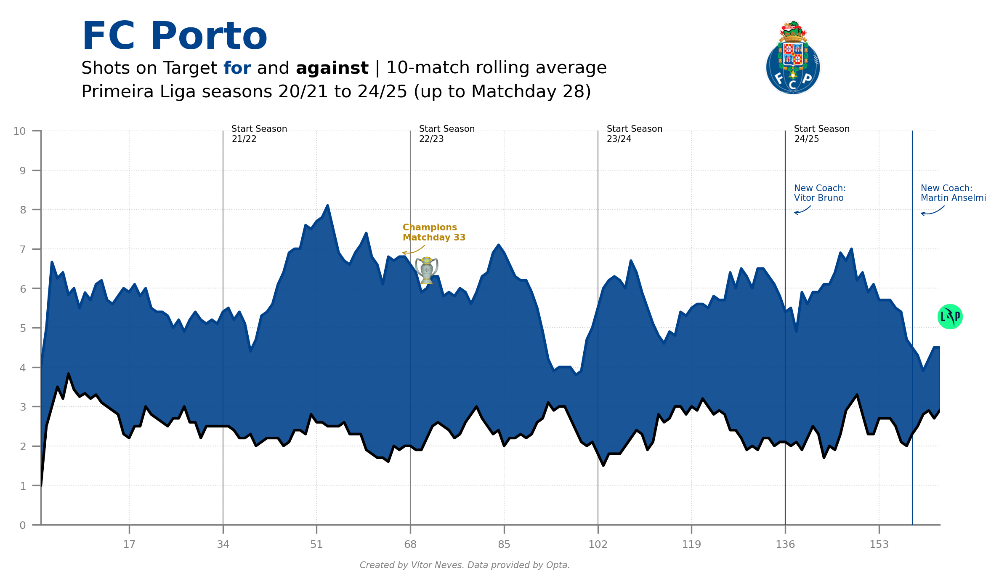

In [306]:
# ------------------------------
# IMPORTS
# ------------------------------
import matplotlib.pyplot as plt
import pandas as pd
from urllib.request import urlopen
from PIL import Image
import matplotlib.ticker as ticker
from highlight_text import fig_text

# ------------------------------
# FIGURE SETUP
# ------------------------------
fig = plt.figure(figsize=(8, 4), dpi=300, facecolor="white")
ax = plt.subplot(111, facecolor="white")

# Spine and grid styling
ax.spines[["top", "right"]].set_visible(False)
ax.spines[["left", "bottom"]].set_color("grey")
ax.grid(visible=True, lw=0.5, ls=":", color="lightgrey", zorder=1)

# ------------------------------
# DATA PLOTTING
# ------------------------------
matchdays = range(1, 165)
line_1 = ax.plot(matchdays, Y_for, color="#00428C", zorder=4)  # Accurate Passes for
line_2 = ax.plot(matchdays, Y_ag, color="#000000", zorder=4)  # Accurate Passes against

# Axis limits
ax.set_xlim(1, len(Y_for))
ax.set_ylim(0, 10)


# ------------------------------
# SEASON MARKERS
# ------------------------------
SEASON_BREAKS = [34, 68, 102, 136, 170]
SEASON_ANNOTATIONS = [
    (34, 9.5, "Start Season\n21/22"),
    (68, 9.5, "Start Season\n22/23"),
    (102, 9.5, "Start Season\n23/24"),
    (136, 9.5, "Start Season\n24/25"),
]

COACH_ANNOTATIONS = [
    (136, 8, "New Coach:\nVítor Bruno", line_1[0].get_color()),
    (159, 8, "New Coach:\nMartin Anselmi", line_1[0].get_color()),
]

# Vertical season dividers
for x in SEASON_BREAKS:
    ax.plot(
        [x, x],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color="grey",
        zorder=3,
    )

# Vertical coach change dividers
for x_val, _, _, color in COACH_ANNOTATIONS:
    ax.plot(
        [x_val, x_val],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color=color,
        zorder=3,
    )

# ------------------------------
# ANNOTATIONS
# ------------------------------
ARROW_STYLE = dict(
    arrowstyle="->",
    shrinkA=0,
    shrinkB=5,
    linewidth=0.5,
    connectionstyle="angle3,angleA=60,angleB=-30",
    zorder=4,
)

# Season start labels
for x, y, text in SEASON_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color="black",
        arrowprops=ARROW_STYLE,
        zorder=4,
    )

# Coach labels
for x, y, text, color in COACH_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color=color,
        arrowprops={**ARROW_STYLE, "color": color},
        zorder=4,
    )

# Championship annotation
ax.annotate(
    xy=(65, 7),
    xytext=(5, 5),
    textcoords="offset points",
    text="Champions\nMatchday 33",
    size=5,
    color="#B8860B",
    weight="bold",
    arrowprops=dict(
        arrowstyle="->",
        shrinkA=0,
        shrinkB=5,
        color="#B8860B",
        linewidth=0.5,
        connectionstyle="angle3,angleA=60,angleB=-30",
    ),
    zorder=4,
)

# ------------------------------
# FILL BETWEEN AREAS
# ------------------------------
ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_for["Value"] > Y_ag["Value"],
    interpolate=True,
    alpha=0.90,
    zorder=3,
    color=line_1[0].get_color(),
)

ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_ag["Value"] > Y_for["Value"],
    interpolate=True,
    alpha=0.90,
    color=line_2[0].get_color(),
    zorder=3,
)

# ------------------------------
# TICK FORMATTING
# ------------------------------
ax.tick_params(
    color="grey", length=5, which="major", labelsize=6, labelcolor="grey", zorder=3
)
ax.xaxis.set_major_locator(ticker.MultipleLocator(17))
ax.yaxis.set_major_locator(ticker.MultipleLocator(1))

# ------------------------------
# TITLES & TEXT
# ------------------------------
fig_text(
    x=0.12,
    y=1.1,
    s="FC Porto",
    color=line_1[0].get_color(),
    weight="bold",
    size=22,
    annotationbbox_kw={"xycoords": "figure fraction"},
)

fig_text(
    x=0.12,
    y=1.02,
    s="Shots on Target <for> and <against> | 10-match rolling average \nPrimeira Liga seasons 20/21 to 24/25 (up to Matchday 28)",
    highlight_textprops=[
        {"color": line_1[0].get_color(), "weight": "bold"},
        {"color": line_2[0].get_color(), "weight": "bold"},
    ],
    color="black",
    size=10,
    annotationbbox_kw={"xycoords": "figure fraction"},
)


# ------------------------------
# LOGO PLACEMENT
# ------------------------------
def data_to_fig_coords(ax, x_data, y_data, fig):
    """Convert data coordinates to figure coordinates [0-1 range]"""
    display_coords = ax.transData.transform((x_data, y_data))
    fig_width, fig_height = fig.get_size_inches() * fig.dpi
    return display_coords[0] / fig_width, display_coords[1] / fig_height


def add_logo(fig, image, x_pos, y_pos, width=0.05, height=0.05):
    """Helper to add logos at specified positions"""
    logo_ax = fig.add_axes([x_pos, y_pos, width, height], zorder=4)
    logo_ax.imshow(image, extent=[0.25, 0.75, 0.25, 0.75])
    logo_ax.axis("off")


# Load logos
team_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/teamlogo/9773.png")
)
competition_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/leaguelogo/61.png")
)
trophy_logo = Image.open(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\Primeira_Liga_Trophy.png"
)

# Calculate logo positions
fig_rel_x, fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[163]), float(Y_for["Value"].iloc[163]), fig
)
trophy_fig_rel_x, trophy_fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[66]), float(Y_for["Value"].iloc[66]-0.75), fig
)

# Add logos
add_logo(fig, team_logo, 0.75, 0.95, 0.15, 0.15)  # Top-right
add_logo(fig, competition_logo, fig_rel_x + 0.06, fig_rel_y + 0.03)  # Last data point
add_logo(
    fig, trophy_logo, trophy_fig_rel_x, trophy_fig_rel_y, 0.055, 0.055
)  # Championship point

# Add footer text
fig.text(
    0.5,
    0.015,
    "Created by Vítor Neves. Data provided by Opta.",
    fontstyle="italic",
    ha="center",
    fontsize=5,
    color="grey",
)

# ------------------------------
# SAFE LAYOUT ADJUSTMENT (Avoids warning)
# ------------------------------
def auto_adjust_layout(fig, top=0.88, bottom=0.10, left=0.08, right=0.97):
    """
    Ajusta margens de forma segura, evitando problemas com add_axes.
    """
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right)


auto_adjust_layout(fig)

# ------------------------------
# FINAL SAVE
# ------------------------------
fig.savefig(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\media\Shots_on_Target_Porto_10Rolling_Average_1920_2425.jpg",
    transparent=True,
    bbox_inches="tight",
    dpi=300,
)


### Fouls Committed

#### Variable Selection

In [307]:
variable_for = "Fouls Committed for"
variable_ag = "Fouls Committed ag"

#### Rolling metrics calculation

In [308]:
# xG conceded and xG created
Y_for = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_for
].reset_index(drop=True)
Y_ag = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_ag
].reset_index(drop=True)
X = pd.Series(range(len(Y_for)))

# compute the rolling average (min_periods is used for the partial average)
# here we're using a 10 game rolling average
Y_for["Value"] = Y_for["Value"].rolling(window=10, min_periods=0).mean()
Y_ag["Value"] = Y_ag["Value"].rolling(window=10, min_periods=0).mean()

Y_for = Y_for[["Value"]].reset_index(drop=True)
Y_ag = Y_ag[["Value"]].reset_index(drop=True)

display(Y_for.head())
display(Y_ag.head())

,Value
0,18.000000
1,18.500000
2,18.666667
3,19.000000
4,18.400000


,Value
0,18.000000
1,18.500000
2,17.666667
3,17.500000
4,16.800000


#### Fouls Comitted Data Viz

##### Plotting the visualization

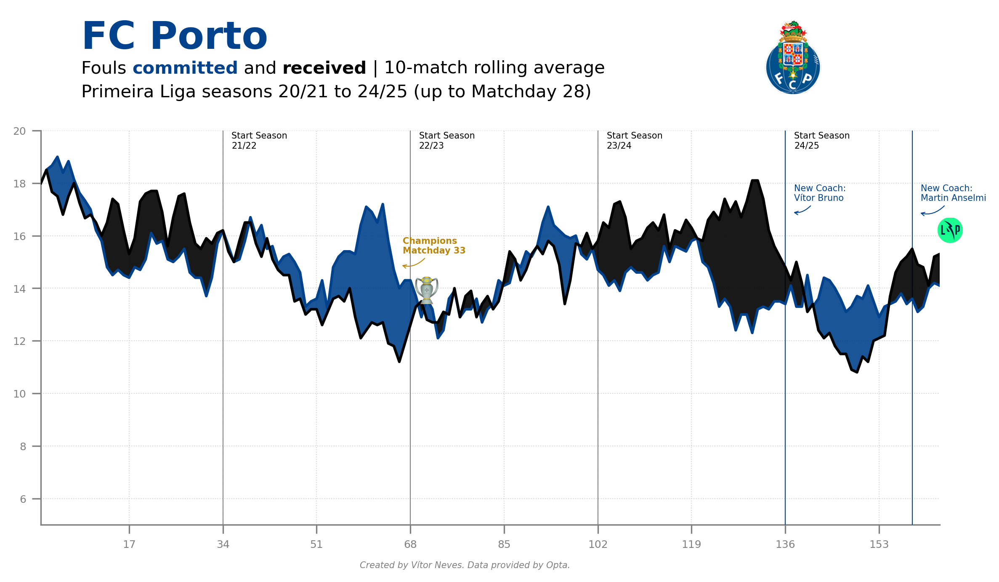

In [309]:
# ------------------------------
# IMPORTS
# ------------------------------
import matplotlib.pyplot as plt
import pandas as pd
from urllib.request import urlopen
from PIL import Image
import matplotlib.ticker as ticker
from highlight_text import fig_text

# ------------------------------
# FIGURE SETUP
# ------------------------------
fig = plt.figure(figsize=(8, 4), dpi=300, facecolor="white")
ax = plt.subplot(111, facecolor="white")

# Spine and grid styling
ax.spines[["top", "right"]].set_visible(False)
ax.spines[["left", "bottom"]].set_color("grey")
ax.grid(visible=True, lw=0.5, ls=":", color="lightgrey", zorder=1)

# ------------------------------
# DATA PLOTTING
# ------------------------------
matchdays = range(1, 165)
line_1 = ax.plot(matchdays, Y_for, color="#00428C", zorder=4)  # Accurate Passes for
line_2 = ax.plot(matchdays, Y_ag, color="#000000", zorder=4)  # Accurate Passes against

# Axis limits
ax.set_xlim(1, len(Y_for))
ax.set_ylim(5, 20)


# ------------------------------
# SEASON MARKERS
# ------------------------------
SEASON_BREAKS = [34, 68, 102, 136, 170]
SEASON_ANNOTATIONS = [
    (34, 19, "Start Season\n21/22"),
    (68, 19, "Start Season\n22/23"),
    (102, 19, "Start Season\n23/24"),
    (136, 19, "Start Season\n24/25"),
]

COACH_ANNOTATIONS = [
    (136, 17, "New Coach:\nVítor Bruno", line_1[0].get_color()),
    (159, 17, "New Coach:\nMartin Anselmi", line_1[0].get_color()),
]

# Vertical season dividers
for x in SEASON_BREAKS:
    ax.plot(
        [x, x],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color="grey",
        zorder=3,
    )

# Vertical coach change dividers
for x_val, _, _, color in COACH_ANNOTATIONS:
    ax.plot(
        [x_val, x_val],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color=color,
        zorder=3,
    )

# ------------------------------
# ANNOTATIONS
# ------------------------------
ARROW_STYLE = dict(
    arrowstyle="->",
    shrinkA=0,
    shrinkB=5,
    linewidth=0.5,
    connectionstyle="angle3,angleA=60,angleB=-30",
    zorder=4,
)

# Season start labels
for x, y, text in SEASON_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color="black",
        arrowprops=ARROW_STYLE,
        zorder=4,
    )

# Coach labels
for x, y, text, color in COACH_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color=color,
        arrowprops={**ARROW_STYLE, "color": color},
        zorder=4,
    )

# Championship annotation
ax.annotate(
    xy=(65, 15),
    xytext=(5, 5),
    textcoords="offset points",
    text="Champions\nMatchday 33",
    size=5,
    color="#B8860B",
    weight="bold",
    arrowprops=dict(
        arrowstyle="->",
        shrinkA=0,
        shrinkB=5,
        color="#B8860B",
        linewidth=0.5,
        connectionstyle="angle3,angleA=60,angleB=-30",
    ),
    zorder=4,
)

# ------------------------------
# FILL BETWEEN AREAS
# ------------------------------
ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_for["Value"] > Y_ag["Value"],
    interpolate=True,
    alpha=0.90,
    zorder=3,
    color=line_1[0].get_color(),
)

ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_ag["Value"] > Y_for["Value"],
    interpolate=True,
    alpha=0.90,
    color=line_2[0].get_color(),
    zorder=3,
)

# ------------------------------
# TICK FORMATTING
# ------------------------------
ax.tick_params(
    color="grey", length=5, which="major", labelsize=6, labelcolor="grey", zorder=3
)
ax.xaxis.set_major_locator(ticker.MultipleLocator(17))
ax.yaxis.set_major_locator(ticker.MultipleLocator(2))

# ------------------------------
# TITLES & TEXT
# ------------------------------
fig_text(
    x=0.12,
    y=1.1,
    s="FC Porto",
    color=line_1[0].get_color(),
    weight="bold",
    size=22,
    annotationbbox_kw={"xycoords": "figure fraction"},
)

fig_text(
    x=0.12,
    y=1.02,
    s="Fouls <committed> and <received> | 10-match rolling average \nPrimeira Liga seasons 20/21 to 24/25 (up to Matchday 28)",
    highlight_textprops=[
        {"color": line_1[0].get_color(), "weight": "bold"},
        {"color": line_2[0].get_color(), "weight": "bold"},
    ],
    color="black",
    size=10,
    annotationbbox_kw={"xycoords": "figure fraction"},
)


# ------------------------------
# LOGO PLACEMENT
# ------------------------------
def data_to_fig_coords(ax, x_data, y_data, fig):
    """Convert data coordinates to figure coordinates [0-1 range]"""
    display_coords = ax.transData.transform((x_data, y_data))
    fig_width, fig_height = fig.get_size_inches() * fig.dpi
    return display_coords[0] / fig_width, display_coords[1] / fig_height


def add_logo(fig, image, x_pos, y_pos, width=0.05, height=0.05):
    """Helper to add logos at specified positions"""
    logo_ax = fig.add_axes([x_pos, y_pos, width, height], zorder=4)
    logo_ax.imshow(image, extent=[0.25, 0.75, 0.25, 0.75])
    logo_ax.axis("off")


# Load logos
team_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/teamlogo/9773.png")
)
competition_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/leaguelogo/61.png")
)
trophy_logo = Image.open(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\Primeira_Liga_Trophy.png"
)

# Calculate logo positions
fig_rel_x, fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[163]), float(Y_for["Value"].iloc[163]), fig
)
trophy_fig_rel_x, trophy_fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[66]), float(Y_for["Value"].iloc[66]-1), fig
)

# Add logos
add_logo(fig, team_logo, 0.75, 0.95, 0.15, 0.15)  # Top-right
add_logo(fig, competition_logo, fig_rel_x + 0.06, fig_rel_y + 0.08)  # Last data point
add_logo(
    fig, trophy_logo, trophy_fig_rel_x, trophy_fig_rel_y, 0.055, 0.055
)  # Championship point

# Add footer text
fig.text(
    0.5,
    0.015,
    "Created by Vítor Neves. Data provided by Opta.",
    fontstyle="italic",
    ha="center",
    fontsize=5,
    color="grey",
)

# ------------------------------
# SAFE LAYOUT ADJUSTMENT (Avoids warning)
# ------------------------------
def auto_adjust_layout(fig, top=0.88, bottom=0.10, left=0.08, right=0.97):
    """
    Ajusta margens de forma segura, evitando problemas com add_axes.
    """
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right)


auto_adjust_layout(fig)

# ------------------------------
# FINAL SAVE
# ------------------------------
fig.savefig(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\media\Fouls_Comitted_Porto_10Rolling_Average_1920_2425.jpg",
    transparent=True,
    bbox_inches="tight",
    dpi=300,
)


### Corners

#### Variable Selection

In [310]:
variable_for = "Corners for"
variable_ag = "Corners ag"

#### Rolling metrics calculation

In [311]:
# xG conceded and xG created
Y_for = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_for
].reset_index(drop=True)
Y_ag = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_ag
].reset_index(drop=True)
X = pd.Series(range(len(Y_for)))

# compute the rolling average (min_periods is used for the partial average)
# here we're using a 10 game rolling average
Y_for["Value"] = Y_for["Value"].rolling(window=10, min_periods=0).mean()
Y_ag["Value"] = Y_ag["Value"].rolling(window=10, min_periods=0).mean()

Y_for = Y_for[["Value"]].reset_index(drop=True)
Y_ag = Y_ag[["Value"]].reset_index(drop=True)

display(Y_for.head())
display(Y_ag.head())

,Value
0,5.000000
1,3.500000
2,5.333333
3,4.250000
4,5.000000


,Value
0,1.000000
1,2.000000
2,1.333333
3,2.000000
4,2.200000


#### Corners Data Viz

##### Plotting the visualization

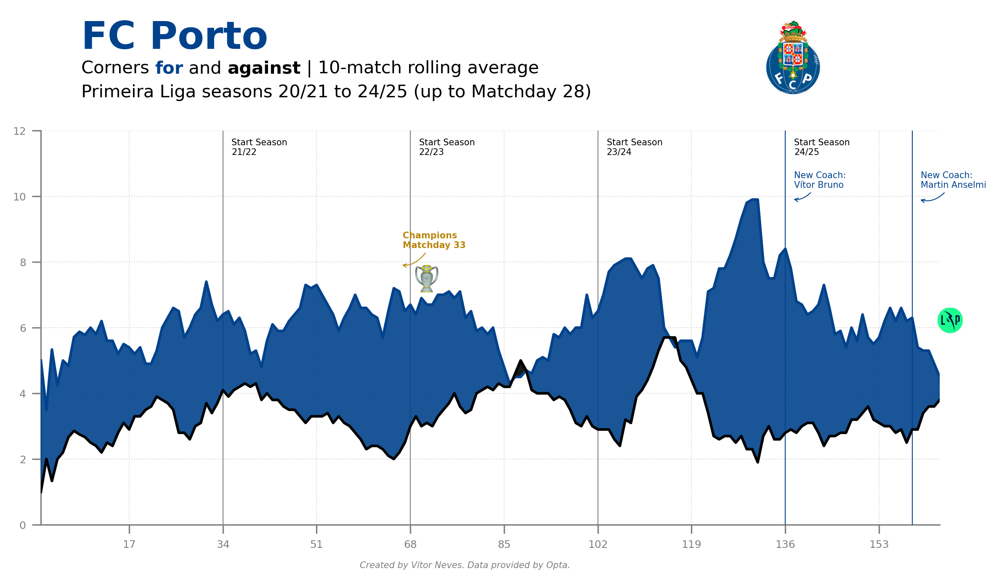

In [312]:
# ------------------------------
# IMPORTS
# ------------------------------
import matplotlib.pyplot as plt
import pandas as pd
from urllib.request import urlopen
from PIL import Image
import matplotlib.ticker as ticker
from highlight_text import fig_text

# ------------------------------
# FIGURE SETUP
# ------------------------------
fig = plt.figure(figsize=(8, 4), dpi=300, facecolor="white")
ax = plt.subplot(111, facecolor="white")

# Spine and grid styling
ax.spines[["top", "right"]].set_visible(False)
ax.spines[["left", "bottom"]].set_color("grey")
ax.grid(visible=True, lw=0.5, ls=":", color="lightgrey", zorder=1)

# ------------------------------
# DATA PLOTTING
# ------------------------------
matchdays = range(1, 165)
line_1 = ax.plot(matchdays, Y_for, color="#00428C", zorder=4)  # Accurate Passes for
line_2 = ax.plot(matchdays, Y_ag, color="#000000", zorder=4)  # Accurate Passes against

# Axis limits
ax.set_xlim(1, len(Y_for))
ax.set_ylim(0, 12)


# ------------------------------
# SEASON MARKERS
# ------------------------------
SEASON_BREAKS = [34, 68, 102, 136, 170]
SEASON_ANNOTATIONS = [
    (34, 11, "Start Season\n21/22"),
    (68, 11, "Start Season\n22/23"),
    (102, 11, "Start Season\n23/24"),
    (136, 11, "Start Season\n24/25"),
]

COACH_ANNOTATIONS = [
    (136, 10, "New Coach:\nVítor Bruno", line_1[0].get_color()),
    (159, 10, "New Coach:\nMartin Anselmi", line_1[0].get_color()),
]

# Vertical season dividers
for x in SEASON_BREAKS:
    ax.plot(
        [x, x],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color="grey",
        zorder=3,
    )

# Vertical coach change dividers
for x_val, _, _, color in COACH_ANNOTATIONS:
    ax.plot(
        [x_val, x_val],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color=color,
        zorder=3,
    )

# ------------------------------
# ANNOTATIONS
# ------------------------------
ARROW_STYLE = dict(
    arrowstyle="->",
    shrinkA=0,
    shrinkB=5,
    linewidth=0.5,
    connectionstyle="angle3,angleA=60,angleB=-30",
    zorder=4,
)

# Season start labels
for x, y, text in SEASON_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color="black",
        # arrowprops=ARROW_STYLE,
        zorder=4,
    )

# Coach labels
for x, y, text, color in COACH_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color=color,
        arrowprops={**ARROW_STYLE, "color": color},
        zorder=4,
    )

# Championship annotation
ax.annotate(
    xy=(65, 8),
    xytext=(5, 8),
    textcoords="offset points",
    text="Champions\nMatchday 33",
    size=5,
    color="#B8860B",
    weight="bold",
    arrowprops=dict(
        arrowstyle="->",
        shrinkA=0,
        shrinkB=5,
        color="#B8860B",
        linewidth=0.5,
        connectionstyle="angle3,angleA=60,angleB=-30",
    ),
    zorder=4,
)

# ------------------------------
# FILL BETWEEN AREAS
# ------------------------------
ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_for["Value"] > Y_ag["Value"],
    interpolate=True,
    alpha=0.90,
    zorder=3,
    color=line_1[0].get_color(),
)

ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_ag["Value"] > Y_for["Value"],
    interpolate=True,
    alpha=0.90,
    color=line_2[0].get_color(),
    zorder=3,
)

# ------------------------------
# TICK FORMATTING
# ------------------------------
ax.tick_params(
    color="grey", length=5, which="major", labelsize=6, labelcolor="grey", zorder=3
)
ax.xaxis.set_major_locator(ticker.MultipleLocator(17))
ax.yaxis.set_major_locator(ticker.MultipleLocator(2))

# ------------------------------
# TITLES & TEXT
# ------------------------------
fig_text(
    x=0.12,
    y=1.1,
    s="FC Porto",
    color=line_1[0].get_color(),
    weight="bold",
    size=22,
    annotationbbox_kw={"xycoords": "figure fraction"},
)

fig_text(
    x=0.12,
    y=1.02,
    s="Corners <for> and <against> | 10-match rolling average \nPrimeira Liga seasons 20/21 to 24/25 (up to Matchday 28)",
    highlight_textprops=[
        {"color": line_1[0].get_color(), "weight": "bold"},
        {"color": line_2[0].get_color(), "weight": "bold"},
    ],
    color="black",
    size=10,
    annotationbbox_kw={"xycoords": "figure fraction"},
)


# ------------------------------
# LOGO PLACEMENT
# ------------------------------
def data_to_fig_coords(ax, x_data, y_data, fig):
    """Convert data coordinates to figure coordinates [0-1 range]"""
    display_coords = ax.transData.transform((x_data, y_data))
    fig_width, fig_height = fig.get_size_inches() * fig.dpi
    return display_coords[0] / fig_width, display_coords[1] / fig_height


def add_logo(fig, image, x_pos, y_pos, width=0.05, height=0.05):
    """Helper to add logos at specified positions"""
    logo_ax = fig.add_axes([x_pos, y_pos, width, height], zorder=4)
    logo_ax.imshow(image, extent=[0.25, 0.75, 0.25, 0.75])
    logo_ax.axis("off")


# Load logos
team_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/teamlogo/9773.png")
)
competition_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/leaguelogo/61.png")
)
trophy_logo = Image.open(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\Primeira_Liga_Trophy.png"
)

# Calculate logo positions
fig_rel_x, fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[163]), float(Y_for["Value"].iloc[163]), fig
)
trophy_fig_rel_x, trophy_fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[66]), float(Y_for["Value"].iloc[66] + 0.5), fig
)

# Add logos
add_logo(fig, team_logo, 0.75, 0.95, 0.15, 0.15)  # Top-right
add_logo(fig, competition_logo, fig_rel_x + 0.06, fig_rel_y + 0.08)  # Last data point
add_logo(
    fig, trophy_logo, trophy_fig_rel_x, trophy_fig_rel_y, 0.055, 0.055
)  # Championship point

# Add footer text
fig.text(
    0.5,
    0.015,
    "Created by Vítor Neves. Data provided by Opta.",
    fontstyle="italic",
    ha="center",
    fontsize=5,
    color="grey",
)

# ------------------------------
# SAFE LAYOUT ADJUSTMENT (Avoids warning)
# ------------------------------
def auto_adjust_layout(fig, top=0.88, bottom=0.10, left=0.08, right=0.97):
    """
    Ajusta margens de forma segura, evitando problemas com add_axes.
    """
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right)


auto_adjust_layout(fig)

# ------------------------------
# FINAL SAVE
# ------------------------------
fig.savefig(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\media\Corners_Porto_10Rolling_Average_1920_2425.jpg",
    transparent=True,
    bbox_inches="tight",
    dpi=300,
)


### Big Chances

#### Variable Selection

In [313]:
variable_for = "Big Chances for"
variable_ag = "Big Chances ag"

#### Rolling metrics calculation

In [314]:
# xG conceded and xG created
Y_for = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_for
].reset_index(drop=True)
Y_ag = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_ag
].reset_index(drop=True)
X = pd.Series(range(len(Y_for)))

# compute the rolling average (min_periods is used for the partial average)
# here we're using a 10 game rolling average
Y_for["Value"] = Y_for["Value"].rolling(window=10, min_periods=0).mean()
Y_ag["Value"] = Y_ag["Value"].rolling(window=10, min_periods=0).mean()

Y_for = Y_for[["Value"]].reset_index(drop=True)
Y_ag = Y_ag[["Value"]].reset_index(drop=True)

display(Y_for.head())
display(Y_ag.head())

,Value
0,4.000000
1,4.500000
2,3.666667
3,3.500000
4,3.400000


,Value
0,1.000000
1,1.000000
2,1.333333
3,1.750000
4,1.400000


#### Big Chances Data Viz

##### Plotting the visualization

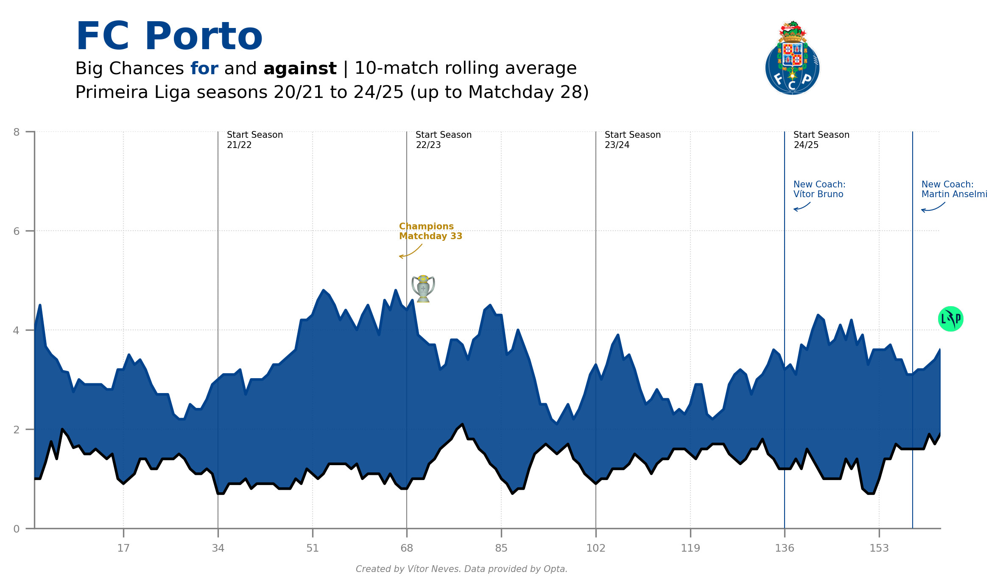

In [315]:
# ------------------------------
# IMPORTS
# ------------------------------
import matplotlib.pyplot as plt
import pandas as pd
from urllib.request import urlopen
from PIL import Image
import matplotlib.ticker as ticker
from highlight_text import fig_text

# ------------------------------
# FIGURE SETUP
# ------------------------------
fig = plt.figure(figsize=(8, 4), dpi=300, facecolor="white")
ax = plt.subplot(111, facecolor="white")

# Spine and grid styling
ax.spines[["top", "right"]].set_visible(False)
ax.spines[["left", "bottom"]].set_color("grey")
ax.grid(visible=True, lw=0.5, ls=":", color="lightgrey", zorder=1)

# ------------------------------
# DATA PLOTTING
# ------------------------------
matchdays = range(1, 165)
line_1 = ax.plot(matchdays, Y_for, color="#00428C", zorder=4)  # Accurate Passes for
line_2 = ax.plot(matchdays, Y_ag, color="#000000", zorder=4)  # Accurate Passes against

# Axis limits
ax.set_xlim(1, len(Y_for))
ax.set_ylim(0, 8)


# ------------------------------
# SEASON MARKERS
# ------------------------------
SEASON_BREAKS = [34, 68, 102, 136, 170]
SEASON_ANNOTATIONS = [
    (34, 7.5, "Start Season\n21/22"),
    (68, 7.5, "Start Season\n22/23"),
    (102, 7.5, "Start Season\n23/24"),
    (136, 7.5, "Start Season\n24/25"),
]

COACH_ANNOTATIONS = [
    (136, 6.5, "New Coach:\nVítor Bruno", line_1[0].get_color()),
    (159, 6.5, "New Coach:\nMartin Anselmi", line_1[0].get_color()),
]

# Vertical season dividers
for x in SEASON_BREAKS:
    ax.plot(
        [x, x],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color="grey",
        zorder=3,
    )

# Vertical coach change dividers
for x_val, _, _, color in COACH_ANNOTATIONS:
    ax.plot(
        [x_val, x_val],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color=color,
        zorder=3,
    )

# ------------------------------
# ANNOTATIONS
# ------------------------------
ARROW_STYLE = dict(
    arrowstyle="->",
    shrinkA=0,
    shrinkB=5,
    linewidth=0.5,
    connectionstyle="angle3,angleA=60,angleB=-30",
    zorder=4,
)

# Season start labels
for x, y, text in SEASON_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color="black",
        # arrowprops=ARROW_STYLE,
        zorder=4,
    )

# Coach labels
for x, y, text, color in COACH_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color=color,
        arrowprops={**ARROW_STYLE, "color": color},
        zorder=4,
    )

# Championship annotation
ax.annotate(
    xy=(65, 5.55),
    xytext=(5, 8),
    textcoords="offset points",
    text="Champions\nMatchday 33",
    size=5,
    color="#B8860B",
    weight="bold",
    arrowprops=dict(
        arrowstyle="->",
        shrinkA=0,
        shrinkB=5,
        color="#B8860B",
        linewidth=0.5,
        connectionstyle="angle3,angleA=60,angleB=-30",
    ),
    zorder=4,
)

# ------------------------------
# FILL BETWEEN AREAS
# ------------------------------
ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_for["Value"] > Y_ag["Value"],
    interpolate=True,
    alpha=0.90,
    zorder=3,
    color=line_1[0].get_color(),
)

ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_ag["Value"] > Y_for["Value"],
    interpolate=True,
    alpha=0.90,
    color=line_2[0].get_color(),
    zorder=3,
)

# ------------------------------
# TICK FORMATTING
# ------------------------------
ax.tick_params(
    color="grey", length=5, which="major", labelsize=6, labelcolor="grey", zorder=3
)
ax.xaxis.set_major_locator(ticker.MultipleLocator(17))
ax.yaxis.set_major_locator(ticker.MultipleLocator(2))

# ------------------------------
# TITLES & TEXT
# ------------------------------
fig_text(
    x=0.12,
    y=1.1,
    s="FC Porto",
    color=line_1[0].get_color(),
    weight="bold",
    size=22,
    annotationbbox_kw={"xycoords": "figure fraction"},
)

fig_text(
    x=0.12,
    y=1.02,
    s="Big Chances <for> and <against> | 10-match rolling average \nPrimeira Liga seasons 20/21 to 24/25 (up to Matchday 28)",
    highlight_textprops=[
        {"color": line_1[0].get_color(), "weight": "bold"},
        {"color": line_2[0].get_color(), "weight": "bold"},
    ],
    color="black",
    size=10,
    annotationbbox_kw={"xycoords": "figure fraction"},
)


# ------------------------------
# LOGO PLACEMENT
# ------------------------------
def data_to_fig_coords(ax, x_data, y_data, fig):
    """Convert data coordinates to figure coordinates [0-1 range]"""
    display_coords = ax.transData.transform((x_data, y_data))
    fig_width, fig_height = fig.get_size_inches() * fig.dpi
    return display_coords[0] / fig_width, display_coords[1] / fig_height


def add_logo(fig, image, x_pos, y_pos, width=0.05, height=0.05):
    """Helper to add logos at specified positions"""
    logo_ax = fig.add_axes([x_pos, y_pos, width, height], zorder=4)
    logo_ax.imshow(image, extent=[0.25, 0.75, 0.25, 0.75])
    logo_ax.axis("off")


# Load logos
team_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/teamlogo/9773.png")
)
competition_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/leaguelogo/61.png")
)
trophy_logo = Image.open(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\Primeira_Liga_Trophy.png"
)

# Calculate logo positions
fig_rel_x, fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[163]), float(Y_for["Value"].iloc[163]), fig
)
trophy_fig_rel_x, trophy_fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[66]), float(Y_for["Value"].iloc[66]), fig
)

# Add logos
add_logo(fig, team_logo, 0.75, 0.95, 0.15, 0.15)  # Top-right
add_logo(fig, competition_logo, fig_rel_x + 0.06, fig_rel_y + 0.03)  # Last data point
add_logo(
    fig, trophy_logo, trophy_fig_rel_x, trophy_fig_rel_y, 0.055, 0.055
)  # Championship point

# Add footer text
fig.text(
    0.5,
    0.015,
    "Created by Vítor Neves. Data provided by Opta.",
    fontstyle="italic",
    ha="center",
    fontsize=5,
    color="grey",
)

# ------------------------------
# SAFE LAYOUT ADJUSTMENT (Avoids warning)
# ------------------------------
def auto_adjust_layout(fig, top=0.88, bottom=0.10, left=0.08, right=0.97):
    """
    Ajusta margens de forma segura, evitando problemas com add_axes.
    """
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right)


auto_adjust_layout(fig)

# ------------------------------
# FINAL SAVE
# ------------------------------
fig.savefig(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\media\Big_Chances_Porto_10Rolling_Average_1920_2425.jpg",
    transparent=True,
    bbox_inches="tight",
    dpi=300,
)


### Total Shots

#### Variable Selection

In [316]:
variable_for = "Total Shots for"
variable_ag = "Total Shots ag"

#### Rolling metrics calculation

In [317]:
# xG conceded and xG created
Y_for = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_for
].reset_index(drop=True)
Y_ag = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_ag
].reset_index(drop=True)
X = pd.Series(range(len(Y_for)))

# compute the rolling average (min_periods is used for the partial average)
# here we're using a 10 game rolling average
Y_for["Value"] = Y_for["Value"].rolling(window=10, min_periods=0).mean()
Y_ag["Value"] = Y_ag["Value"].rolling(window=10, min_periods=0).mean()

Y_for = Y_for[["Value"]].reset_index(drop=True)
Y_ag = Y_ag[["Value"]].reset_index(drop=True)

display(Y_for.head())
display(Y_ag.head())

,Value
0,11.000000
1,13.000000
2,19.333333
3,17.000000
4,17.200000


,Value
0,7.000000
1,9.000000
2,9.666667
3,10.500000
4,11.000000


In [318]:
Y_for

,Value
0,11.000000
1,13.000000
2,19.333333
3,17.000000
4,17.200000
...,...
159,15.000000
160,14.500000
161,15.200000
162,15.300000


#### Total Shots Data Viz

##### Plotting the visualization

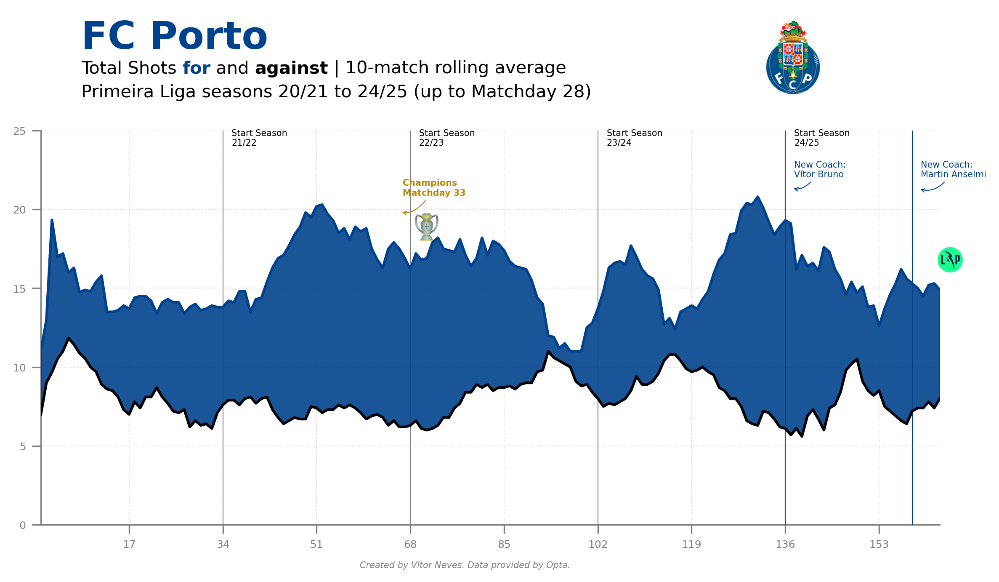

In [319]:
# ------------------------------
# IMPORTS
# ------------------------------
import matplotlib.pyplot as plt
import pandas as pd
from urllib.request import urlopen
from PIL import Image
import matplotlib.ticker as ticker
from highlight_text import fig_text

# ------------------------------
# FIGURE SETUP
# ------------------------------
fig = plt.figure(figsize=(8, 4), dpi=300, facecolor="white")
ax = plt.subplot(111, facecolor="white")

# Spine and grid styling
ax.spines[["top", "right"]].set_visible(False)
ax.spines[["left", "bottom"]].set_color("grey")
ax.grid(visible=True, lw=0.5, ls=":", color="lightgrey", zorder=1)

# ------------------------------
# DATA PLOTTING
# ------------------------------
matchdays = range(1, 165)
line_1 = ax.plot(matchdays, Y_for, color="#00428C", zorder=4)  # Accurate Passes for
line_2 = ax.plot(matchdays, Y_ag, color="#000000", zorder=4)  # Accurate Passes against

# Axis limits
ax.set_xlim(1, len(Y_for))
ax.set_ylim(0, 25)


# ------------------------------
# SEASON MARKERS
# ------------------------------
SEASON_BREAKS = [34, 68, 102, 136, 170]
SEASON_ANNOTATIONS = [
    (34, 23.5, "Start Season\n21/22"),
    (68, 23.5, "Start Season\n22/23"),
    (102, 23.5, "Start Season\n23/24"),
    (136, 23.5, "Start Season\n24/25"),
]

COACH_ANNOTATIONS = [
    (136, 21.5, "New Coach:\nVítor Bruno", line_1[0].get_color()),
    (159, 21.5, "New Coach:\nMartin Anselmi", line_1[0].get_color()),
]

# Vertical season dividers
for x in SEASON_BREAKS:
    ax.plot(
        [x, x],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color="grey",
        zorder=3,
    )

# Vertical coach change dividers
for x_val, _, _, color in COACH_ANNOTATIONS:
    ax.plot(
        [x_val, x_val],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color=color,
        zorder=3,
    )

# ------------------------------
# ANNOTATIONS
# ------------------------------
ARROW_STYLE = dict(
    arrowstyle="->",
    shrinkA=0,
    shrinkB=5,
    linewidth=0.5,
    connectionstyle="angle3,angleA=60,angleB=-30",
    zorder=4,
)

# Season start labels
for x, y, text in SEASON_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color="black",
        # arrowprops=ARROW_STYLE,
        zorder=4,
    )

# Coach labels
for x, y, text, color in COACH_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color=color,
        arrowprops={**ARROW_STYLE, "color": color},
        zorder=4,
    )

# Championship annotation
ax.annotate(
    xy=(65, 20),
    xytext=(5, 8),
    textcoords="offset points",
    text="Champions\nMatchday 33",
    size=5,
    color="#B8860B",
    weight="bold",
    arrowprops=dict(
        arrowstyle="->",
        shrinkA=0,
        shrinkB=5,
        color="#B8860B",
        linewidth=0.5,
        connectionstyle="angle3,angleA=60,angleB=-30",
    ),
    zorder=4,
)

# ------------------------------
# FILL BETWEEN AREAS
# ------------------------------
ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_for["Value"] > Y_ag["Value"],
    interpolate=True,
    alpha=0.90,
    zorder=3,
    color=line_1[0].get_color(),
)

ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_ag["Value"] > Y_for["Value"],
    interpolate=True,
    alpha=0.90,
    color=line_2[0].get_color(),
    zorder=3,
)

# ------------------------------
# TICK FORMATTING
# ------------------------------
ax.tick_params(
    color="grey", length=5, which="major", labelsize=6, labelcolor="grey", zorder=3
)
ax.xaxis.set_major_locator(ticker.MultipleLocator(17))
ax.yaxis.set_major_locator(ticker.MultipleLocator(5))

# ------------------------------
# TITLES & TEXT
# ------------------------------
fig_text(
    x=0.12,
    y=1.1,
    s="FC Porto",
    color=line_1[0].get_color(),
    weight="bold",
    size=22,
    annotationbbox_kw={"xycoords": "figure fraction"},
)

fig_text(
    x=0.12,
    y=1.02,
    s="Total Shots <for> and <against> | 10-match rolling average \nPrimeira Liga seasons 20/21 to 24/25 (up to Matchday 28)",
    highlight_textprops=[
        {"color": line_1[0].get_color(), "weight": "bold"},
        {"color": line_2[0].get_color(), "weight": "bold"},
    ],
    color="black",
    size=10,
    annotationbbox_kw={"xycoords": "figure fraction"},
)


# ------------------------------
# LOGO PLACEMENT
# ------------------------------
def data_to_fig_coords(ax, x_data, y_data, fig):
    """Convert data coordinates to figure coordinates [0-1 range]"""
    display_coords = ax.transData.transform((x_data, y_data))
    fig_width, fig_height = fig.get_size_inches() * fig.dpi
    return display_coords[0] / fig_width, display_coords[1] / fig_height


def add_logo(fig, image, x_pos, y_pos, width=0.05, height=0.05):
    """Helper to add logos at specified positions"""
    logo_ax = fig.add_axes([x_pos, y_pos, width, height], zorder=4)
    logo_ax.imshow(image, extent=[0.25, 0.75, 0.25, 0.75])
    logo_ax.axis("off")


# Load logos
team_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/teamlogo/9773.png")
)
competition_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/leaguelogo/61.png")
)
trophy_logo = Image.open(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\Primeira_Liga_Trophy.png"
)

# Calculate logo positions
fig_rel_x, fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[163]), float(Y_for["Value"].iloc[163]), fig
)
trophy_fig_rel_x, trophy_fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[66]), float(Y_for["Value"].iloc[66] + 1), fig
)

# Add logos
add_logo(fig, team_logo, 0.75, 0.95, 0.15, 0.15)  # Top-right
add_logo(fig, competition_logo, fig_rel_x + 0.06, fig_rel_y + 0.03)  # Last data point
add_logo(
    fig, trophy_logo, trophy_fig_rel_x, trophy_fig_rel_y, 0.055, 0.055
)  # Championship point

# Add footer text
fig.text(
    0.5,
    0.015,
    "Created by Vítor Neves. Data provided by Opta.",
    fontstyle="italic",
    ha="center",
    fontsize=5,
    color="grey",
)

# ------------------------------
# SAFE LAYOUT ADJUSTMENT (Avoids warning)
# ------------------------------
def auto_adjust_layout(fig, top=0.88, bottom=0.10, left=0.08, right=0.97):
    """
    Ajusta margens de forma segura, evitando problemas com add_axes.
    """
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right)


auto_adjust_layout(fig)

# ------------------------------
# FINAL SAVE
# ------------------------------
fig.savefig(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\media\Total_Shots_Porto_10Rolling_Average_1920_2425.jpg",
    transparent=True,
    bbox_inches="tight",
    dpi=300,
)


### Big Chances Missed

#### Variable Selection

In [320]:
variable_for = "Big Chances Missed for"
variable_ag = "Big Chances Missed ag"

#### Rolling metrics calculation

In [321]:
# xG conceded and xG created
Y_for = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_for
].reset_index(drop=True)
Y_ag = primeira_liga_1920_2425[
    primeira_liga_1920_2425["Variable"] == variable_ag
].reset_index(drop=True)
X = pd.Series(range(len(Y_for)))

# compute the rolling average (min_periods is used for the partial average)
# here we're using a 10 game rolling average
Y_for["Value"] = Y_for["Value"].rolling(window=10, min_periods=0).mean()
Y_ag["Value"] = Y_ag["Value"].rolling(window=10, min_periods=0).mean()

Y_for = Y_for[["Value"]].reset_index(drop=True)
Y_ag = Y_ag[["Value"]].reset_index(drop=True)

display(Y_for.head())
display(Y_ag.head())

,Value
0,2.00
1,2.00
2,2.00
3,1.75
4,1.80


,Value
0,1.000000
1,1.000000
2,0.666667
3,1.000000
4,0.800000


#### Big Chances Data Viz

##### Plotting the visualization

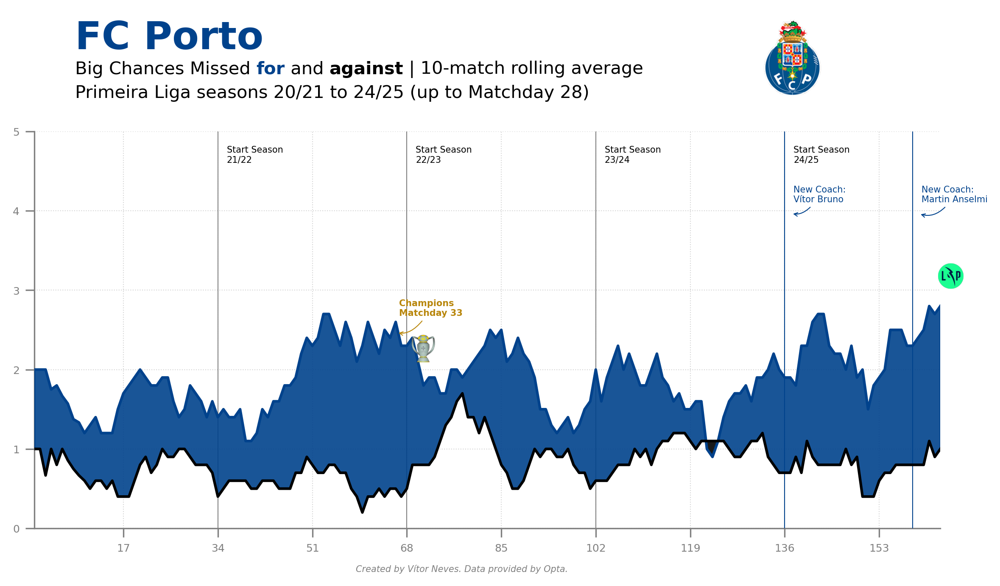

In [322]:
# ------------------------------
# IMPORTS
# ------------------------------
import matplotlib.pyplot as plt
import pandas as pd
from urllib.request import urlopen
from PIL import Image
import matplotlib.ticker as ticker
from highlight_text import fig_text

# ------------------------------
# FIGURE SETUP
# ------------------------------
fig = plt.figure(figsize=(8, 4), dpi=300, facecolor="white")
ax = plt.subplot(111, facecolor="white")

# Spine and grid styling
ax.spines[["top", "right"]].set_visible(False)
ax.spines[["left", "bottom"]].set_color("grey")
ax.grid(visible=True, lw=0.5, ls=":", color="lightgrey", zorder=1)

# ------------------------------
# DATA PLOTTING
# ------------------------------
matchdays = range(1, 165)
line_1 = ax.plot(matchdays, Y_for, color="#00428C", zorder=4)  # Accurate Passes for
line_2 = ax.plot(matchdays, Y_ag, color="#000000", zorder=4)  # Accurate Passes against

# Axis limits
ax.set_xlim(1, len(Y_for))
ax.set_ylim(0, 5)


# ------------------------------
# SEASON MARKERS
# ------------------------------
SEASON_BREAKS = [34, 68, 102, 136, 170]
SEASON_ANNOTATIONS = [
    (34, 4.5, "Start Season\n21/22"),
    (68, 4.5, "Start Season\n22/23"),
    (102, 4.5, "Start Season\n23/24"),
    (136, 4.5, "Start Season\n24/25"),
]

COACH_ANNOTATIONS = [
    (136, 4, "New Coach:\nVítor Bruno", line_1[0].get_color()),
    (159, 4, "New Coach:\nMartin Anselmi", line_1[0].get_color()),
]

# Vertical season dividers
for x in SEASON_BREAKS:
    ax.plot(
        [x, x],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color="grey",
        zorder=3,
    )

# Vertical coach change dividers
for x_val, _, _, color in COACH_ANNOTATIONS:
    ax.plot(
        [x_val, x_val],
        [ax.get_ylim()[0], ax.get_ylim()[1]],
        ls="-",
        lw=0.5,
        color=color,
        zorder=3,
    )

# ------------------------------
# ANNOTATIONS
# ------------------------------
ARROW_STYLE = dict(
    arrowstyle="->",
    shrinkA=0,
    shrinkB=5,
    linewidth=0.5,
    connectionstyle="angle3,angleA=60,angleB=-30",
    zorder=4,
)

# Season start labels
for x, y, text in SEASON_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color="black",
        # arrowprops=ARROW_STYLE,
        zorder=4,
    )

# Coach labels
for x, y, text, color in COACH_ANNOTATIONS:
    ax.annotate(
        text=text,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        size=5,
        color=color,
        arrowprops={**ARROW_STYLE, "color": color},
        zorder=4,
    )

# Championship annotation
ax.annotate(
    xy=(65, 2.5),
    xytext=(5, 8),
    textcoords="offset points",
    text="Champions\nMatchday 33",
    size=5,
    color="#B8860B",
    weight="bold",
    arrowprops=dict(
        arrowstyle="->",
        shrinkA=0,
        shrinkB=5,
        color="#B8860B",
        linewidth=0.5,
        connectionstyle="angle3,angleA=60,angleB=-30",
    ),
    zorder=4,
)

# ------------------------------
# FILL BETWEEN AREAS
# ------------------------------
ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_for["Value"] > Y_ag["Value"],
    interpolate=True,
    alpha=0.90,
    zorder=3,
    color=line_1[0].get_color(),
)

ax.fill_between(
    matchdays,
    Y_ag["Value"],
    Y_for["Value"],
    where=Y_ag["Value"] > Y_for["Value"],
    interpolate=True,
    alpha=0.90,
    color=line_2[0].get_color(),
    zorder=3,
)

# ------------------------------
# TICK FORMATTING
# ------------------------------
ax.tick_params(
    color="grey", length=5, which="major", labelsize=6, labelcolor="grey", zorder=3
)
ax.xaxis.set_major_locator(ticker.MultipleLocator(17))
ax.yaxis.set_major_locator(ticker.MultipleLocator(1))

# ------------------------------
# TITLES & TEXT
# ------------------------------
fig_text(
    x=0.12,
    y=1.1,
    s="FC Porto",
    color=line_1[0].get_color(),
    weight="bold",
    size=22,
    annotationbbox_kw={"xycoords": "figure fraction"},
)

fig_text(
    x=0.12,
    y=1.02,
    s="Big Chances Missed <for> and <against> | 10-match rolling average \nPrimeira Liga seasons 20/21 to 24/25 (up to Matchday 28)",
    highlight_textprops=[
        {"color": line_1[0].get_color(), "weight": "bold"},
        {"color": line_2[0].get_color(), "weight": "bold"},
    ],
    color="black",
    size=10,
    annotationbbox_kw={"xycoords": "figure fraction"},
)


# ------------------------------
# LOGO PLACEMENT
# ------------------------------
def data_to_fig_coords(ax, x_data, y_data, fig):
    """Convert data coordinates to figure coordinates [0-1 range]"""
    display_coords = ax.transData.transform((x_data, y_data))
    fig_width, fig_height = fig.get_size_inches() * fig.dpi
    return display_coords[0] / fig_width, display_coords[1] / fig_height


def add_logo(fig, image, x_pos, y_pos, width=0.05, height=0.05):
    """Helper to add logos at specified positions"""
    logo_ax = fig.add_axes([x_pos, y_pos, width, height], zorder=4)
    logo_ax.imshow(image, extent=[0.25, 0.75, 0.25, 0.75])
    logo_ax.axis("off")


# Load logos
team_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/teamlogo/9773.png")
)
competition_logo = Image.open(
    urlopen("https://images.fotmob.com/image_resources/logo/leaguelogo/61.png")
)
trophy_logo = Image.open(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\Primeira_Liga_Trophy.png"
)

# Calculate logo positions
fig_rel_x, fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[163]), float(Y_for["Value"].iloc[163]), fig
)
trophy_fig_rel_x, trophy_fig_rel_y = data_to_fig_coords(
    ax, float(X.iloc[66]), float(Y_for["Value"].iloc[66]-0.25), fig
)

# Add logos
add_logo(fig, team_logo, 0.75, 0.95, 0.15, 0.15)  # Top-right
add_logo(fig, competition_logo, fig_rel_x + 0.06, fig_rel_y + 0.03)  # Last data point
add_logo(
    fig, trophy_logo, trophy_fig_rel_x, trophy_fig_rel_y, 0.055, 0.055
)  # Championship point

# Add footer text
fig.text(
    0.5,
    0.015,
    "Created by Vítor Neves. Data provided by Opta.",
    fontstyle="italic",
    ha="center",
    fontsize=5,
    color="grey",
)
# ------------------------------
# SAFE LAYOUT ADJUSTMENT (Avoids warning)
# ------------------------------
def auto_adjust_layout(fig, top=0.88, bottom=0.10, left=0.08, right=0.97):
    """
    Ajusta margens de forma segura, evitando problemas com add_axes.
    """
    fig.subplots_adjust(top=top, bottom=bottom, left=left, right=right)


auto_adjust_layout(fig)

# ------------------------------
# FINAL SAVE
# ------------------------------
fig.savefig(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\jakeyk11\My_Projects\xG_Rolling_plot\media\Big_Chances_Missed_Porto_10Rolling_Average_1920_2425.jpg",
    transparent=True,
    bbox_inches="tight",
    dpi=300,
)
